In [1]:
set.seed(777)

#Load Libraries
library(Seurat)
library(SeuratDisk)
library(sctransform)
library(ggplot2)
library(patchwork)
library(RColorBrewer)
library(ComplexHeatmap)
library(S4Vectors)
library(future)
library(dplyr)
library(stringr)
library(cowplot)
library(harmony)
#library(DESeq2)
library(Signac)
library(monocle3)
library(Matrix)
library(SeuratWrappers)

#Set working directory
setwd("/storage1/fs1/jmillman/Active/DigitalTwin")

Loading required package: SeuratObject

Loading required package: sp


Attaching package: ‘SeuratObject’


The following objects are masked from ‘package:base’:

    intersect, saveRDS


Loading Seurat v5 beta version 
To maintain compatibility with previous workflows, new Seurat objects will use the previous object structure by default
To use new Seurat v5 assays please run: options(Seurat.object.assay.version = 'v5')

Registered S3 method overwritten by 'SeuratDisk':
  method            from  
  as.sparse.H5Group Seurat

Loading required package: grid

ComplexHeatmap version 2.15.4
Bioconductor page: http://bioconductor.org/packages/ComplexHeatmap/
Github page: https://github.com/jokergoo/ComplexHeatmap
Documentation: http://jokergoo.github.io/ComplexHeatmap-reference

If you use it in published research, please cite either one:
- Gu, Z. Complex Heatmap Visualization. iMeta 2022.
- Gu, Z. Complex heatmaps reveal patterns and correlations in multidimensional 
    genomic data. Bioinfo

In [2]:
# Define the desired order
desired_order <- c('Mesench.',
                   'UE',
                   'DE',
                   'GT',
                   'PP',
                   'Exo',
                   'eEP',
                   'lEP',
                   'Alpha',
                   'Delta',
                   'SIC',
                   'Beta'
)

pal <- c(
        "Mesench." = "#ffbd00",  # yellow
        "UE"       = "#EE3377", # magenta / raspberry
        "DE"       = "#a7defa", # light sky blue
        "GT"       = "#DDCC77", # warm sand / golden khaki
        "PP"       = "#402bad", # deep indigo #402bad
        "Exocrine" = "#117733", # forest green
        "eEP"      = "#fcb686", # light orange
        "lEP"       = '#cd853f', #Peru color
        "Alpha"    = "#f55e07", # vivid orange
        "Delta"    = "#7d9e31", # olive
        'SIC'      = "#015f94", # royal blue
        "Beta"     = "#ba0c2f" # WashU red
  )

# Prepare Pairwise subsets

In [16]:
i <- readRDS("checkpoints/DT_muon_annotated.rds")

i
# count the frequency of each unique value of 'orig.ident'
cell_count <- table(i@meta.data$orig.ident)
cell_count

An object of class Seurat 
95325 features across 401519 samples within 2 assays 
Active assay: RNA (17015 features, 5000 variable features)
 2 layers present: counts, data
 1 other assay present: ATAC
 17 dimensional reductions calculated: RNAHARMONY, RNAINTEGRATED_LSI, RNAMULTIVI, RNAPCA, RNAUMAP, RNAUMAP.HARMONY, RNAUMAP.INTEGRATED.ATAC, RNAUMAP.MERGED.RNA, ATACHARMONY, ATACINTEGRATED_LSI, ATACMULTIVI, ATACPCA, ATACUMAP, ATACUMAP.HARMONY, ATACUMAP.INTEGRATED.ATAC, ATACUMAP.MERGED.RNA, umap.multivi


     balboa.s5dt   balboa.s7w0a11    balboa.s7w0b3    balboa.s7w0b5 
            1453             4275             4034             3749 
  balboa.s7w3d18   balboa.s7w3d20   balboa.s7w3d25 balboa.s7w6exp22 
            3236             3167             3806             3096 
balboa.s7w6exp23      balboa.sndt          hua.d26         punn.esc 
            2189             1460             5962            14259 
       punn.ipsc        punn.sci1        punn.sci2        punn.sci3 
            3963             8729             7688            11092 
      punn.sciw3       punn.sciw4             s2d1             s3d1 
            7089             5468            13237             4490 
            s4d2             s5d1             s5d3             s5d5 
            5698             6944             5440             6759 
            s6d1            s6d14             s6d7       veres.s3x1 
            6224             9671             8089             7975 
      veres.s3x2       veres.s4x1

In [17]:
#Subsetting
No_ATAConly <- subset(i, subset = modality %in% c('paired','expression'))
rm(i)

In [4]:
table(No_ATAConly@meta.data$day)


 Day3  Day4  Day5  Day6  Day7  Day8  Day9 Day10 Day11 Day13 Day14 Day15 Day16 
 4149  3031 13237  9480  4490 13345  5010  5698  9520 18880 15546  5440  2913 
Day17 Day18 Day20 Day21 Day24 Day25 Day26 Day31 Day32 Day33 Day34 Day39 Day41 
15555  7088  6224 14405 13583  8802 14051  6108 20083  9671 42648 16584  7089 
Day45 Day48 Day66 
10209  5468  5285 

In [5]:
#Subsetting

PP_Exo_EP_Subset <- subset(No_ATAConly, subset = day %in% c('Day11', 'Day13', 'Day14',
                                                        'Day15','Day16 ','Day17', 'Day18', 'Day20','Day21',
                                                        'Day24'))

rm(No_ATAConly)

saveRDS(PP_Exo_EP_Subset, file = "checkpoints/DT_PP_Exo_EP_broad_Subset.rds")


# PP Exo EP

In [3]:
PP_Exo_EP_Subset <- readRDS("checkpoints/DT_PP_Exo_EP_broad_Subset.rds")

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



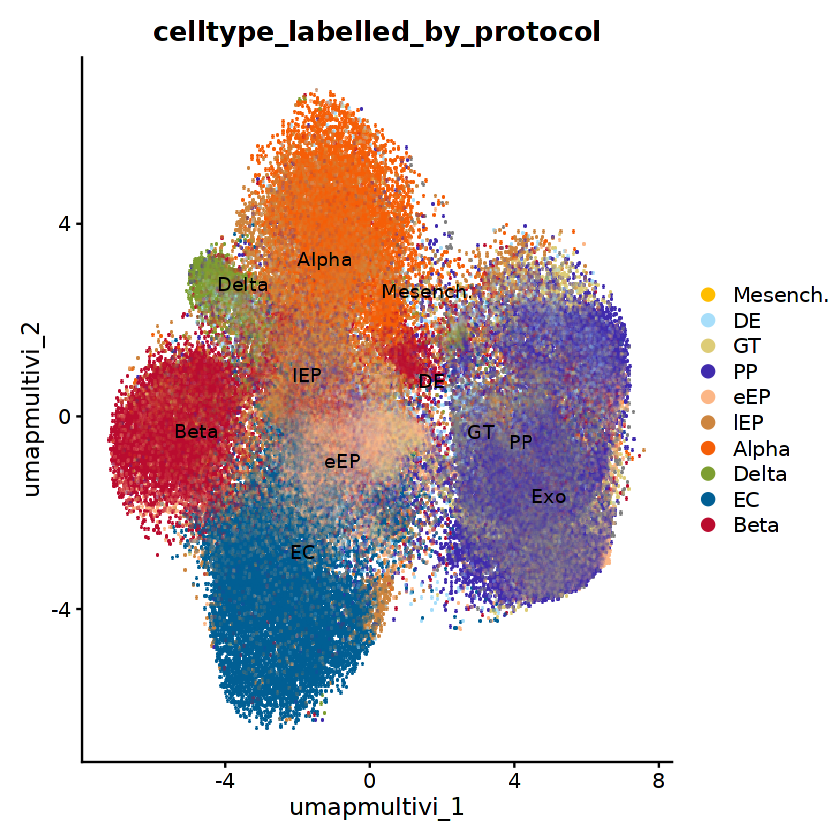

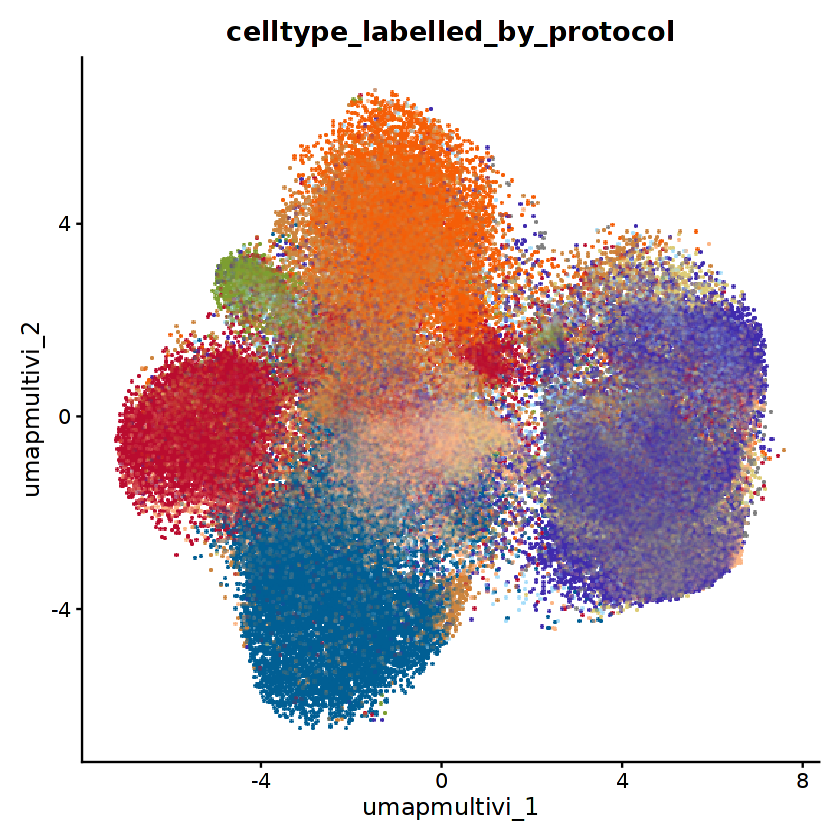

In [7]:
DimPlot(PP_Exo_EP_Subset, label = TRUE, repel = TRUE, 
        reduction = "umap.multivi",group.by = 'celltype_labelled_by_protocol', cols=pal,pt.size = 2) 

DimPlot(PP_Exo_EP_Subset, label = FALSE,  repel = TRUE, 
        reduction = "umap.multivi",group.by = 'celltype_labelled_by_protocol', cols=pal,pt.size = 2)  + theme(legend.position = "none")


In [8]:
# count the frequency of each unique value of 'orig.ident'
table(PP_Exo_EP_Subset@meta.data$orig.ident)
table(PP_Exo_EP_Subset@meta.data$protocol)
table(PP_Exo_EP_Subset@meta.data$day)


     balboa.s5dt   balboa.s7w0a11    balboa.s7w0b3    balboa.s7w0b5 
               0             4275             4034             3749 
  balboa.s7w3d18   balboa.s7w3d20   balboa.s7w3d25 balboa.s7w6exp22 
               0                0                0                0 
balboa.s7w6exp23      balboa.sndt          hua.d26         punn.esc 
               0                0                0                0 
       punn.ipsc        punn.sci1        punn.sci2        punn.sci3 
               0                0                0                0 
      punn.sciw3       punn.sciw4             s2d1             s3d1 
               0                0                0                0 
            s4d2             s5d1             s5d3             s5d5 
               0             6944             5440             6759 
            s6d1            s6d14             s6d7       veres.s3x1 
            6224                0                0                0 
      veres.s3x2       veres.s4x1


    Balboa        Hua Millman.v3    Rezania   Veres.x1   Veres.x2       Weng 
     12058          0      25367      15323      11119       7905       1946 
       Zhu 
     32523 


 Day3  Day4  Day5  Day6  Day7  Day8  Day9 Day10 Day11 Day13 Day14 Day15 Day16 
    0     0     0     0     0     0     0     0  9520 18880 15546  5440     0 
Day17 Day18 Day20 Day21 Day24 Day25 Day26 Day31 Day32 Day33 Day34 Day39 Day41 
15555  7088  6224 14405 13583     0     0     0     0     0     0     0     0 
Day45 Day48 Day66 
    0     0     0 

In [9]:
# ---- Objects to process ----
obj_names <- c("PP_Exo_EP_Subset"
)

# ---- Deterministic RNG / execution ----
set.seed(777)
RNGkind("L'Ecuyer-CMRG")
plan(sequential)

process_one <- function(obj, umap_seed = 777, cluster_seed = 777, reduction_pref = "RNAMULTIVI") {
  DefaultAssay(obj) <- "RNA"

  # 1) HVGs / Scale / PCA (for robustness & fallback)
  obj <- FindVariableFeatures(obj, nfeatures = 3000)
  obj <- ScaleData(obj, features = VariableFeatures(obj))
  obj <- RunPCA(obj, features = VariableFeatures(obj))

  # 2) Choose reduction: prefer RNAMULTIVI if present, else use PCA
  red_to_use <- if (reduction_pref %in% Reductions(obj)) reduction_pref else "pca"

  # 3) Neighbors / UMAP on chosen reduction
  obj <- FindNeighbors(
    obj,
    reduction = red_to_use,
    dims      = 1:30,
    verbose   = FALSE
  )

  obj <- RunUMAP(
    obj,
    reduction   = red_to_use,
    dims        = 1:30,
    umap.method = "uwot",
    metric      = "cosine",
    seed.use    = umap_seed,
    verbose     = FALSE
  )

  # 4) Cluster on the SNN made by FindNeighbors
  # Graph name depends on DefaultAssay when using PCA or on assay name when using RNAMULTIVI.
  # Commonly it's "RNA_snn" for RNA-based neighbors, so we try that first and fall back if needed.
  graph_candidates <- c("RNA_snn", "SCT_snn", "integrated_snn", "pca_snn")
  graph_name <- graph_candidates[graph_candidates %in% names(obj@graphs)][1]
  if (is.na(graph_name)) stop("No *_snn graph found after FindNeighbors.")

  obj <- FindClusters(
    obj,
    graph.name   = graph_name,
    resolution   = 2,
    random.seed  = cluster_seed,
    verbose      = FALSE
  )

  obj
}

# ---- Run over all objects, assign back ----
for (nm in obj_names) {
  if (!exists(nm, inherits = TRUE)) {
    message(sprintf("Skipping '%s' (object not found)", nm))
    next
  }
  message(sprintf("Processing %s ...", nm))
  x <- get(nm, inherits = TRUE)
  # continue even if one fails
  x2 <- tryCatch(
    process_one(x),
    error = function(e) {
      message(sprintf("  ✗ Error in %s: %s", nm, e$message))
      return(NULL)
    }
  )
  if (!is.null(x2)) {
    assign(nm, x2, envir = .GlobalEnv)
    message(sprintf("  ✓ Done: %s", nm))
  }
}

# Quick check (optional)
# lapply(obj_names, function(nm) if (exists(nm)) { print(nm); print(c(Reductions(get(nm)), names(get(nm)@graphs))) })


Processing PP_Exo_EP_Subset ...

Centering and scaling data matrix

PC_ 1 
Positive:  ANKS1B, FHIT, ADARB2, CACNA2D1, LINC00907, RYR2, TMTC2, ASIC2, SPAG16, SAMD12 
	   NPAS3, LINC01811, FAM135B, FAT3, FAM155A, ASTN2, AC073050.1, LRP1B, PDZRN3, LINC02197 
	   NEGR1, SLC24A3, UNC5D, RGL1, KLHL29, FOXP2, MAGI2, TRPS1, ULK4, SAMD3 
Negative:  ATP5G2, DLK1, GNB2L1, LDHB, GSTP1, NGFRAP1, POTEE, ANXA2, SPINK1, LRRC75A-AS1 
	   ID3, ATP5G3, KRT18, KRT8, SERPINA1, ATP5A1, CCND1, ATP5O, PTP4A1, C11orf31 
	   SEPW1, IGF2, ID2, WBP5, TUBA1B, ATP5B, ATP5C1, FTL, SUMO4, TMSB4X 
PC_ 2 
Positive:  FRAS1, LYPD6B, FN1, CASC15, KIAA1217, LAMA1, SLC4A4, MECOM, CDH6, MIR31HG 
	   C8orf34, LYPD6, TCF7L2, CUX2, FLRT2, NRG3, LTBP1, BMPR1B, NHS, SPTLC3 
	   NR5A2, ZFPM2, ARHGAP28, ONECUT1, TTC6, YAP1, MAGI1, TRABD2B, IGFBP2, C5 
Negative:  INS, STMN2, CRYBA2, ABCC8, SCGN, SCG5, MAFB, ACVR1C, PTPRN, SLC7A8 
	   HS6ST3, KCNMA1, GCG, NEUROD1, PAK3, TTR, ATP2A3, FEV, SLC30A8, CTNNA2 
	   SAMD3, PPP1R1A, PDE4D, CA

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



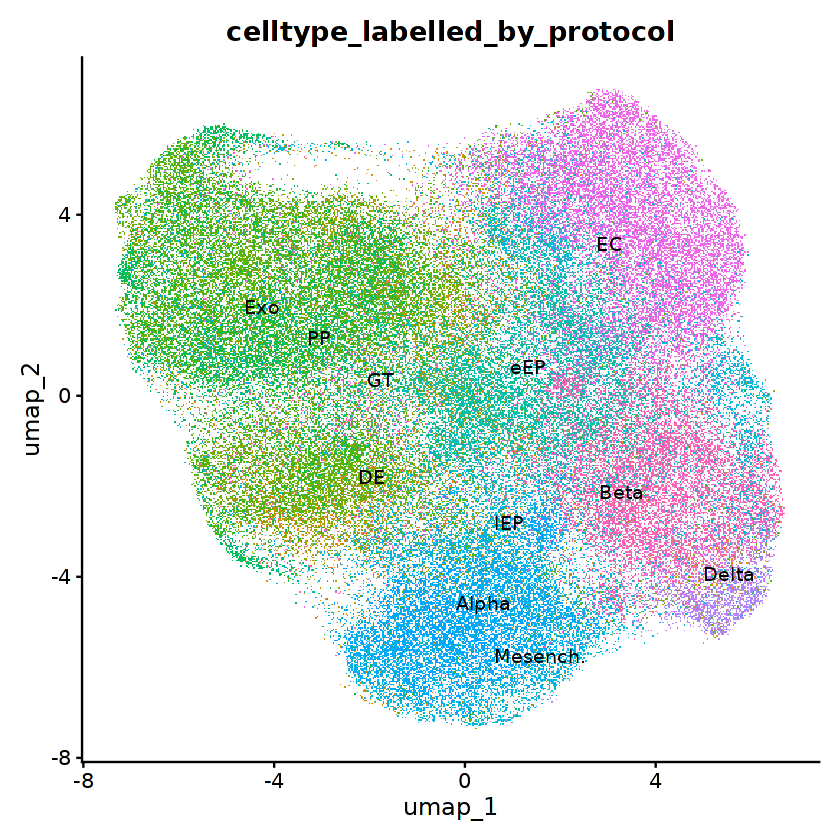

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



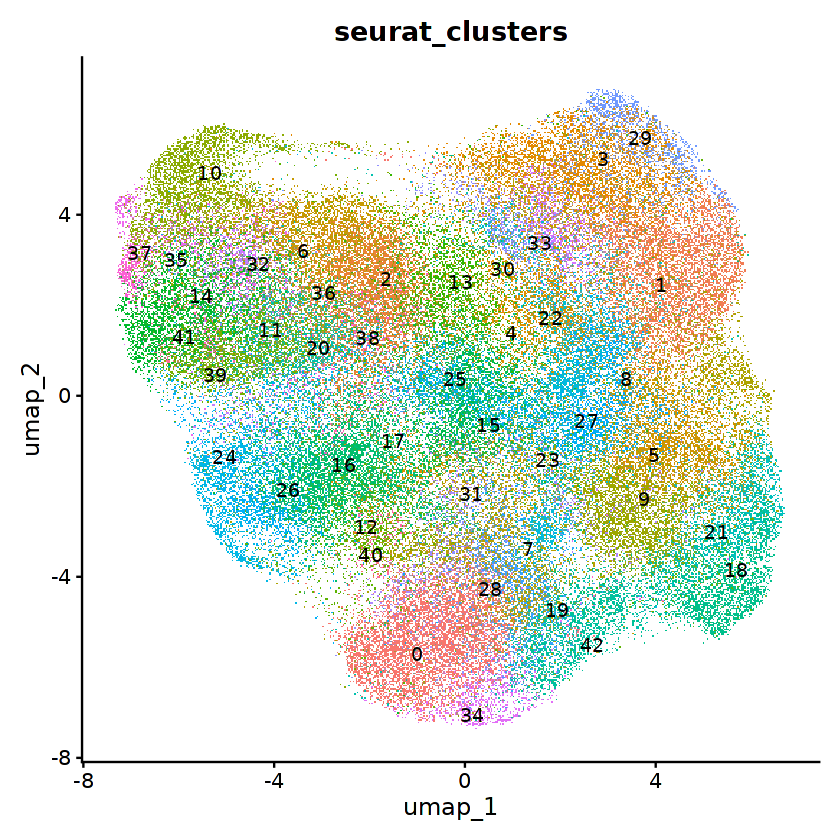

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



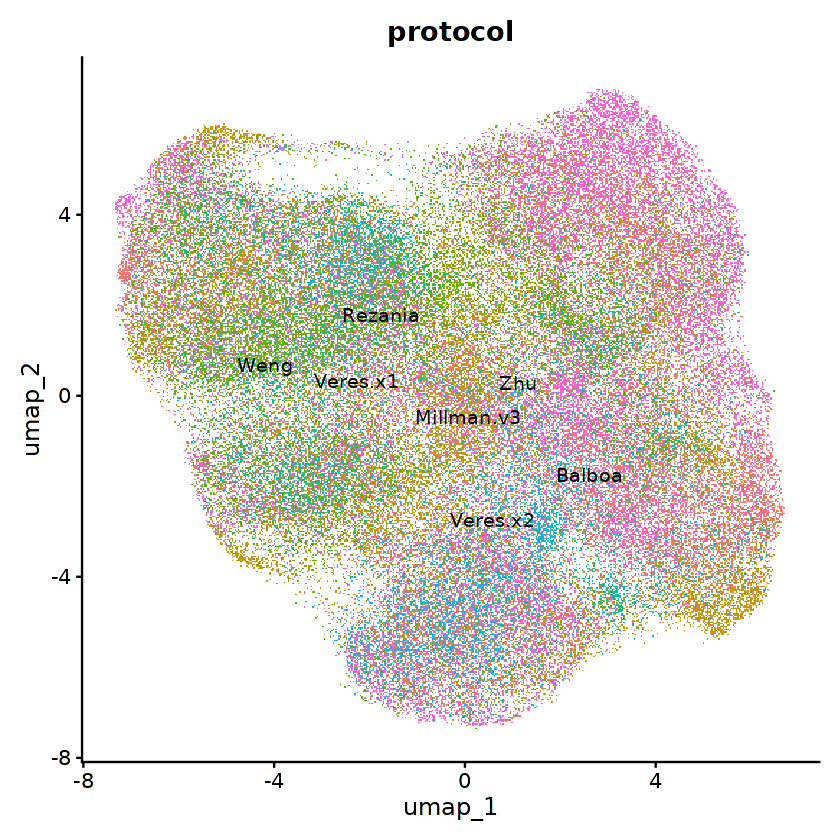

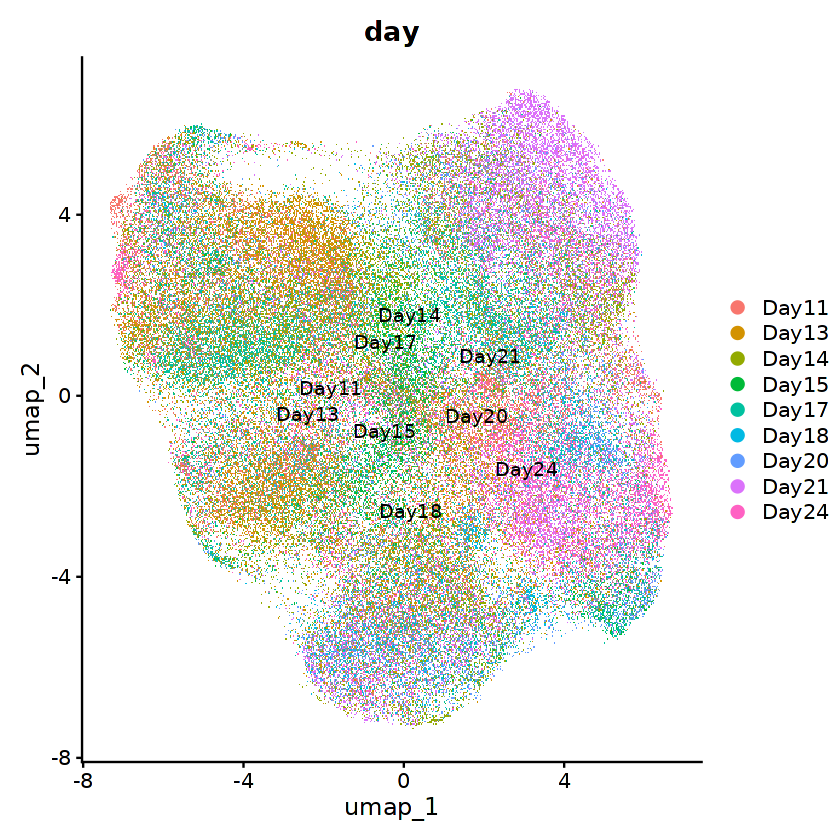

In [10]:
#PLOT UMAP figures
DefaultAssay(PP_Exo_EP_Subset) <- "RNA"

DimPlot(PP_Exo_EP_Subset, label = TRUE, repel = TRUE, 
        reduction = "umap",group.by = 'celltype_labelled_by_protocol')   + theme(legend.position = "none")

DimPlot(PP_Exo_EP_Subset, label = TRUE, repel = TRUE, 
        reduction = "umap",group.by = 'seurat_clusters')   + theme(legend.position = "none")

DimPlot(PP_Exo_EP_Subset, label = TRUE, repel = TRUE, 
        reduction = "umap",group.by = 'protocol')   + theme(legend.position = "none")

DimPlot(PP_Exo_EP_Subset, label = TRUE, repel = TRUE, 
        reduction = "umap",group.by = 'day')

In [ ]:
options(repr.plot.width = 8, repr.plot.height = 8)

DimPlot(PP_Exo_EP_Subset, reduction = 'umap', group.by = 'protocol', label=T)

DimPlot(PP_Exo_EP_Subset, reduction = 'umap', group.by = 'day', label=T) 

DimPlot(PP_Exo_EP_Subset, reduction = 'umap', group.by = 'seurat_clusters', label=T)

# ---- Settings ----
genes <- c(
  #'SOX17','CER1', 'CXCR4', 'EOMES', 'GSC', 'MIXL1', 'HHEX', #DE only
  #'GATA6','FOXA2','EPCAM', #DE and GT
  #'GATA4','HNF1B','HNF4A','ONECUT1','KRT8','KRT18', #GT
  'GATA4','GATA6','FOXA2',
  'SOX9','PDX1', #PP
  'CFTR','SPINK1','KRT7','KRT19','PTF1A', #Exo
  'CPA1','CPA2','PRSS1','PRSS2','CEL', #Exo
  'PNLIP','SOX9','HNF1B','KRT8','KRT18', 'SLC4A4',
  'NEUROG3','CHGA', #Endo
  'SLC18A1','TPH1',
  'NKX6-1','ERO1B','ISL1',
  'INS','IAPP',
  'HHEX','SST',
  'ARX','GCG',
  'TOP2A','MKI67'
    )

out_dir <- "outputs/PP_Exo_EP_Subset_DT_Gene_marker_plots"
if (!dir.exists(out_dir)) dir.create(out_dir, recursive = TRUE)

# ---- Check genes present ----
present <- genes[genes %in% rownames(PP_Exo_EP_Subset)]
missing <- setdiff(genes, present)
if (length(missing)) {
  message("Missing from object (skipped): ", paste(missing, collapse = ", "))
}

# ---- Plot & save ----
for (g in present) {
  # build a safe filename
  fname <- file.path(out_dir, paste0("FeaturePlot_", g, ".png"))

  # make the plot
  p <- tryCatch({
    FeaturePlot(
      PP_Exo_EP_Subset, features = g,
      reduction = "umap",
      order = TRUE,       # draws higher-expressing cells on top
      raster = TRUE,      # faster/lighter for big objs
      pt.size = 2.5
    ) +
      ggtitle(g) +
      theme(
        plot.title = element_text(hjust = 0.5, face = "bold"),
        legend.title = element_blank()
      )
  }, error = function(e) {
    warning(sprintf("Failed to plot %s: %s", g, e$message))
    NULL
  })

  # save
  if (!is.null(p)) {
    ggsave(
      filename = fname, plot = p,
      dpi = 600, width = 4, height = 4, units = "in",
      device = "png"
    )
  }
}


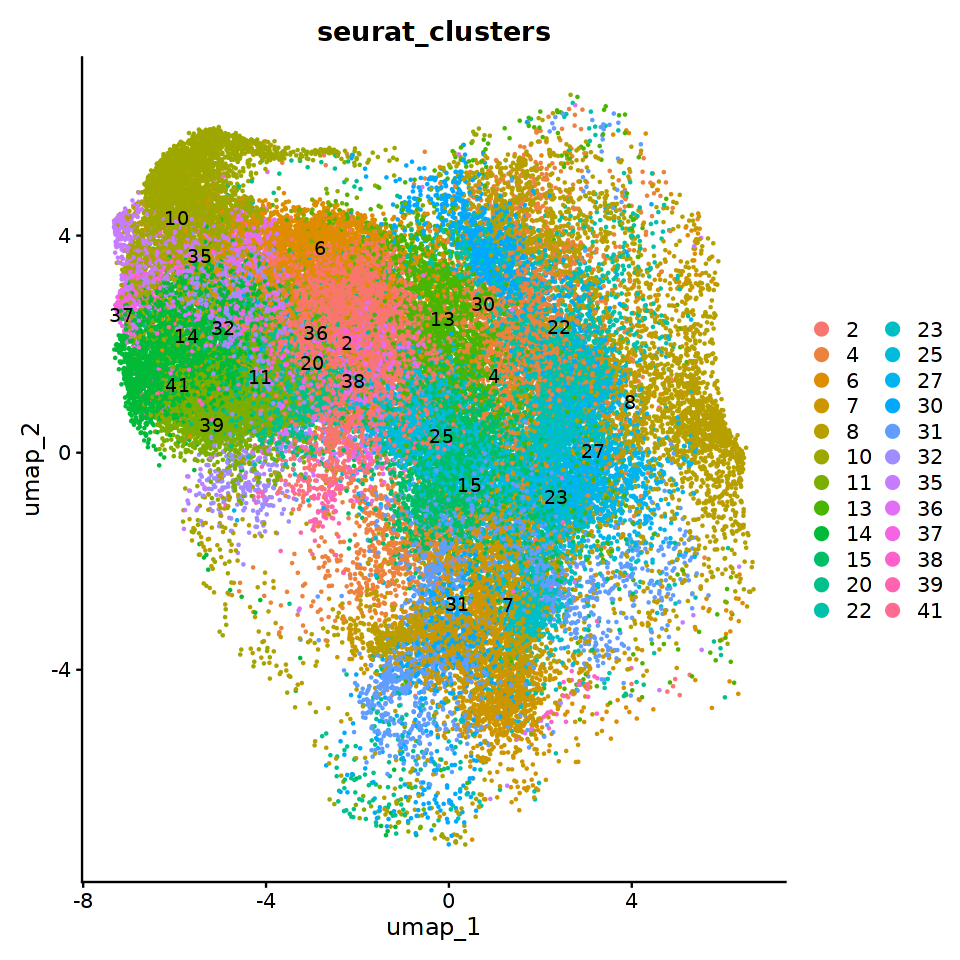

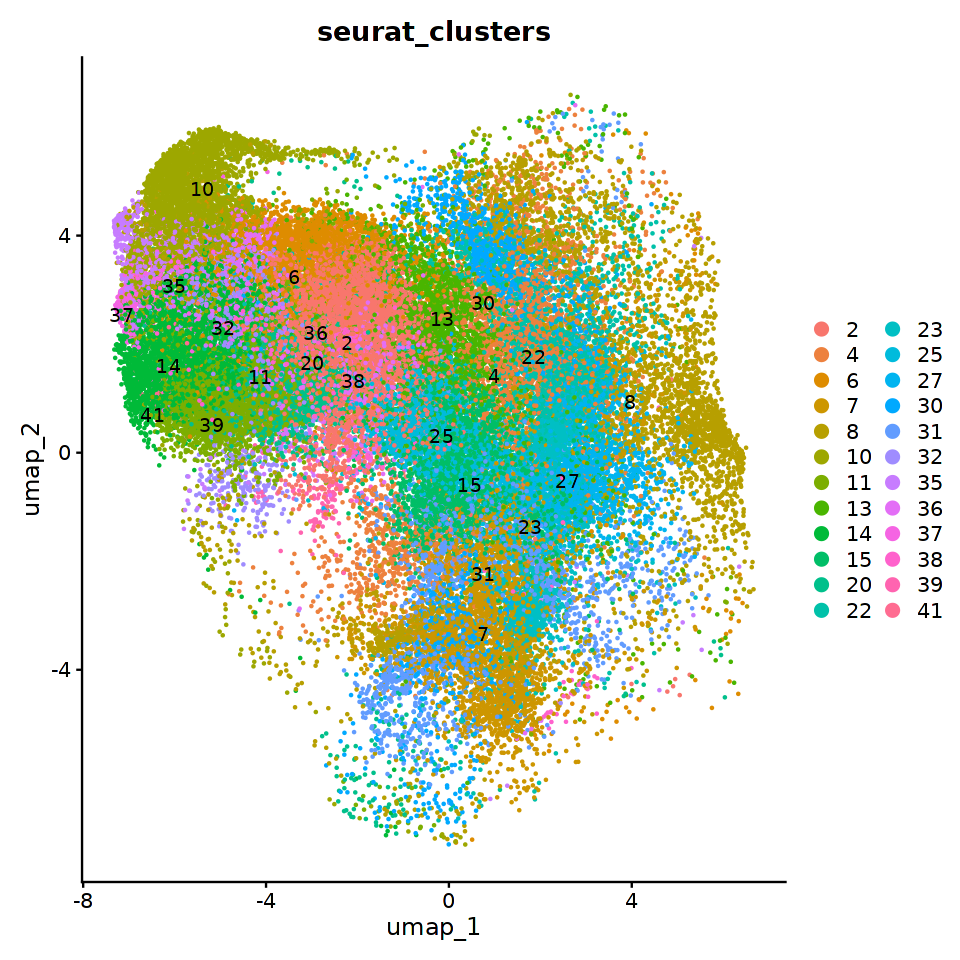

In [12]:
PP_Exo_EP_Subset_2 <- subset(PP_Exo_EP_Subset, subset = seurat_clusters %in%  c(         2,      4,      6,  7,  8,  
                                                                                10, 11,     13, 14, 15,          
                                                                                20,     22, 23,     25,     27,     
                                                                                30, 31, 32,         35, 36, 37, 38, 39,
                                                                                    41
                                                                               ))



DimPlot(PP_Exo_EP_Subset_2, label = TRUE, repel = TRUE, 
        reduction = "umap",group.by = 'seurat_clusters') 
DimPlot(PP_Exo_EP_Subset_2, label = TRUE, repel = TRUE, 
        reduction = "umap",group.by = 'seurat_clusters') 

In [14]:
# ---- Objects to process ----
obj_names <- c("PP_Exo_EP_Subset_2"
)

# ---- Deterministic RNG / execution ----
set.seed(777)
RNGkind("L'Ecuyer-CMRG")
plan(sequential)

process_one <- function(obj, umap_seed = 777, cluster_seed = 777, reduction_pref = "RNAMULTIVI") {
  DefaultAssay(obj) <- "RNA"

  # 1) HVGs / Scale / PCA (for robustness & fallback)
  obj <- FindVariableFeatures(obj, nfeatures = 3000)
  obj <- ScaleData(obj, features = VariableFeatures(obj))
  obj <- RunPCA(obj, features = VariableFeatures(obj))

  # 2) Choose reduction: prefer RNAMULTIVI if present, else use PCA
  red_to_use <- if (reduction_pref %in% Reductions(obj)) reduction_pref else "pca"

  # 3) Neighbors / UMAP on chosen reduction
  obj <- FindNeighbors(
    obj,
    reduction = red_to_use,
    dims      = 1:30,
    verbose   = FALSE
  )

  obj <- RunUMAP(
    obj,
    reduction   = red_to_use,
    dims        = 1:30,
    umap.method = "uwot",
    metric      = "cosine",
    seed.use    = umap_seed,
    verbose     = FALSE
  )

  # 4) Cluster on the SNN made by FindNeighbors
  # Graph name depends on DefaultAssay when using PCA or on assay name when using RNAMULTIVI.
  # Commonly it's "RNA_snn" for RNA-based neighbors, so we try that first and fall back if needed.
  graph_candidates <- c("RNA_snn", "SCT_snn", "integrated_snn", "pca_snn")
  graph_name <- graph_candidates[graph_candidates %in% names(obj@graphs)][1]
  if (is.na(graph_name)) stop("No *_snn graph found after FindNeighbors.")

  obj <- FindClusters(
    obj,
    graph.name   = graph_name,
    resolution   = 2,
    random.seed  = cluster_seed,
    verbose      = FALSE
  )

  obj
}

# ---- Run over all objects, assign back ----
for (nm in obj_names) {
  if (!exists(nm, inherits = TRUE)) {
    message(sprintf("Skipping '%s' (object not found)", nm))
    next
  }
  message(sprintf("Processing %s ...", nm))
  x <- get(nm, inherits = TRUE)
  # continue even if one fails
  x2 <- tryCatch(
    process_one(x),
    error = function(e) {
      message(sprintf("  ✗ Error in %s: %s", nm, e$message))
      return(NULL)
    }
  )
  if (!is.null(x2)) {
    assign(nm, x2, envir = .GlobalEnv)
    message(sprintf("  ✓ Done: %s", nm))
  }
}

# Quick check (optional)
# lapply(obj_names, function(nm) if (exists(nm)) { print(nm); print(c(Reductions(get(nm)), names(get(nm)@graphs))) })


Processing PP_Exo_EP_Subset_2 ...

Centering and scaling data matrix

PC_ 1 
Positive:  DLK1, GNB2L1, NGFRAP1, LRRC75A-AS1, SPINK1, ANXA2, ATP5G3, SERPINA1, KRT18, ATP5A1 
	   CCND1, FTL, ATP5O, ID3, POTEE, C11orf31, SEPW1, WBP5, ATP5B, KRT8 
	   SEPT7, SERPINA5, ATP5J, ATP5L, PTP4A1, NPC2, IGF2, S100A10, ZFP36L1, CALB1 
Negative:  CDKAL1, SGCD, CACNB2, HECW2, ANKS1B, RGS7, NAV3, SDK1, CACNA2D1, NPAS3 
	   DCC, FHIT, FRY, DSCAM, FSTL5, ASTN2, FAM155A, LINC00907, CACNA1C, CACNA1A 
	   FOXP2, GALNT13, NEGR1, TOX, TMTC2, GPHN, RYR2, LINC02197, NRXN1, PDZRN3 
PC_ 2 
Positive:  CACNA1A, STMN2, NEUROD1, SCGN, CRYBA2, KCNJ6, C1QL1, RIMBP2, PTPRN2, FEV 
	   KCNK17, NEGR1, SCG5, PCSK1N, GNAO1, FGF14, HEPACAM2, RYR2, NKX2-2, CACNA1C 
	   ASIC2, INSM1, CELF4, LINC01811, KCNK16, RUNX1T1, CNIH2, RGS9, DDC, NFASC 
Negative:  FRAS1, LYPD6B, KIAA1217, FN1, MECOM, TRABD2B, LAMA1, CDH6, CASC15, MAGI1 
	   SLC4A4, UTRN, C8orf34, BMPR1B, PDE3A, SPTLC3, LTBP1, MIR31HG, NHS, LYPD6 
	   MAML2, YAP1, FNDC3B, 

In [ ]:
options(repr.plot.width = 8, repr.plot.height = 8)

DimPlot(PP_Exo_EP_Subset_2, reduction = 'umap', group.by = 'protocol', label=T)

DimPlot(PP_Exo_EP_Subset_2, reduction = 'umap', group.by = 'day', label=T) 

DimPlot(PP_Exo_EP_Subset_2, reduction = 'umap', group.by = 'seurat_clusters', label=T)

# ---- Settings ----
genes <- c(
  #'SOX17','CER1', 'CXCR4', 'EOMES', 'GSC', 'MIXL1', 'HHEX', #DE only
  #'GATA6','FOXA2','EPCAM', #DE and GT
  #'GATA4','HNF1B','HNF4A','ONECUT1','KRT8','KRT18', #GT
  'GATA4','GATA6','FOXA2',
  'SOX9','PDX1', #PP
  'CFTR','SPINK1','KRT7','KRT19','PTF1A', #Exo
  'CPA1','CPA2','PRSS1','PRSS2', #Exo
  'PNLIP','SOX9','HNF1B','KRT8','KRT18', 'SLC4A4',
  'NEUROG3','CHGA', #Endo
  'SLC18A1','TPH1',
  'NKX6-1','ERO1B','ISL1',
  'INS','IAPP',
  'HHEX','SST',
  'ARX','GCG',
  'TOP2A','MKI67'
    )

out_dir <- "outputs/PP_Exo_EP_Subset_2_DT_Gene_marker_plots"
if (!dir.exists(out_dir)) dir.create(out_dir, recursive = TRUE)

# ---- Check genes present ----
present <- genes[genes %in% rownames(PP_Exo_EP_Subset_2)]
missing <- setdiff(genes, present)
if (length(missing)) {
  message("Missing from object (skipped): ", paste(missing, collapse = ", "))
}

# ---- Plot & save ----
for (g in present) {
  # build a safe filename
  fname <- file.path(out_dir, paste0("FeaturePlot_", g, ".png"))

  # make the plot
  p <- tryCatch({
    FeaturePlot(
      PP_Exo_EP_Subset_2, features = g,
      reduction = "umap",
      order = TRUE,       # draws higher-expressing cells on top
      raster = TRUE,      # faster/lighter for big objs
      pt.size = 2.5
    ) +
      ggtitle(g) +
      theme(
        plot.title = element_text(hjust = 0.5, face = "bold"),
        legend.title = element_blank()
      )
  }, error = function(e) {
    warning(sprintf("Failed to plot %s: %s", g, e$message))
    NULL
  })

  # save
  if (!is.null(p)) {
    ggsave(
      filename = fname, plot = p,
      dpi = 600, width = 4, height = 4, units = "in",
      device = "png"
    )
  }
}


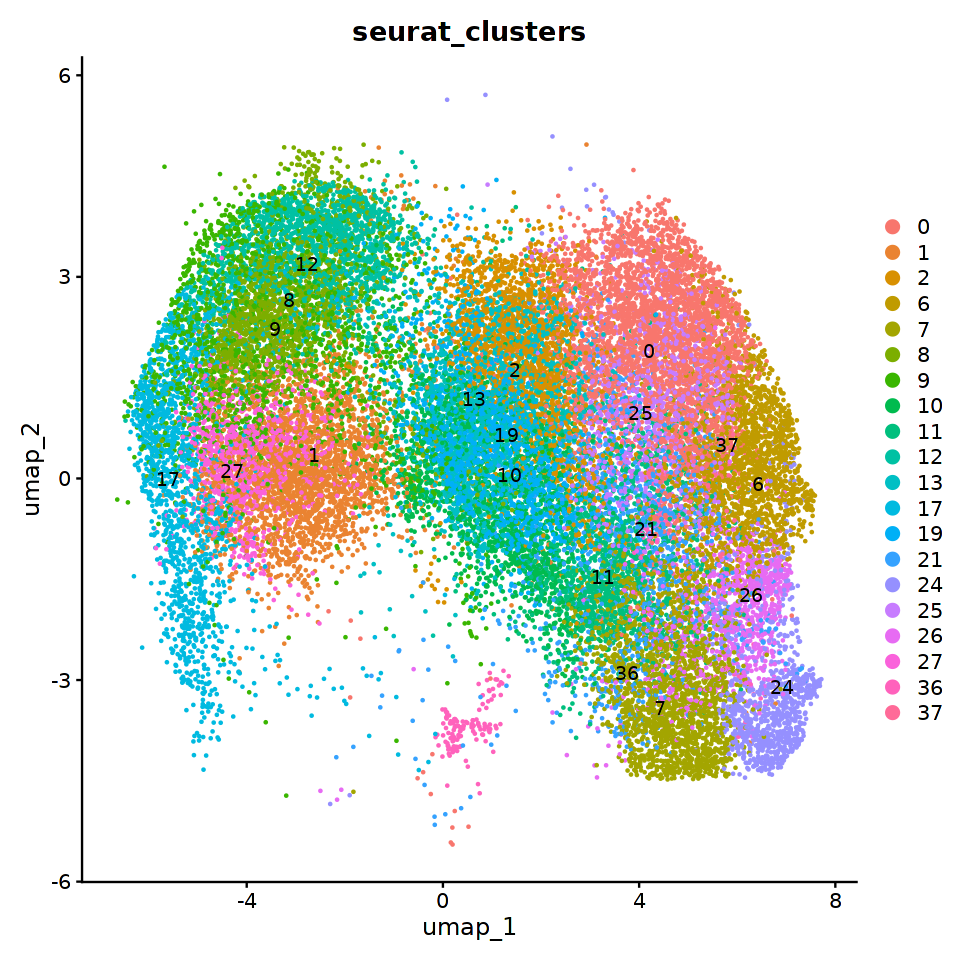

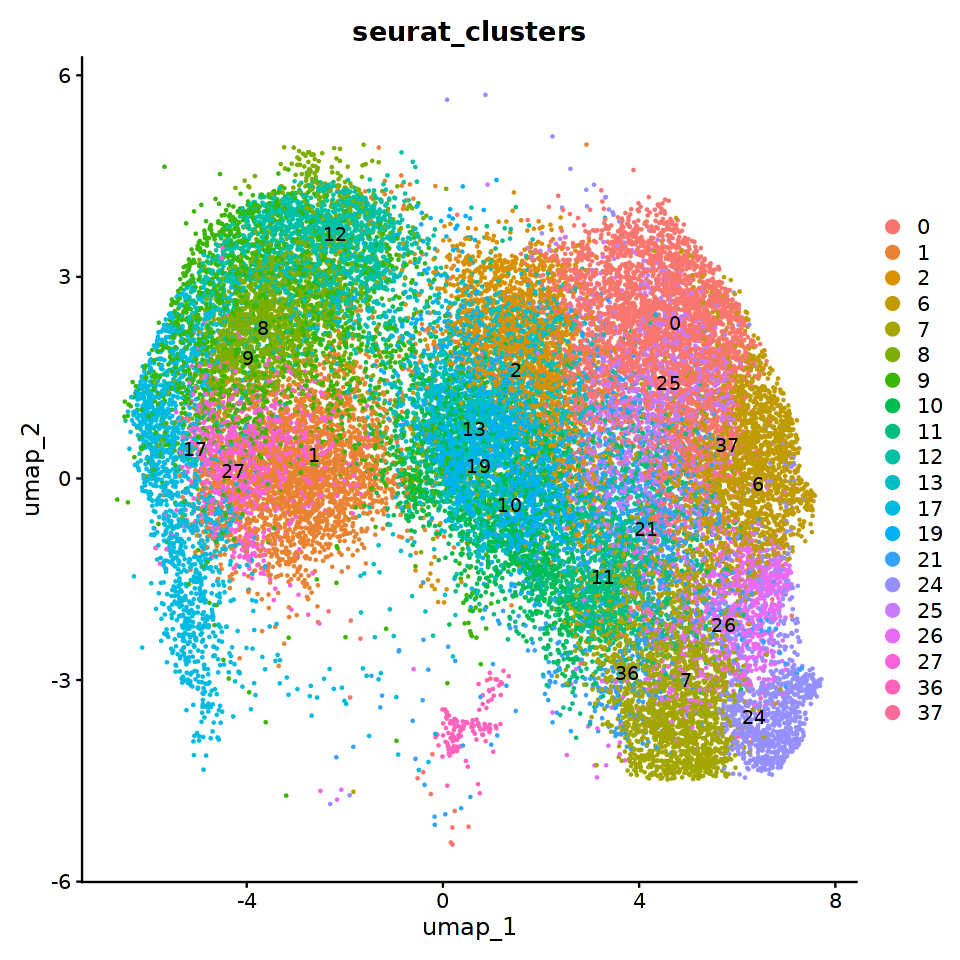

In [21]:
PP_Exo_EP_Subset_3 <- subset(PP_Exo_EP_Subset_2, subset = seurat_clusters %in%  c( 0,  1,  2,              6,  7,  8,  9,
                                                                                  10, 11, 12, 13,             17,     19,
                                                                                      21,         24, 25, 26, 27, 
                                                                                                          36, 37
                                                                               ))



DimPlot(PP_Exo_EP_Subset_3, label = TRUE, repel = TRUE, 
        reduction = "umap",group.by = 'seurat_clusters') 

In [22]:
# ---- Objects to process ----
obj_names <- c("PP_Exo_EP_Subset_3"
)

# ---- Deterministic RNG / execution ----
set.seed(777)
RNGkind("L'Ecuyer-CMRG")
plan(sequential)

process_one <- function(obj, umap_seed = 777, cluster_seed = 777, reduction_pref = "RNAMULTIVI") {
  DefaultAssay(obj) <- "RNA"

  # 1) HVGs / Scale / PCA (for robustness & fallback)
  obj <- FindVariableFeatures(obj, nfeatures = 3000)
  obj <- ScaleData(obj, features = VariableFeatures(obj))
  obj <- RunPCA(obj, features = VariableFeatures(obj))

  # 2) Choose reduction: prefer RNAMULTIVI if present, else use PCA
  red_to_use <- if (reduction_pref %in% Reductions(obj)) reduction_pref else "pca"

  # 3) Neighbors / UMAP on chosen reduction
  obj <- FindNeighbors(
    obj,
    reduction = red_to_use,
    dims      = 1:30,
    verbose   = FALSE
  )

  obj <- RunUMAP(
    obj,
    reduction   = red_to_use,
    dims        = 1:30,
    umap.method = "uwot",
    metric      = "cosine",
    seed.use    = umap_seed,
    verbose     = FALSE
  )

  # 4) Cluster on the SNN made by FindNeighbors
  # Graph name depends on DefaultAssay when using PCA or on assay name when using RNAMULTIVI.
  # Commonly it's "RNA_snn" for RNA-based neighbors, so we try that first and fall back if needed.
  graph_candidates <- c("RNA_snn", "SCT_snn", "integrated_snn", "pca_snn")
  graph_name <- graph_candidates[graph_candidates %in% names(obj@graphs)][1]
  if (is.na(graph_name)) stop("No *_snn graph found after FindNeighbors.")

  obj <- FindClusters(
    obj,
    graph.name   = graph_name,
    resolution   = 2,
    random.seed  = cluster_seed,
    verbose      = FALSE
  )

  obj
}

# ---- Run over all objects, assign back ----
for (nm in obj_names) {
  if (!exists(nm, inherits = TRUE)) {
    message(sprintf("Skipping '%s' (object not found)", nm))
    next
  }
  message(sprintf("Processing %s ...", nm))
  x <- get(nm, inherits = TRUE)
  # continue even if one fails
  x2 <- tryCatch(
    process_one(x),
    error = function(e) {
      message(sprintf("  ✗ Error in %s: %s", nm, e$message))
      return(NULL)
    }
  )
  if (!is.null(x2)) {
    assign(nm, x2, envir = .GlobalEnv)
    message(sprintf("  ✓ Done: %s", nm))
  }
}

# Quick check (optional)
# lapply(obj_names, function(nm) if (exists(nm)) { print(nm); print(c(Reductions(get(nm)), names(get(nm)@graphs))) })


Processing PP_Exo_EP_Subset_3 ...

Centering and scaling data matrix

PC_ 1 
Positive:  DPP10, RIMS2, CDKAL1, DACH1, PRICKLE2, SGCD, HECW2, KCNB2, ANKS1B, CACNA2D1 
	   CACNB2, FHIT, DCC, SDK1, TOX, NAV3, ASTN2, FRY, RGS7, NPAS3 
	   FOXP2, FAM155A, FSTL5, PDZRN3, RYR2, NEGR1, RGL1, LINC00907, PELI2, LINC02197 
Negative:  DLK1, GNB2L1, SPINK1, NGFRAP1, ANXA2, LRRC75A-AS1, FTL, SERPINA1, KRT18, ID3 
	   CCND1, ATP5G3, C11orf31, SEPW1, ATP5O, ATP5A1, WBP5, KRT8, POTEE, S100A10 
	   IGF2, SEPT7, SERPINA5, ATP5J, CALB1, ZFP36L1, ATP5L, NPC2, PTP4A1, TMSB4X 
PC_ 2 
Positive:  FRAS1, KIAA1217, LYPD6B, MECOM, TRABD2B, MAGI1, CDH6, UTRN, FN1, LAMA1 
	   MAML2, NRG3, KHDRBS2, EXT1, PDE3A, NHS, CDK14, RESF1, SLC4A4, GPC6 
	   MIR31HG, C8orf34, SPTLC3, CUX2, CARMIL1, BMPR1B, LTBP1, TTC6, LYPD6, IGFBP2 
Negative:  CHGA, CACNA1A, RYR2, RIMBP2, SCG3, C1QL1, KCNK17, NEGR1, LINC02197, HEPACAM2 
	   ASIC2, RUNX1T1, KCNJ6, LINC01811, THSD4, NEUROD1, KCNB2, RGS9, NKX2-2, CACNA1C 
	   KCNK16, AL024495.1, 

In [ ]:
options(repr.plot.width = 8, repr.plot.height = 8)

DimPlot(PP_Exo_EP_Subset_3, reduction = 'umap', group.by = 'protocol', label=T)

DimPlot(PP_Exo_EP_Subset_3, reduction = 'umap', group.by = 'day', label=T) 

DimPlot(PP_Exo_EP_Subset_3, reduction = 'umap', group.by = 'seurat_clusters', label=T)

# ---- Settings ----
genes <- c(
  #'SOX17','CER1', 'CXCR4', 'EOMES', 'GSC', 'MIXL1', 'HHEX', #DE only
  #'GATA6','FOXA2','EPCAM', #DE and GT
  #'GATA4','HNF1B','HNF4A','ONECUT1','KRT8','KRT18', #GT
  'GATA4','GATA6','FOXA2',
  'SOX9','PDX1', #PP
  'CFTR','SPINK1','KRT7','KRT19','PTF1A', #Exo
  'CPA1','CPA2','PRSS1','PRSS2', #Exo
  'PNLIP','SOX9','HNF1B','KRT8','KRT18', 'SLC4A4',
  'NEUROG3','CHGA', #Endo
  'SLC18A1','TPH1',
  'NKX6-1','ERO1B','ISL1',
  'INS','IAPP',
  'HHEX','SST',
  'ARX','GCG',
  'TOP2A','MKI67'
    )

out_dir <- "outputs/PP_Exo_EP_Subset_3_DT_Gene_marker_plots"
if (!dir.exists(out_dir)) dir.create(out_dir, recursive = TRUE)

# ---- Check genes present ----
present <- genes[genes %in% rownames(PP_Exo_EP_Subset_3)]
missing <- setdiff(genes, present)
if (length(missing)) {
  message("Missing from object (skipped): ", paste(missing, collapse = ", "))
}

# ---- Plot & save ----
for (g in present) {
  # build a safe filename
  fname <- file.path(out_dir, paste0("FeaturePlot_", g, ".png"))

  # make the plot
  p <- tryCatch({
    FeaturePlot(
      PP_Exo_EP_Subset_3, features = g,
      reduction = "umap",
      order = TRUE,       # draws higher-expressing cells on top
      raster = TRUE,      # faster/lighter for big objs
      pt.size = 2.5
    ) +
      ggtitle(g) +
      theme(
        plot.title = element_text(hjust = 0.5, face = "bold"),
        legend.title = element_blank()
      )
  }, error = function(e) {
    warning(sprintf("Failed to plot %s: %s", g, e$message))
    NULL
  })

  # save
  if (!is.null(p)) {
    ggsave(
      filename = fname, plot = p,
      dpi = 600, width = 4, height = 4, units = "in",
      device = "png"
    )
  }
}


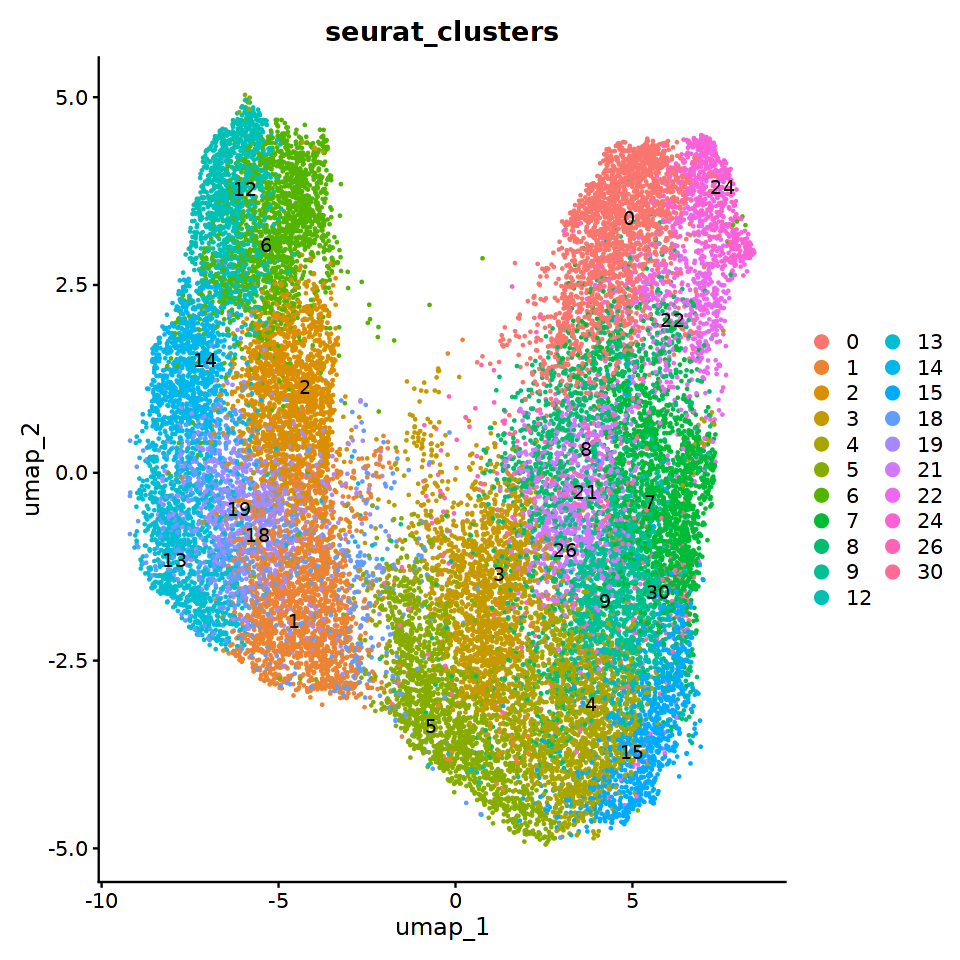

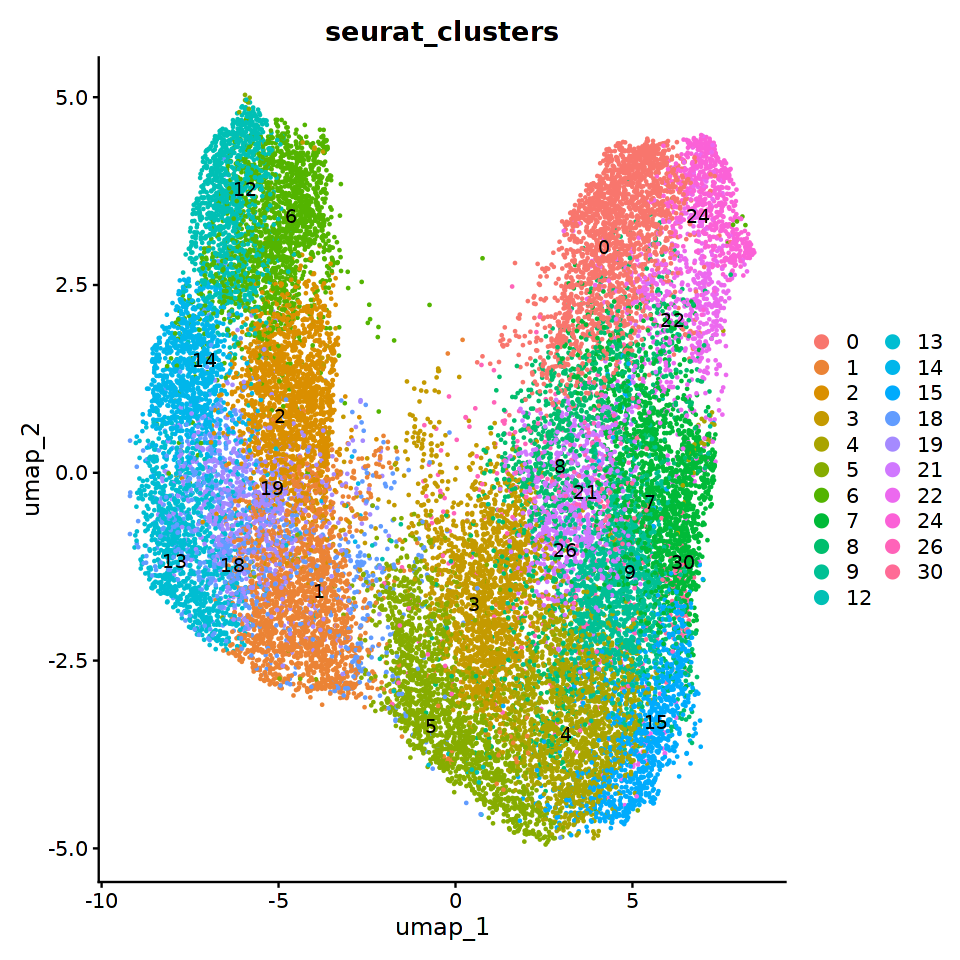

In [25]:
PP_Exo_EP_Subset_4<- subset(PP_Exo_EP_Subset_3, subset = seurat_clusters %in%  c(  0,  1,  2,  3,  4,  5,  6,  7,  8,  9,
                                                                                          12, 13, 14, 15,         18, 19,
                                                                                      21, 22,     24,     26, 
                                                                                  30, 31, 32, 33, 34, 35, 36, 37, 38, 39,
                                                                                  40, 41, 42
                                                                               ))



DimPlot(PP_Exo_EP_Subset_4, label = TRUE, repel = TRUE, 
        reduction = "umap",group.by = 'seurat_clusters') 
DimPlot(PP_Exo_EP_Subset_4, label = TRUE, repel = TRUE, 
        reduction = "umap",group.by = 'seurat_clusters') 

In [26]:
# ---- Objects to process ----
obj_names <- c("PP_Exo_EP_Subset_4"
)

# ---- Deterministic RNG / execution ----
set.seed(777)
RNGkind("L'Ecuyer-CMRG")
plan(sequential)

process_one <- function(obj, umap_seed = 777, cluster_seed = 777, reduction_pref = "RNAMULTIVI") {
  DefaultAssay(obj) <- "RNA"

  # 1) HVGs / Scale / PCA (for robustness & fallback)
  obj <- FindVariableFeatures(obj, nfeatures = 3000)
  obj <- ScaleData(obj, features = VariableFeatures(obj))
  obj <- RunPCA(obj, features = VariableFeatures(obj))

  # 2) Choose reduction: prefer RNAMULTIVI if present, else use PCA
  red_to_use <- if (reduction_pref %in% Reductions(obj)) reduction_pref else "pca"

  # 3) Neighbors / UMAP on chosen reduction
  obj <- FindNeighbors(
    obj,
    reduction = red_to_use,
    dims      = 1:30,
    verbose   = FALSE
  )

  obj <- RunUMAP(
    obj,
    reduction   = red_to_use,
    dims        = 1:30,
    umap.method = "uwot",
    metric      = "cosine",
    seed.use    = umap_seed,
    verbose     = FALSE
  )

  # 4) Cluster on the SNN made by FindNeighbors
  # Graph name depends on DefaultAssay when using PCA or on assay name when using RNAMULTIVI.
  # Commonly it's "RNA_snn" for RNA-based neighbors, so we try that first and fall back if needed.
  graph_candidates <- c("RNA_snn", "SCT_snn", "integrated_snn", "pca_snn")
  graph_name <- graph_candidates[graph_candidates %in% names(obj@graphs)][1]
  if (is.na(graph_name)) stop("No *_snn graph found after FindNeighbors.")

  obj <- FindClusters(
    obj,
    graph.name   = graph_name,
    resolution   = 2,
    random.seed  = cluster_seed,
    verbose      = FALSE
  )

  obj
}

# ---- Run over all objects, assign back ----
for (nm in obj_names) {
  if (!exists(nm, inherits = TRUE)) {
    message(sprintf("Skipping '%s' (object not found)", nm))
    next
  }
  message(sprintf("Processing %s ...", nm))
  x <- get(nm, inherits = TRUE)
  # continue even if one fails
  x2 <- tryCatch(
    process_one(x),
    error = function(e) {
      message(sprintf("  ✗ Error in %s: %s", nm, e$message))
      return(NULL)
    }
  )
  if (!is.null(x2)) {
    assign(nm, x2, envir = .GlobalEnv)
    message(sprintf("  ✓ Done: %s", nm))
  }
}

# Quick check (optional)
# lapply(obj_names, function(nm) if (exists(nm)) { print(nm); print(c(Reductions(get(nm)), names(get(nm)@graphs))) })


Processing PP_Exo_EP_Subset_4 ...

Centering and scaling data matrix

PC_ 1 
Positive:  DLK1, GNB2L1, NGFRAP1, SPINK1, ANXA2, LRRC75A-AS1, SERPINA1, ATP5G3, KRT18, FTL 
	   CCND1, C11orf31, SEPW1, ATP5O, ATP5A1, WBP5, ID3, KRT8, SERPINA5, SEPT7 
	   ATP5J, IGF2, POTEE, S100A10, ATP5L, CALB1, PTP4A1, GFRA3, TMSB4X, TCEB2 
Negative:  DPP10, RIMS2, DACH1, CDKAL1, PRICKLE2, HECW2, SGCD, FHIT, SDK1, CACNA2D1 
	   KCNB2, ANKS1B, CACNB2, FRY, TOX, DCC, NAV3, NPAS3, ASTN2, RGS7 
	   PDZRN3, FOXP2, FSTL5, FAM155A, RGL1, MAPK10, LINC00907, RORA, PELI2, DSCAM 
PC_ 2 
Positive:  CHGA, CACNA1A, RYR2, RIMBP2, SCG3, RUNX1T1, NEGR1, LINC02197, KCNK17, C1QL1 
	   HEPACAM2, ASIC2, KCNB2, THSD4, LINC01811, KCNJ6, RGS9, ST6GALNAC5, PTPRN2, ATP8A1 
	   TSPAN5, ST18, AL024495.1, KCNK16, CACNA1C, PLCXD3, CADM2, SCG2, PPP1R14C, NEUROD1 
Negative:  FRAS1, LYPD6B, KIAA1217, MECOM, CDH6, LAMA1, FN1, TRABD2B, UTRN, MAGI1 
	   PDE3A, MAML2, NRG3, SPTLC3, RESF1, KHDRBS2, C8orf34, CDK14, EXT1, SLC4A4 
	   LTBP1, CUX

In [ ]:
options(repr.plot.width = 8, repr.plot.height = 8)

DimPlot(PP_Exo_EP_Subset_4, reduction = 'umap', group.by = 'protocol', label=T)

DimPlot(PP_Exo_EP_Subset_4, reduction = 'umap', group.by = 'day', label=T) 

DimPlot(PP_Exo_EP_Subset_4, reduction = 'umap', group.by = 'seurat_clusters', label=T)

# ---- Settings ----
genes <- c(
  #'SOX17','CER1', 'CXCR4', 'EOMES', 'GSC', 'MIXL1', 'HHEX', #DE only
  #'GATA6','FOXA2','EPCAM', #DE and GT
  #'GATA4','HNF1B','HNF4A','ONECUT1','KRT8','KRT18', #GT
  'GATA4','GATA6','FOXA2',
  'SOX9','PDX1', #PP
  'CFTR','SPINK1','KRT7','KRT19','PTF1A', #Exo
  'CPA1','CPA2','PRSS1','PRSS2', #Exo
  'PNLIP','SOX9','HNF1B','KRT8','KRT18', 'SLC4A4',
  'NEUROG3','CHGA', #Endo
  'SLC18A1','TPH1',
  'NKX6-1','ERO1B','ISL1',
  'INS','IAPP',
  'HHEX','SST',
  'ARX','GCG',
  'TOP2A','MKI67'
    )

out_dir <- "outputs/PP_Exo_EP_Subset_4_DT_Gene_marker_plots"
if (!dir.exists(out_dir)) dir.create(out_dir, recursive = TRUE)

# ---- Check genes present ----
present <- genes[genes %in% rownames(PP_Exo_EP_Subset_4)]
missing <- setdiff(genes, present)
if (length(missing)) {
  message("Missing from object (skipped): ", paste(missing, collapse = ", "))
}

# ---- Plot & save ----
for (g in present) {
  # build a safe filename
  fname <- file.path(out_dir, paste0("FeaturePlot_", g, ".png"))

  # make the plot
  p <- tryCatch({
    FeaturePlot(
      PP_Exo_EP_Subset_4, features = g,
      reduction = "umap",
      order = TRUE,       # draws higher-expressing cells on top
      raster = TRUE,      # faster/lighter for big objs
      pt.size = 2.5
    ) +
      ggtitle(g) +
      theme(
        plot.title = element_text(hjust = 0.5, face = "bold"),
        legend.title = element_blank()
      )
  }, error = function(e) {
    warning(sprintf("Failed to plot %s: %s", g, e$message))
    NULL
  })

  # save
  if (!is.null(p)) {
    ggsave(
      filename = fname, plot = p,
      dpi = 600, width = 4, height = 4, units = "in",
      device = "png"
    )
  }
}


In [28]:
PP_Exo_EP_Subset_4

An object of class Seurat 
95325 features across 25753 samples within 2 assays 
Active assay: RNA (17015 features, 3000 variable features)
 3 layers present: counts, data, scale.data
 1 other assay present: ATAC
 19 dimensional reductions calculated: RNAHARMONY, RNAINTEGRATED_LSI, RNAMULTIVI, RNAPCA, RNAUMAP, RNAUMAP.HARMONY, RNAUMAP.INTEGRATED.ATAC, RNAUMAP.MERGED.RNA, ATACHARMONY, ATACINTEGRATED_LSI, ATACMULTIVI, ATACPCA, ATACUMAP, ATACUMAP.HARMONY, ATACUMAP.INTEGRATED.ATAC, ATACUMAP.MERGED.RNA, umap.multivi, pca, umap

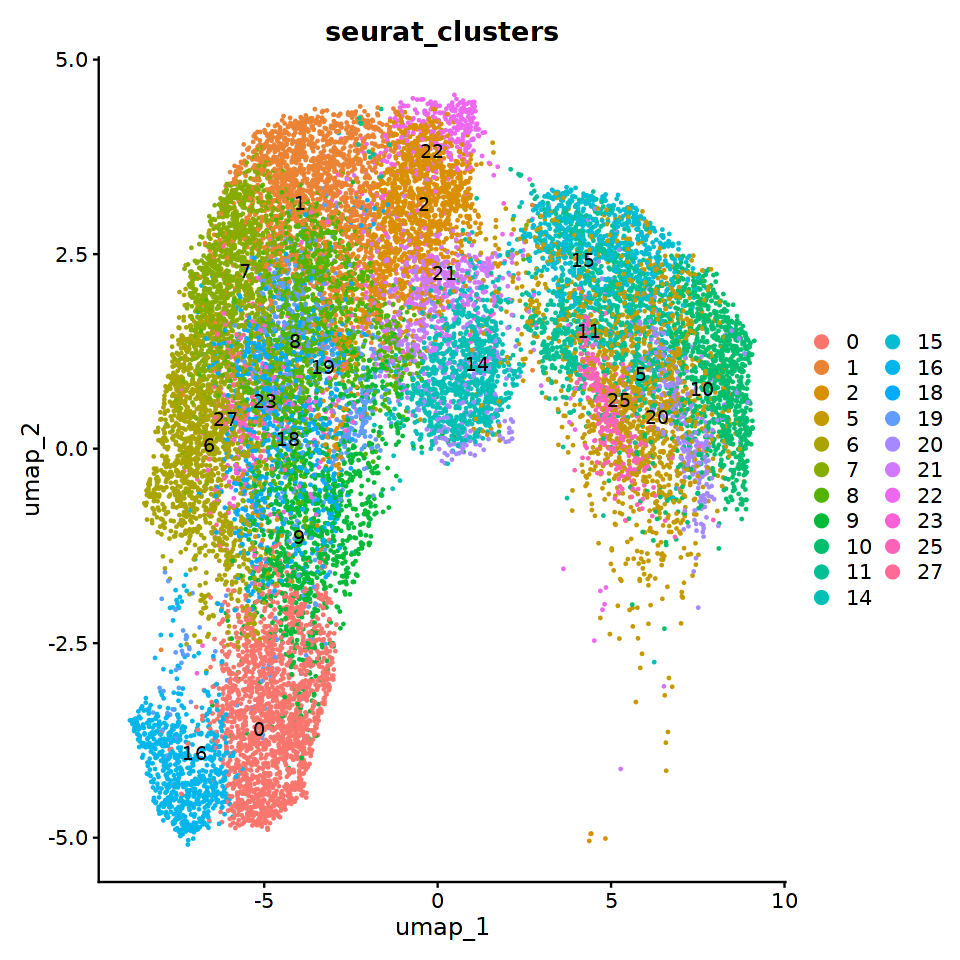

In [29]:
PP_Exo_EP_Subset_5<- subset(PP_Exo_EP_Subset_4, subset = seurat_clusters %in%  c(  0,  1,  2,          5,  6,  7,  8,  9,
                                                                                  10, 11,         14, 15, 16,     18, 19,
                                                                                  20, 21, 22, 23,     25,     27
                                                                               ))


DimPlot(PP_Exo_EP_Subset_5, label = TRUE, repel = TRUE, 
        reduction = "umap",group.by = 'seurat_clusters') 

In [30]:
# ---- Objects to process ----
obj_names <- c("PP_Exo_EP_Subset_5"
)

# ---- Deterministic RNG / execution ----
set.seed(777)
RNGkind("L'Ecuyer-CMRG")
plan(sequential)

process_one <- function(obj, umap_seed = 777, cluster_seed = 777, reduction_pref = "RNAMULTIVI") {
  DefaultAssay(obj) <- "RNA"

  # 1) HVGs / Scale / PCA (for robustness & fallback)
  obj <- FindVariableFeatures(obj, nfeatures = 3000)
  obj <- ScaleData(obj, features = VariableFeatures(obj))
  obj <- RunPCA(obj, features = VariableFeatures(obj))

  # 2) Choose reduction: prefer RNAMULTIVI if present, else use PCA
  red_to_use <- if (reduction_pref %in% Reductions(obj)) reduction_pref else "pca"

  # 3) Neighbors / UMAP on chosen reduction
  obj <- FindNeighbors(
    obj,
    reduction = red_to_use,
    dims      = 1:30,
    verbose   = FALSE
  )

  obj <- RunUMAP(
    obj,
    reduction   = red_to_use,
    dims        = 1:30,
    umap.method = "uwot",
    metric      = "cosine",
    seed.use    = umap_seed,
    verbose     = FALSE
  )

  # 4) Cluster on the SNN made by FindNeighbors
  # Graph name depends on DefaultAssay when using PCA or on assay name when using RNAMULTIVI.
  # Commonly it's "RNA_snn" for RNA-based neighbors, so we try that first and fall back if needed.
  graph_candidates <- c("RNA_snn", "SCT_snn", "integrated_snn", "pca_snn")
  graph_name <- graph_candidates[graph_candidates %in% names(obj@graphs)][1]
  if (is.na(graph_name)) stop("No *_snn graph found after FindNeighbors.")

  obj <- FindClusters(
    obj,
    graph.name   = graph_name,
    resolution   = 2,
    random.seed  = cluster_seed,
    verbose      = FALSE
  )

  obj
}

# ---- Run over all objects, assign back ----
for (nm in obj_names) {
  if (!exists(nm, inherits = TRUE)) {
    message(sprintf("Skipping '%s' (object not found)", nm))
    next
  }
  message(sprintf("Processing %s ...", nm))
  x <- get(nm, inherits = TRUE)
  # continue even if one fails
  x2 <- tryCatch(
    process_one(x),
    error = function(e) {
      message(sprintf("  ✗ Error in %s: %s", nm, e$message))
      return(NULL)
    }
  )
  if (!is.null(x2)) {
    assign(nm, x2, envir = .GlobalEnv)
    message(sprintf("  ✓ Done: %s", nm))
  }
}

# Quick check (optional)
# lapply(obj_names, function(nm) if (exists(nm)) { print(nm); print(c(Reductions(get(nm)), names(get(nm)@graphs))) })


Processing PP_Exo_EP_Subset_5 ...

Centering and scaling data matrix

PC_ 1 
Positive:  AUTS2, DPP10, SOX5, RIMS2, KCNH7, CDKAL1, RFX3, LINC02315, DACH1, SDK1 
	   PRICKLE2, NBEA, FHIT, RORA, PTPRG, ZFPM2, ANKS1B, CACNB2, FAT3, NPAS3 
	   PARD3B, LARGE, SGCD, TOX, PDZRN3, HECW2, FMNL2, DCC, MAPK10, DPP6 
Negative:  DLK1, GNB2L1, NGFRAP1, SPINK1, LRRC75A-AS1, ATP5G3, CCND1, C11orf31, SEPW1, WBP5 
	   SERPINA1, ID3, FTL, KRT18, SERPINA5, ATP5J, ATP5L, POTEE, IGF2, CALB1 
	   TM4SF1, GFRA3, KRT8, TCEB2, GMNN, PTP4A1, B2M, CA4, SPP1, MTRNR2L1 
PC_ 2 
Positive:  CACNA1A, RYR2, RIMBP2, LINC02197, NEGR1, ST6GALNAC5, KCNB2, KCNK17, HEPACAM2, CHGA 
	   AL024495.1, RUNX1T1, ST18, CACNA1C, C1QL1, KCNJ6, SCG3, PTPRN2, TMEM196, TRPM3 
	   TSPAN5, ASIC2, GABBR2, LDB2, LINC01811, RGS9, CADM2, ATP8A1, GNAO1, NKX2-2 
Negative:  FRAS1, LYPD6B, KIAA1217, CDH6, TRABD2B, MECOM, LAMA1, PDE3A, MAML2, MAGI1 
	   SLC4A4, RESF1, SPTLC3, NRG3, C8orf34, KHDRBS2, LTBP1, GPC3, C5, EXT1 
	   RARB, ATXN1, CARMIL1, YA

In [ ]:
options(repr.plot.width = 8, repr.plot.height = 8)

DimPlot(PP_Exo_EP_Subset_5, reduction = 'umap', group.by = 'protocol', label=T)

DimPlot(PP_Exo_EP_Subset_5, reduction = 'umap', group.by = 'day', label=T) 

DimPlot(PP_Exo_EP_Subset_5, reduction = 'umap', group.by = 'seurat_clusters', label=T)

# ---- Settings ----
genes <- c(
  #'SOX17','CER1', 'CXCR4', 'EOMES', 'GSC', 'MIXL1', 'HHEX', #DE only
  #'GATA6','FOXA2','EPCAM', #DE and GT
  #'GATA4','HNF1B','HNF4A','ONECUT1','KRT8','KRT18', #GT
  'GATA4','GATA6','FOXA2',
  'SOX9','PDX1', #PP
  'CFTR','SPINK1','KRT7','KRT19','PTF1A', #Exo
  'CPA1','CPA2','PRSS1','PRSS2', #Exo
  'PNLIP','SOX9','HNF1B','KRT8','KRT18', 'SLC4A4',
  'NEUROG3','CHGA', #Endo
  'SLC18A1','TPH1',
  'NKX6-1','ERO1B','ISL1',
  'INS','IAPP',
  'HHEX','SST',
  'ARX','GCG',
  'TOP2A','MKI67'
    )

out_dir <- "outputs/PP_Exo_EP_Subset_5_DT_Gene_marker_plots"
if (!dir.exists(out_dir)) dir.create(out_dir, recursive = TRUE)

# ---- Check genes present ----
present <- genes[genes %in% rownames(PP_Exo_EP_Subset_5)]
missing <- setdiff(genes, present)
if (length(missing)) {
  message("Missing from object (skipped): ", paste(missing, collapse = ", "))
}

# ---- Plot & save ----
for (g in present) {
  # build a safe filename
  fname <- file.path(out_dir, paste0("FeaturePlot_", g, ".png"))

  # make the plot
  p <- tryCatch({
    FeaturePlot(
      PP_Exo_EP_Subset_5, features = g,
      reduction = "umap",
      order = TRUE,       # draws higher-expressing cells on top
      raster = TRUE,      # faster/lighter for big objs
      pt.size = 2.5
    ) +
      ggtitle(g) +
      theme(
        plot.title = element_text(hjust = 0.5, face = "bold"),
        legend.title = element_blank()
      )
  }, error = function(e) {
    warning(sprintf("Failed to plot %s: %s", g, e$message))
    NULL
  })

  # save
  if (!is.null(p)) {
    ggsave(
      filename = fname, plot = p,
      dpi = 600, width = 4, height = 4, units = "in",
      device = "png"
    )
  }
}


An object of class Seurat 
95325 features across 15897 samples within 2 assays 
Active assay: RNA (17015 features, 3000 variable features)
 3 layers present: counts, data, scale.data
 1 other assay present: ATAC
 19 dimensional reductions calculated: RNAHARMONY, RNAINTEGRATED_LSI, RNAMULTIVI, RNAPCA, RNAUMAP, RNAUMAP.HARMONY, RNAUMAP.INTEGRATED.ATAC, RNAUMAP.MERGED.RNA, ATACHARMONY, ATACINTEGRATED_LSI, ATACMULTIVI, ATACPCA, ATACUMAP, ATACUMAP.HARMONY, ATACUMAP.INTEGRATED.ATAC, ATACUMAP.MERGED.RNA, umap.multivi, pca, umap

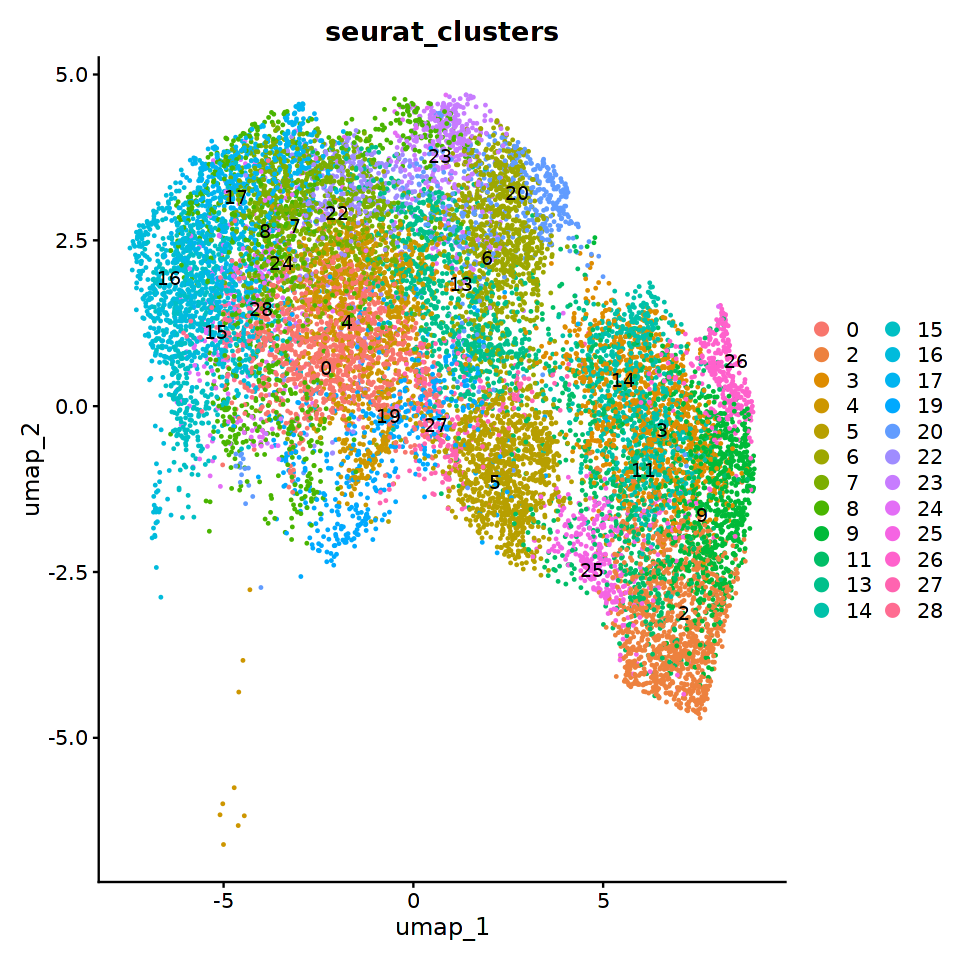

In [32]:
PP_Exo_EP_Subset_6<- subset(PP_Exo_EP_Subset_5, subset = seurat_clusters %in%  c( 0,    2,  3,  4,  5,  6,  7,  8,  9,
                                                                                  11, 13, 14, 15, 16, 17,  19,
                                                                                  20, 22, 23, 24, 25, 26, 27, 28, 29,
                                                                                  30, 31, 32, 33, 34, 35, 36, 37, 38, 39,
                                                                                  40, 41, 42
                                                                               ))

PP_Exo_EP_Subset_6
DimPlot(PP_Exo_EP_Subset_6, label = TRUE, repel = TRUE, 
        reduction = "umap",group.by = 'seurat_clusters') 

In [33]:
# ---- Objects to process ----
obj_names <- c("PP_Exo_EP_Subset_6"
)

# ---- Deterministic RNG / execution ----
set.seed(777)
RNGkind("L'Ecuyer-CMRG")
plan(sequential)

process_one <- function(obj, umap_seed = 777, cluster_seed = 777, reduction_pref = "RNAMULTIVI") {
  DefaultAssay(obj) <- "RNA"

  # 1) HVGs / Scale / PCA (for robustness & fallback)
  obj <- FindVariableFeatures(obj, nfeatures = 3000)
  obj <- ScaleData(obj, features = VariableFeatures(obj))
  obj <- RunPCA(obj, features = VariableFeatures(obj))

  # 2) Choose reduction: prefer RNAMULTIVI if present, else use PCA
  red_to_use <- if (reduction_pref %in% Reductions(obj)) reduction_pref else "pca"

  # 3) Neighbors / UMAP on chosen reduction
  obj <- FindNeighbors(
    obj,
    reduction = red_to_use,
    dims      = 1:30,
    verbose   = FALSE
  )

  obj <- RunUMAP(
    obj,
    reduction   = red_to_use,
    dims        = 1:30,
    umap.method = "uwot",
    metric      = "cosine",
    seed.use    = umap_seed,
    verbose     = FALSE
  )

  # 4) Cluster on the SNN made by FindNeighbors
  # Graph name depends on DefaultAssay when using PCA or on assay name when using RNAMULTIVI.
  # Commonly it's "RNA_snn" for RNA-based neighbors, so we try that first and fall back if needed.
  graph_candidates <- c("RNA_snn", "SCT_snn", "integrated_snn", "pca_snn")
  graph_name <- graph_candidates[graph_candidates %in% names(obj@graphs)][1]
  if (is.na(graph_name)) stop("No *_snn graph found after FindNeighbors.")

  obj <- FindClusters(
    obj,
    graph.name   = graph_name,
    resolution   = 2,
    random.seed  = cluster_seed,
    verbose      = FALSE
  )

  obj
}

# ---- Run over all objects, assign back ----
for (nm in obj_names) {
  if (!exists(nm, inherits = TRUE)) {
    message(sprintf("Skipping '%s' (object not found)", nm))
    next
  }
  message(sprintf("Processing %s ...", nm))
  x <- get(nm, inherits = TRUE)
  # continue even if one fails
  x2 <- tryCatch(
    process_one(x),
    error = function(e) {
      message(sprintf("  ✗ Error in %s: %s", nm, e$message))
      return(NULL)
    }
  )
  if (!is.null(x2)) {
    assign(nm, x2, envir = .GlobalEnv)
    message(sprintf("  ✓ Done: %s", nm))
  }
}

# Quick check (optional)
# lapply(obj_names, function(nm) if (exists(nm)) { print(nm); print(c(Reductions(get(nm)), names(get(nm)@graphs))) })


Processing PP_Exo_EP_Subset_6 ...

Centering and scaling data matrix

PC_ 1 
Positive:  GNB2L1, SPINK1, NGFRAP1, ANXA2, LRRC75A-AS1, SERPINA1, CCND1, ATP5G3, C11orf31, SEPW1 
	   WBP5, SERPINA5, KRT18, FTL, ID3, ATP5J, ATP5L, IGF2, TM4SF1, POTEE 
	   GFRA3, KRT8, CALB1, S100A10, GMNN, B2M, CA4, MTRNR2L1, SPP1, SAT1 
Negative:  DPP10, AUTS2, RIMS2, KALRN, DACH1, SOX5, RFX3, CDKAL1, KCNH7, PRICKLE2 
	   KIAA1211, SGCD, NBEA, SDK1, LINC02315, CACNB2, HECW2, TOX, NPAS3, DCC 
	   FHIT, ANKS1B, RAP1GAP2, RABGAP1L, RORA, ZFPM2, NAV3, PDZRN3, SIPA1L3, PTPRG 
PC_ 2 
Positive:  FRAS1, TRABD2B, LYPD6B, KIAA1217, SLC4A4, CDH6, PDE3A, FN1, UTRN, MECOM 
	   NRG3, LAMA1, C5, MAML2, MAGI1, MIR31HG, RESF1, LINC01208, FNDC3B, NHS 
	   CARMIL1, RARB, LRRC7, IGFBP2, LTBP1, CUX2, LYPD6, ATXN1, ANK3, AC113386.1 
Negative:  CACNA1A, CHGA, KCNB2, RIMBP2, RYR2, KCNK17, HEPACAM2, ST6GALNAC5, NEGR1, LINC02197 
	   KCNJ6, CACNA2D1, SCG3, AL024495.1, C1QL1, CACNA1C, ST18, RUNX1T1, TSPAN5, TMEM196 
	   NKX2-2, INSM

In [ ]:
options(repr.plot.width = 8, repr.plot.height = 8)

DimPlot(PP_Exo_EP_Subset_6, reduction = 'umap', group.by = 'protocol', label=T)

DimPlot(PP_Exo_EP_Subset_6, reduction = 'umap', group.by = 'day', label=T) 

DimPlot(PP_Exo_EP_Subset_6, reduction = 'umap', group.by = 'seurat_clusters', label=T)

# ---- Settings ----
genes <- c(
  #'SOX17','CER1', 'CXCR4', 'EOMES', 'GSC', 'MIXL1', 'HHEX', #DE only
  #'GATA6','FOXA2','EPCAM', #DE and GT
  #'GATA4','HNF1B','HNF4A','ONECUT1','KRT8','KRT18', #GT
  'GATA4','GATA6','FOXA2',
  'SOX9','PDX1', #PP
  'CFTR','SPINK1','KRT7','KRT19','PTF1A', #Exo
  'CPA1','CPA2','PRSS1','PRSS2', #Exo
  'PNLIP','SOX9','HNF1B','KRT8','KRT18', 'SLC4A4',
  'NEUROG3','CHGA', #Endo
  'SLC18A1','TPH1',
  'NKX6-1','ERO1B','ISL1',
  'INS','IAPP',
  'HHEX','SST',
  'ARX','GCG',
  'TOP2A','MKI67'
    )

out_dir <- "outputs/PP_Exo_EP_Subset_6_DT_Gene_marker_plots"
if (!dir.exists(out_dir)) dir.create(out_dir, recursive = TRUE)

# ---- Check genes present ----
present <- genes[genes %in% rownames(PP_Exo_EP_Subset_6)]
missing <- setdiff(genes, present)
if (length(missing)) {
  message("Missing from object (skipped): ", paste(missing, collapse = ", "))
}

# ---- Plot & save ----
for (g in present) {
  # build a safe filename
  fname <- file.path(out_dir, paste0("FeaturePlot_", g, ".png"))

  # make the plot
  p <- tryCatch({
    FeaturePlot(
      PP_Exo_EP_Subset_6, features = g,
      reduction = "umap",
      order = TRUE,       # draws higher-expressing cells on top
      raster = TRUE,      # faster/lighter for big objs
      pt.size = 2.5
    ) +
      ggtitle(g) +
      theme(
        plot.title = element_text(hjust = 0.5, face = "bold"),
        legend.title = element_blank()
      )
  }, error = function(e) {
    warning(sprintf("Failed to plot %s: %s", g, e$message))
    NULL
  })

  # save
  if (!is.null(p)) {
    ggsave(
      filename = fname, plot = p,
      dpi = 600, width = 4, height = 4, units = "in",
      device = "png"
    )
  }
}


An object of class Seurat 
95325 features across 10157 samples within 2 assays 
Active assay: RNA (17015 features, 3000 variable features)
 3 layers present: counts, data, scale.data
 1 other assay present: ATAC
 19 dimensional reductions calculated: RNAHARMONY, RNAINTEGRATED_LSI, RNAMULTIVI, RNAPCA, RNAUMAP, RNAUMAP.HARMONY, RNAUMAP.INTEGRATED.ATAC, RNAUMAP.MERGED.RNA, ATACHARMONY, ATACINTEGRATED_LSI, ATACMULTIVI, ATACPCA, ATACUMAP, ATACUMAP.HARMONY, ATACUMAP.INTEGRATED.ATAC, ATACUMAP.MERGED.RNA, umap.multivi, pca, umap

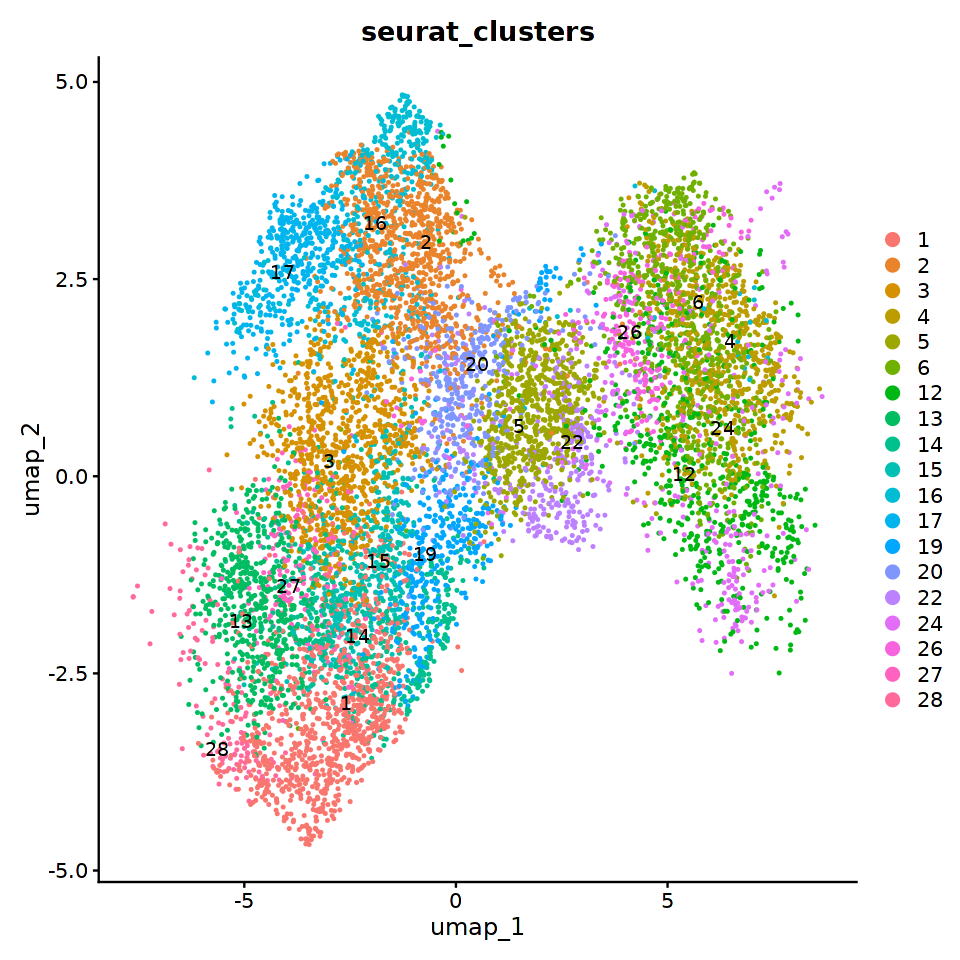

In [37]:
PP_Exo_EP_Subset_7<- subset(PP_Exo_EP_Subset_6, subset = seurat_clusters %in%  c( 1,  2,  3,  4,  5,  6,  
                                                                                  12, 13, 14, 15, 16, 17,    19,
                                                                                  20, 22, 24, 26, 27, 28
                                                                               ))

PP_Exo_EP_Subset_7
DimPlot(PP_Exo_EP_Subset_7, label = TRUE, repel = TRUE, 
        reduction = "umap",group.by = 'seurat_clusters') 

In [38]:
# ---- Objects to process ----
obj_names <- c("PP_Exo_EP_Subset_7"
)

# ---- Deterministic RNG / execution ----
set.seed(777)
RNGkind("L'Ecuyer-CMRG")
plan(sequential)

process_one <- function(obj, umap_seed = 777, cluster_seed = 777, reduction_pref = "RNAMULTIVI") {
  DefaultAssay(obj) <- "RNA"

  # 1) HVGs / Scale / PCA (for robustness & fallback)
  obj <- FindVariableFeatures(obj, nfeatures = 3000)
  obj <- ScaleData(obj, features = VariableFeatures(obj))
  obj <- RunPCA(obj, features = VariableFeatures(obj))

  # 2) Choose reduction: prefer RNAMULTIVI if present, else use PCA
  red_to_use <- if (reduction_pref %in% Reductions(obj)) reduction_pref else "pca"

  # 3) Neighbors / UMAP on chosen reduction
  obj <- FindNeighbors(
    obj,
    reduction = red_to_use,
    dims      = 1:30,
    verbose   = FALSE
  )

  obj <- RunUMAP(
    obj,
    reduction   = red_to_use,
    dims        = 1:30,
    umap.method = "uwot",
    metric      = "cosine",
    seed.use    = umap_seed,
    verbose     = FALSE
  )

  # 4) Cluster on the SNN made by FindNeighbors
  # Graph name depends on DefaultAssay when using PCA or on assay name when using RNAMULTIVI.
  # Commonly it's "RNA_snn" for RNA-based neighbors, so we try that first and fall back if needed.
  graph_candidates <- c("RNA_snn", "SCT_snn", "integrated_snn", "pca_snn")
  graph_name <- graph_candidates[graph_candidates %in% names(obj@graphs)][1]
  if (is.na(graph_name)) stop("No *_snn graph found after FindNeighbors.")

  obj <- FindClusters(
    obj,
    graph.name   = graph_name,
    resolution   = 2,
    random.seed  = cluster_seed,
    verbose      = FALSE
  )

  obj
}

# ---- Run over all objects, assign back ----
for (nm in obj_names) {
  if (!exists(nm, inherits = TRUE)) {
    message(sprintf("Skipping '%s' (object not found)", nm))
    next
  }
  message(sprintf("Processing %s ...", nm))
  x <- get(nm, inherits = TRUE)
  # continue even if one fails
  x2 <- tryCatch(
    process_one(x),
    error = function(e) {
      message(sprintf("  ✗ Error in %s: %s", nm, e$message))
      return(NULL)
    }
  )
  if (!is.null(x2)) {
    assign(nm, x2, envir = .GlobalEnv)
    message(sprintf("  ✓ Done: %s", nm))
  }
}

# Quick check (optional)
# lapply(obj_names, function(nm) if (exists(nm)) { print(nm); print(c(Reductions(get(nm)), names(get(nm)@graphs))) })


Processing PP_Exo_EP_Subset_7 ...

Centering and scaling data matrix

PC_ 1 
Positive:  DPP10, RIMS2, MAML3, AUTS2, DACH1, CDKAL1, KALRN, SOX5, RFX3, KCNH7 
	   PRICKLE2, DCC, HECW2, SGCD, KIAA1211, NBEA, TOX, LINC02315, NPAS3, CACNB2 
	   PDZRN3, RAP1GAP2, FHIT, SIK3, SDK1, FOXP2, NAV3, LINC00907, KCNB2, SETBP1 
Negative:  SPINK1, NGFRAP1, SERPINA1, LRRC75A-AS1, CCND1, FTL, KRT18, SERPINA5, WBP5, TMSB10 
	   ID3, KRT8, IGF2, TM4SF1, CALB1, POTEE, B2M, GMNN, CA4, SAT1 
	   SPP1, FAM84A, CTGF, MTRNR2L1, USMG5, CPA2, ID1, ATP5I, TMSB4X, C6orf48 
PC_ 2 
Positive:  RYR2, CACNA1A, LINC02197, NEGR1, KCNK17, HEPACAM2, KCNB2, ST6GALNAC5, AL024495.1, CHGA 
	   RIMBP2, SSTR2, CACNA2D1, GABBR2, C1QL1, TSPAN5, PPP1R14C, RGS9, KCNJ6, SCG3 
	   KCNK16, LDB2, ASIC2, CACNA1C, NFASC, AL353576.1, RGS4, THSD4, PLCXD3, NKX2-2 
Negative:  KIAA1217, NRG3, FRAS1, LYPD6B, TRABD2B, MECOM, AC092691.1, LHFPL3-AS2, SLC4A4, LHFPL3 
	   GPC6, CARMIL1, LINC01208, UTRN, C5, MAML2, NIBAN1, UNC5C, FN1, NHS 
	   LAMA1, 

In [ ]:
options(repr.plot.width = 8, repr.plot.height = 8)

DimPlot(PP_Exo_EP_Subset_7, reduction = 'umap', group.by = 'protocol', label=T)

DimPlot(PP_Exo_EP_Subset_7, reduction = 'umap', group.by = 'day', label=T) 

DimPlot(PP_Exo_EP_Subset_7, reduction = 'umap', group.by = 'seurat_clusters', label=T)

# ---- Settings ----
genes <- c(
  #'SOX17','CER1', 'CXCR4', 'EOMES', 'GSC', 'MIXL1', 'HHEX', #DE only
  #'GATA6','FOXA2','EPCAM', #DE and GT
  #'GATA4','HNF1B','HNF4A','ONECUT1','KRT8','KRT18', #GT
  'GATA4','GATA6','FOXA2',
  'SOX9','PDX1', #PP
  'CFTR','SPINK1','KRT7','KRT19','PTF1A', #Exo
  'CPA1','CPA2','PRSS1','PRSS2', #Exo
  'PNLIP','SOX9','HNF1B','KRT8','KRT18', 'SLC4A4',
  'NEUROG3','CHGA', #Endo
  'SLC18A1','TPH1',
  'NKX6-1','ERO1B','ISL1',
  'INS','IAPP',
  'HHEX','SST',
  'ARX','GCG',
    'STAT1','STAT4'
    )

out_dir <- "outputs/PP_Exo_EP_Subset_7_DT_Gene_marker_plots"
if (!dir.exists(out_dir)) dir.create(out_dir, recursive = TRUE)

# ---- Check genes present ----
present <- genes[genes %in% rownames(PP_Exo_EP_Subset_7)]
missing <- setdiff(genes, present)
if (length(missing)) {
  message("Missing from object (skipped): ", paste(missing, collapse = ", "))
}

# ---- Plot & save ----
for (g in present) {
  # build a safe filename
  fname <- file.path(out_dir, paste0("FeaturePlot_", g, ".png"))

  # make the plot
  p <- tryCatch({
    FeaturePlot(
      PP_Exo_EP_Subset_7, features = g,
      reduction = "umap",
      order = TRUE,       # draws higher-expressing cells on top
      raster = TRUE,      # faster/lighter for big objs
      pt.size = 2.5
    ) +
      ggtitle(g) +
      theme(
        plot.title = element_text(hjust = 0.5, face = "bold"),
        legend.title = element_blank()
      )
  }, error = function(e) {
    warning(sprintf("Failed to plot %s: %s", g, e$message))
    NULL
  })

  # save
  if (!is.null(p)) {
    ggsave(
      filename = fname, plot = p,
      dpi = 600, width = 4, height = 4, units = "in",
      device = "png"
    )
  }
}


In [41]:
PP_Exo_EP_Subset_7

An object of class Seurat 
95325 features across 10157 samples within 2 assays 
Active assay: RNA (17015 features, 3000 variable features)
 3 layers present: counts, data, scale.data
 1 other assay present: ATAC
 19 dimensional reductions calculated: RNAHARMONY, RNAINTEGRATED_LSI, RNAMULTIVI, RNAPCA, RNAUMAP, RNAUMAP.HARMONY, RNAUMAP.INTEGRATED.ATAC, RNAUMAP.MERGED.RNA, ATACHARMONY, ATACINTEGRATED_LSI, ATACMULTIVI, ATACPCA, ATACUMAP, ATACUMAP.HARMONY, ATACUMAP.INTEGRATED.ATAC, ATACUMAP.MERGED.RNA, umap.multivi, pca, umap

An object of class Seurat 
95325 features across 7708 samples within 2 assays 
Active assay: RNA (17015 features, 3000 variable features)
 3 layers present: counts, data, scale.data
 1 other assay present: ATAC
 19 dimensional reductions calculated: RNAHARMONY, RNAINTEGRATED_LSI, RNAMULTIVI, RNAPCA, RNAUMAP, RNAUMAP.HARMONY, RNAUMAP.INTEGRATED.ATAC, RNAUMAP.MERGED.RNA, ATACHARMONY, ATACINTEGRATED_LSI, ATACMULTIVI, ATACPCA, ATACUMAP, ATACUMAP.HARMONY, ATACUMAP.INTEGRATED.ATAC, ATACUMAP.MERGED.RNA, umap.multivi, pca, umap

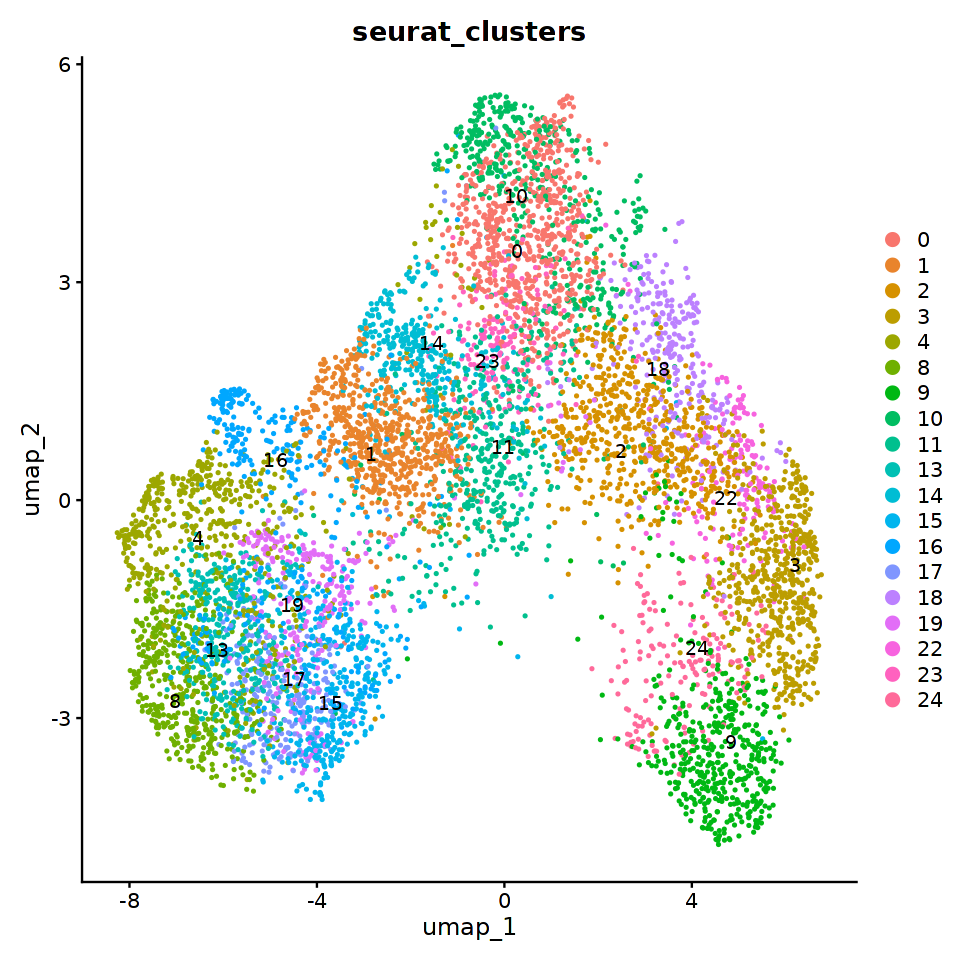

In [15]:
PP_Exo_EP_Subset_8<- subset(PP_Exo_EP_Subset_7, subset = seurat_clusters %in%  c(0,1,2,3,4, 8,9,
                                                                                 10,11,13,14,15,16,17,18,19,
                                                                                 22,23,24
                                                                               ))

PP_Exo_EP_Subset_8
DimPlot(PP_Exo_EP_Subset_8, label = TRUE, repel = TRUE, 
        reduction = "umap",group.by = 'seurat_clusters') 

In [16]:
# ---- Objects to process ----
obj_names <- c("PP_Exo_EP_Subset_8"
)

# ---- Deterministic RNG / execution ----
set.seed(777)
RNGkind("L'Ecuyer-CMRG")
plan(sequential)

process_one <- function(obj, umap_seed = 777, cluster_seed = 777, reduction_pref = "RNAMULTIVI") {
  DefaultAssay(obj) <- "RNA"

  # 1) HVGs / Scale / PCA (for robustness & fallback)
  obj <- FindVariableFeatures(obj, nfeatures = 3000)
  obj <- ScaleData(obj, features = VariableFeatures(obj))
  obj <- RunPCA(obj, features = VariableFeatures(obj))

  # 2) Choose reduction: prefer RNAMULTIVI if present, else use PCA
  red_to_use <- if (reduction_pref %in% Reductions(obj)) reduction_pref else "pca"

  # 3) Neighbors / UMAP on chosen reduction
  obj <- FindNeighbors(
    obj,
    reduction = red_to_use,
    dims      = 1:30,
    verbose   = FALSE
  )

  obj <- RunUMAP(
    obj,
    reduction   = red_to_use,
    dims        = 1:30,
    umap.method = "uwot",
    metric      = "cosine",
    seed.use    = umap_seed,
    verbose     = FALSE
  )

  # 4) Cluster on the SNN made by FindNeighbors
  # Graph name depends on DefaultAssay when using PCA or on assay name when using RNAMULTIVI.
  # Commonly it's "RNA_snn" for RNA-based neighbors, so we try that first and fall back if needed.
  graph_candidates <- c("RNA_snn", "SCT_snn", "integrated_snn", "pca_snn")
  graph_name <- graph_candidates[graph_candidates %in% names(obj@graphs)][1]
  if (is.na(graph_name)) stop("No *_snn graph found after FindNeighbors.")

  obj <- FindClusters(
    obj,
    graph.name   = graph_name,
    resolution   = 2,
    random.seed  = cluster_seed,
    verbose      = FALSE
  )

  obj
}

# ---- Run over all objects, assign back ----
for (nm in obj_names) {
  if (!exists(nm, inherits = TRUE)) {
    message(sprintf("Skipping '%s' (object not found)", nm))
    next
  }
  message(sprintf("Processing %s ...", nm))
  x <- get(nm, inherits = TRUE)
  # continue even if one fails
  x2 <- tryCatch(
    process_one(x),
    error = function(e) {
      message(sprintf("  ✗ Error in %s: %s", nm, e$message))
      return(NULL)
    }
  )
  if (!is.null(x2)) {
    assign(nm, x2, envir = .GlobalEnv)
    message(sprintf("  ✓ Done: %s", nm))
  }
}

# Quick check (optional)
# lapply(obj_names, function(nm) if (exists(nm)) { print(nm); print(c(Reductions(get(nm)), names(get(nm)@graphs))) })


Processing PP_Exo_EP_Subset_8 ...

Centering and scaling data matrix

PC_ 1 
Positive:  SPINK1, GNB2L1, NGFRAP1, SERPINA1, ANXA2, LRRC75A-AS1, CCND1, C11orf31, SEPW1, KRT18 
	   IGF2, WBP5, SERPINA5, ID3, POTEE, GFRA3, ATP5J, KRT8, TM4SF1, B2M 
	   ATP5L, ZFP36L1, CALB1, GMNN, TCEB2, S100A10, FAM84A, PABPC3, SOX9, CA4 
Negative:  RIMS2, DPP10, DACH1, CDKAL1, KALRN, SOX5, AUTS2, RFX3, HECW2, DCC 
	   PRICKLE2, SGCD, KCNH7, NPAS3, TOX, NBEA, KCNB2, FOXP2, KIAA1211, CACNB2 
	   NAV3, PDZRN3, RAP1GAP2, LINC02315, CACNA2D1, FMNL2, FHIT, SETBP1, LINC00907, ASTN2 
PC_ 2 
Positive:  RYR2, CACNA1A, CHGA, LINC02197, HEPACAM2, C1QL1, KCNK17, SSTR2, NEGR1, ST6GALNAC5 
	   GABBR2, AL024495.1, RIMBP2, SCG3, CACNA2D1, KCNB2, TSPAN5, RGS4, RGS9, PPP1R14C 
	   KCNK16, LDB2, KCNJ6, NEUROD1, NKX2-2, THSD4, INSM1, ASIC2, NFASC, PLCXD3 
Negative:  KIAA1217, NRG3, FRAS1, LYPD6B, MECOM, TRABD2B, AC092691.1, LHFPL3-AS2, SLC4A4, GPC6 
	   CARMIL1, UTRN, UNC5C, NHS, NIBAN1, LHFPL3, EXT1, LAMA1, FNDC3B, CDH6 
	 

In [ ]:
options(repr.plot.width = 8, repr.plot.height = 8)

DimPlot(PP_Exo_EP_Subset_8, reduction = 'umap', group.by = 'protocol', label=T)

DimPlot(PP_Exo_EP_Subset_8, reduction = 'umap', group.by = 'day', label=T) 

DimPlot(PP_Exo_EP_Subset_8, reduction = 'umap', group.by = 'seurat_clusters', label=T)

# ---- Settings ----
genes <- c(
  #'SOX17','CER1', 'CXCR4', 'EOMES', 'GSC', 'MIXL1', 'HHEX', #DE only
  #'GATA6','FOXA2','EPCAM', #DE and GT
  #'GATA4','HNF1B','HNF4A','ONECUT1','KRT8','KRT18', #GT
  'GATA4','GATA6','FOXA2',
  'SOX9','PDX1', #PP
  'CFTR','SPINK1','KRT7','KRT19','PTF1A', #Exo
  'CPA1','CPA2','PRSS1','PRSS2', #Exo
  'PNLIP','SOX9','HNF1B','KRT8','KRT18', 'SLC4A4',
  'NEUROG3','CHGA', #Endo
  'SLC18A1','TPH1',
  'NKX6-1','ERO1B','ISL1',
  'INS','IAPP',
  'HHEX','SST',
  'ARX','GCG',
  'STAT1','STAT4'
    )

out_dir <- "outputs/PP_Exo_EP_Subset_8_DT_Gene_marker_plots"
if (!dir.exists(out_dir)) dir.create(out_dir, recursive = TRUE)

# ---- Check genes present ----
present <- genes[genes %in% rownames(PP_Exo_EP_Subset_8)]
missing <- setdiff(genes, present)
if (length(missing)) {
  message("Missing from object (skipped): ", paste(missing, collapse = ", "))
}

# ---- Plot & save ----
for (g in present) {
  # build a safe filename
  fname <- file.path(out_dir, paste0("FeaturePlot_", g, ".png"))

  # make the plot
  p <- tryCatch({
    FeaturePlot(
      PP_Exo_EP_Subset_8, features = g,
      reduction = "umap",
      order = TRUE,       # draws higher-expressing cells on top
      raster = TRUE,      # faster/lighter for big objs
      pt.size = 2.5
    ) +
      ggtitle(g) +
      theme(
        plot.title = element_text(hjust = 0.5, face = "bold"),
        legend.title = element_blank()
      )
  }, error = function(e) {
    warning(sprintf("Failed to plot %s: %s", g, e$message))
    NULL
  })

  # save
  if (!is.null(p)) {
    ggsave(
      filename = fname, plot = p,
      dpi = 600, width = 4, height = 4, units = "in",
      device = "png"
    )
  }
}


An object of class Seurat 
95325 features across 7177 samples within 2 assays 
Active assay: RNA (17015 features, 3000 variable features)
 3 layers present: counts, data, scale.data
 1 other assay present: ATAC
 19 dimensional reductions calculated: RNAHARMONY, RNAINTEGRATED_LSI, RNAMULTIVI, RNAPCA, RNAUMAP, RNAUMAP.HARMONY, RNAUMAP.INTEGRATED.ATAC, RNAUMAP.MERGED.RNA, ATACHARMONY, ATACINTEGRATED_LSI, ATACMULTIVI, ATACPCA, ATACUMAP, ATACUMAP.HARMONY, ATACUMAP.INTEGRATED.ATAC, ATACUMAP.MERGED.RNA, umap.multivi, pca, umap

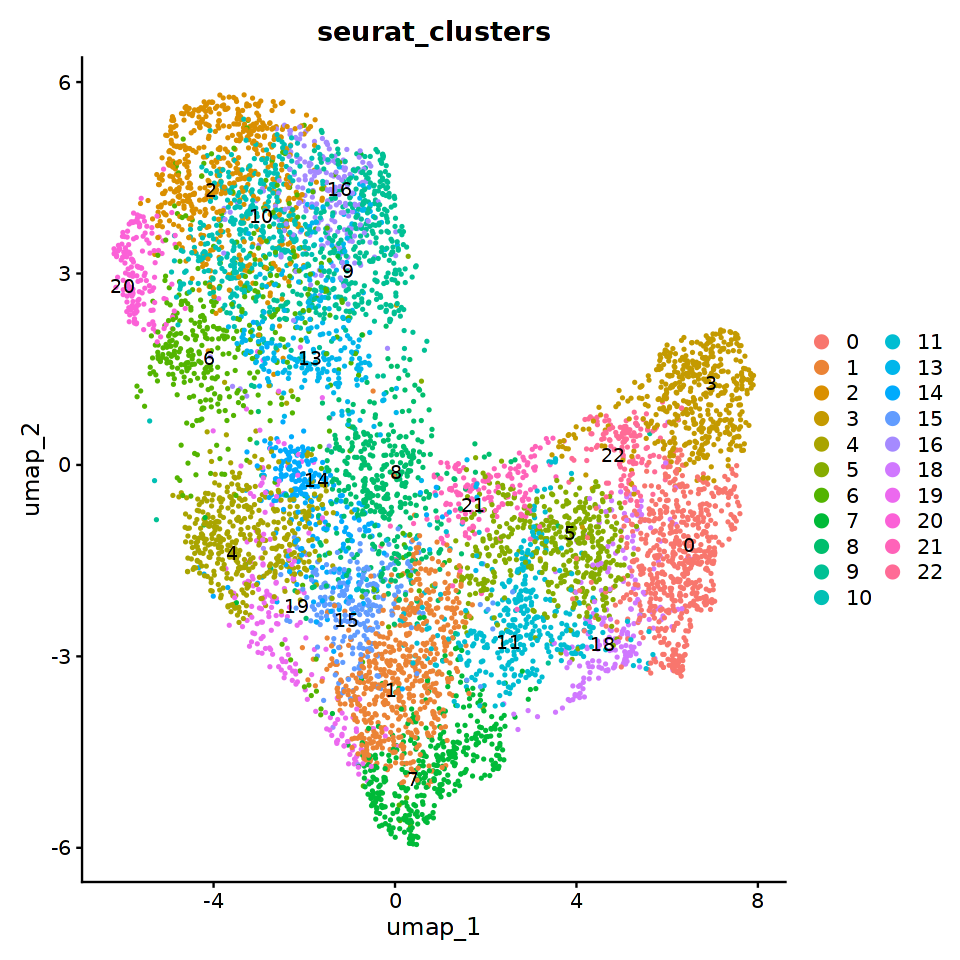

In [18]:
PP_Exo_EP_Subset_9<- subset(PP_Exo_EP_Subset_8, subset = seurat_clusters %in%  c(0,1,2,3,4,5,6,7,8,9,
                                                                                10,11,13,14,15,16,18,19,
                                                                                20,21,22))

PP_Exo_EP_Subset_9
DimPlot(PP_Exo_EP_Subset_9, label = TRUE, repel = TRUE, 
        reduction = "umap",group.by = 'seurat_clusters') 

In [19]:
# ---- Objects to process ----
obj_names <- c("PP_Exo_EP_Subset_9"
)

# ---- Deterministic RNG / execution ----
set.seed(777)
RNGkind("L'Ecuyer-CMRG")
plan(sequential)

process_one <- function(obj, umap_seed = 777, cluster_seed = 777, reduction_pref = "RNAMULTIVI") {
  DefaultAssay(obj) <- "RNA"

  # 1) HVGs / Scale / PCA (for robustness & fallback)
  obj <- FindVariableFeatures(obj, nfeatures = 3000)
  obj <- ScaleData(obj, features = VariableFeatures(obj))
  obj <- RunPCA(obj, features = VariableFeatures(obj))

  # 2) Choose reduction: prefer RNAMULTIVI if present, else use PCA
  red_to_use <- if (reduction_pref %in% Reductions(obj)) reduction_pref else "pca"

  # 3) Neighbors / UMAP on chosen reduction
  obj <- FindNeighbors(
    obj,
    reduction = red_to_use,
    dims      = 1:30,
    verbose   = FALSE
  )

  obj <- RunUMAP(
    obj,
    reduction   = red_to_use,
    dims        = 1:30,
    umap.method = "uwot",
    metric      = "cosine",
    seed.use    = umap_seed,
    verbose     = FALSE
  )

  # 4) Cluster on the SNN made by FindNeighbors
  # Graph name depends on DefaultAssay when using PCA or on assay name when using RNAMULTIVI.
  # Commonly it's "RNA_snn" for RNA-based neighbors, so we try that first and fall back if needed.
  graph_candidates <- c("RNA_snn", "SCT_snn", "integrated_snn", "pca_snn")
  graph_name <- graph_candidates[graph_candidates %in% names(obj@graphs)][1]
  if (is.na(graph_name)) stop("No *_snn graph found after FindNeighbors.")

  obj <- FindClusters(
    obj,
    graph.name   = graph_name,
    resolution   = 2,
    random.seed  = cluster_seed,
    verbose      = FALSE
  )

  obj
}

# ---- Run over all objects, assign back ----
for (nm in obj_names) {
  if (!exists(nm, inherits = TRUE)) {
    message(sprintf("Skipping '%s' (object not found)", nm))
    next
  }
  message(sprintf("Processing %s ...", nm))
  x <- get(nm, inherits = TRUE)
  # continue even if one fails
  x2 <- tryCatch(
    process_one(x),
    error = function(e) {
      message(sprintf("  ✗ Error in %s: %s", nm, e$message))
      return(NULL)
    }
  )
  if (!is.null(x2)) {
    assign(nm, x2, envir = .GlobalEnv)
    message(sprintf("  ✓ Done: %s", nm))
  }
}

# Quick check (optional)
# lapply(obj_names, function(nm) if (exists(nm)) { print(nm); print(c(Reductions(get(nm)), names(get(nm)@graphs))) })


Processing PP_Exo_EP_Subset_9 ...

Centering and scaling data matrix

PC_ 1 
Positive:  SPINK1, GNB2L1, NGFRAP1, SERPINA1, ANXA2, LRRC75A-AS1, CCND1, C11orf31, SEPW1, SERPINA5 
	   KRT18, WBP5, IGF2, ID3, POTEE, GFRA3, ATP5J, KRT8, TM4SF1, B2M 
	   ATP5L, GMNN, CALB1, S100A10, FAM84A, CA4, MTRNR2L1, ATPIF1, SPP1, C6orf48 
Negative:  RIMS2, DPP10, DACH1, KALRN, AUTS2, CDKAL1, SOX5, RFX3, DCC, HECW2 
	   KCNH7, PRICKLE2, SGCD, KIAA1211, PDZRN3, TOX, NPAS3, NBEA, FOXP2, LINC02315 
	   RAP1GAP2, FHIT, CACNB2, NAV3, KCNB2, LINC00907, SETBP1, FMNL2, DNAH7, ASTN2 
PC_ 2 
Positive:  KIAA1217, NRG3, FRAS1, MECOM, LYPD6B, TRABD2B, AC092691.1, GPC6, SLC4A4, LHFPL3-AS2 
	   CARMIL1, UTRN, LHFPL3, UNC5C, NIBAN1, CDH6, NHS, ANK3, LAMA1, HNF1A-AS1 
	   EXT1, MAML2, C5, FNDC3B, LINC01208, PLXDC2, ANGPT2, ERBB4, PDE3A, FN1 
Negative:  RYR2, CACNA1A, LINC02197, HEPACAM2, CHGA, C1QL1, SSTR2, KCNK17, NEGR1, GABBR2 
	   ST6GALNAC5, AL024495.1, KCNB2, CACNA2D1, TSPAN5, RIMBP2, PPP1R14C, SCG3, RGS4, RGS9 
	 

In [ ]:
options(repr.plot.width = 8, repr.plot.height = 8)

DimPlot(PP_Exo_EP_Subset_9, reduction = 'umap', group.by = 'protocol', label=T)

DimPlot(PP_Exo_EP_Subset_9, reduction = 'umap', group.by = 'day', label=T) 

DimPlot(PP_Exo_EP_Subset_9, reduction = 'umap', group.by = 'seurat_clusters', label=T)

# ---- Settings ----
genes <- c(
  #'SOX17','CER1', 'CXCR4', 'EOMES', 'GSC', 'MIXL1', 'HHEX', #DE only
  #'GATA6','FOXA2','EPCAM', #DE and GT
  #'GATA4','HNF1B','HNF4A','ONECUT1','KRT8','KRT18', #GT
  'GATA4','GATA6','FOXA2',
  'SOX9','PDX1', #PP
  'CFTR','SPINK1','KRT7','KRT19','PTF1A', #Exo
  'CPA1','CPA2','PRSS1','PRSS2', #Exo
  'PNLIP','SOX9','HNF1B','KRT8','KRT18', 'SLC4A4',
  'NEUROG3','CHGA', #Endo
  'SLC18A1','TPH1',
  'NKX6-1','ERO1B','ISL1',
  'INS','IAPP',
  'HHEX','SST',
  'ARX','GCG',
  'STAT1','STAT4'
    )

out_dir <- "outputs/PP_Exo_EP_Subset_9_DT_Gene_marker_plots"
if (!dir.exists(out_dir)) dir.create(out_dir, recursive = TRUE)

# ---- Check genes present ----
present <- genes[genes %in% rownames(PP_Exo_EP_Subset_9)]
missing <- setdiff(genes, present)
if (length(missing)) {
  message("Missing from object (skipped): ", paste(missing, collapse = ", "))
}

# ---- Plot & save ----
for (g in present) {
  # build a safe filename
  fname <- file.path(out_dir, paste0("FeaturePlot_", g, ".png"))

  # make the plot
  p <- tryCatch({
    FeaturePlot(
      PP_Exo_EP_Subset_9, features = g,
      reduction = "umap",
      order = TRUE,       # draws higher-expressing cells on top
      raster = TRUE,      # faster/lighter for big objs
      pt.size = 2.5
    ) +
      ggtitle(g) +
      theme(
        plot.title = element_text(hjust = 0.5, face = "bold"),
        legend.title = element_blank()
      )
  }, error = function(e) {
    warning(sprintf("Failed to plot %s: %s", g, e$message))
    NULL
  })

  # save
  if (!is.null(p)) {
    ggsave(
      filename = fname, plot = p,
      dpi = 600, width = 4, height = 4, units = "in",
      device = "png"
    )
  }
}


An object of class Seurat 
95325 features across 6726 samples within 2 assays 
Active assay: RNA (17015 features, 3000 variable features)
 3 layers present: counts, data, scale.data
 1 other assay present: ATAC
 19 dimensional reductions calculated: RNAHARMONY, RNAINTEGRATED_LSI, RNAMULTIVI, RNAPCA, RNAUMAP, RNAUMAP.HARMONY, RNAUMAP.INTEGRATED.ATAC, RNAUMAP.MERGED.RNA, ATACHARMONY, ATACINTEGRATED_LSI, ATACMULTIVI, ATACPCA, ATACUMAP, ATACUMAP.HARMONY, ATACUMAP.INTEGRATED.ATAC, ATACUMAP.MERGED.RNA, umap.multivi, pca, umap

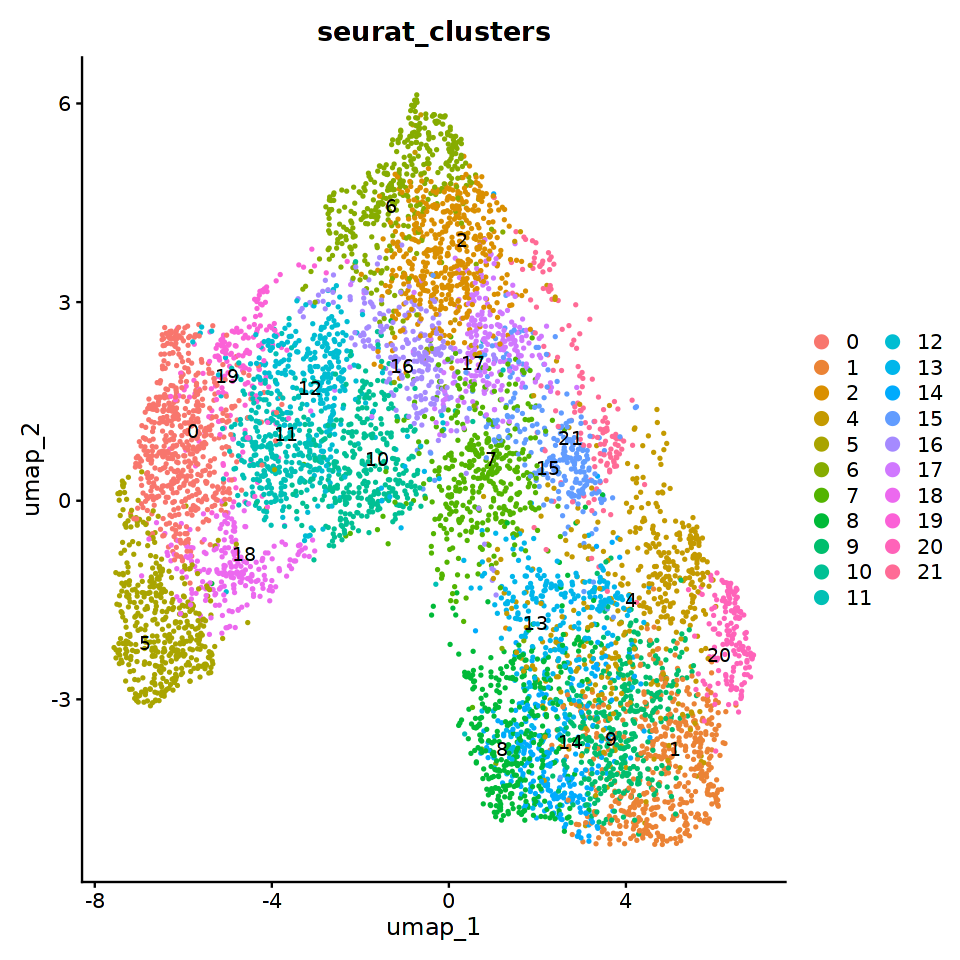

In [21]:
PP_Exo_EP_Subset_10<- subset(PP_Exo_EP_Subset_9, subset = seurat_clusters %in%  c(0,1,2 ,4,5,6,7,8,9,
                                                                                10,11,12,13,14,15,16,17,18,19,
                                                                                20,21))

PP_Exo_EP_Subset_10
DimPlot(PP_Exo_EP_Subset_10, label = TRUE, repel = TRUE, 
        reduction = "umap",group.by = 'seurat_clusters') 

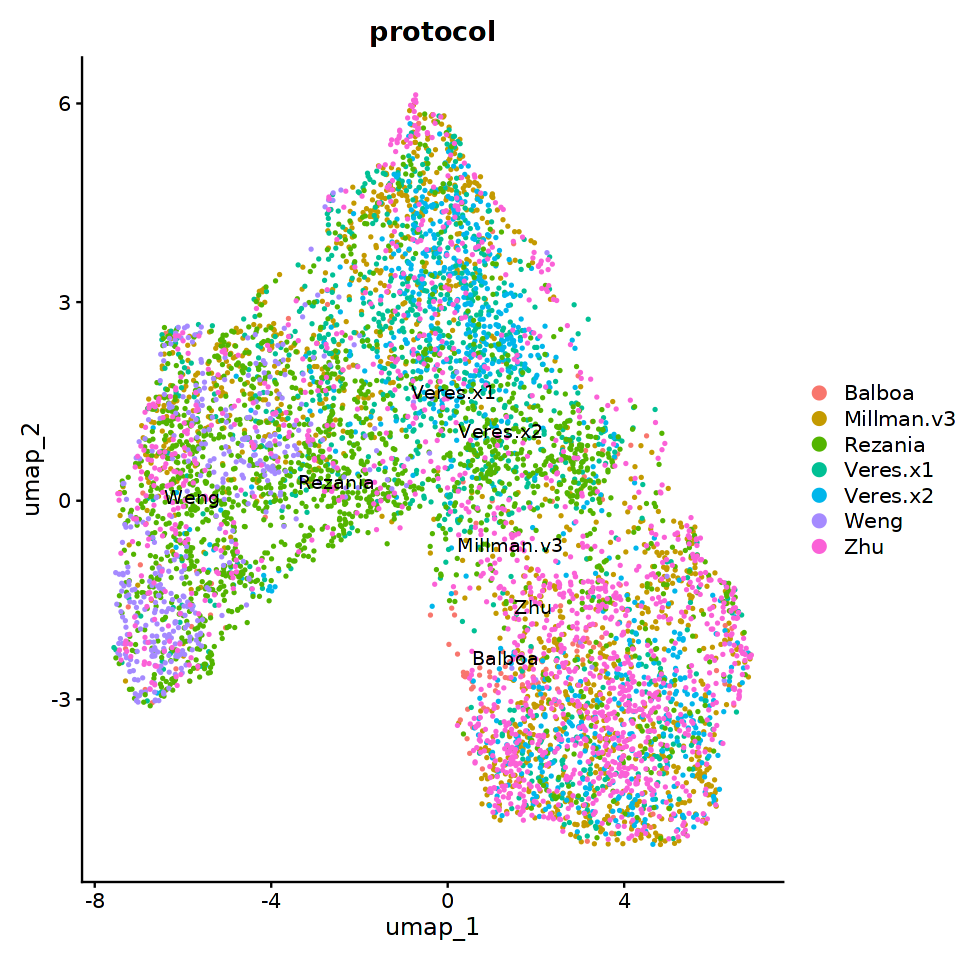

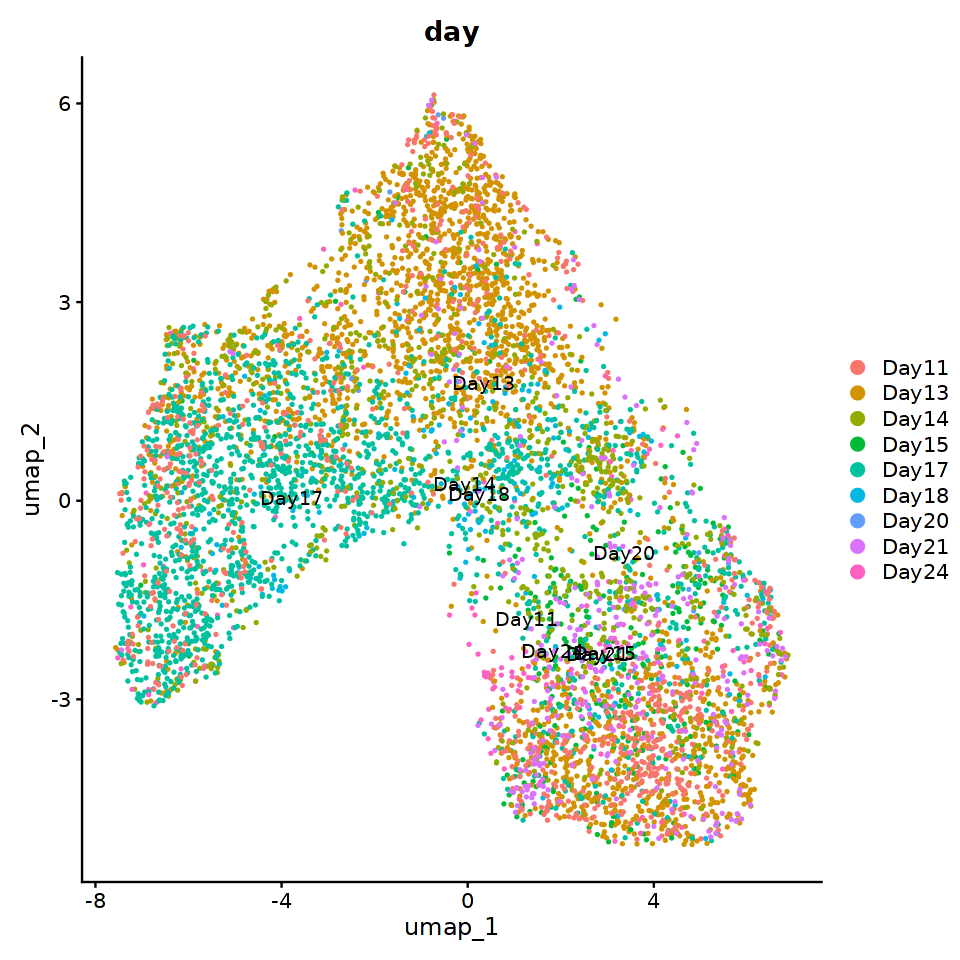

Missing from object (skipped): PNLIP



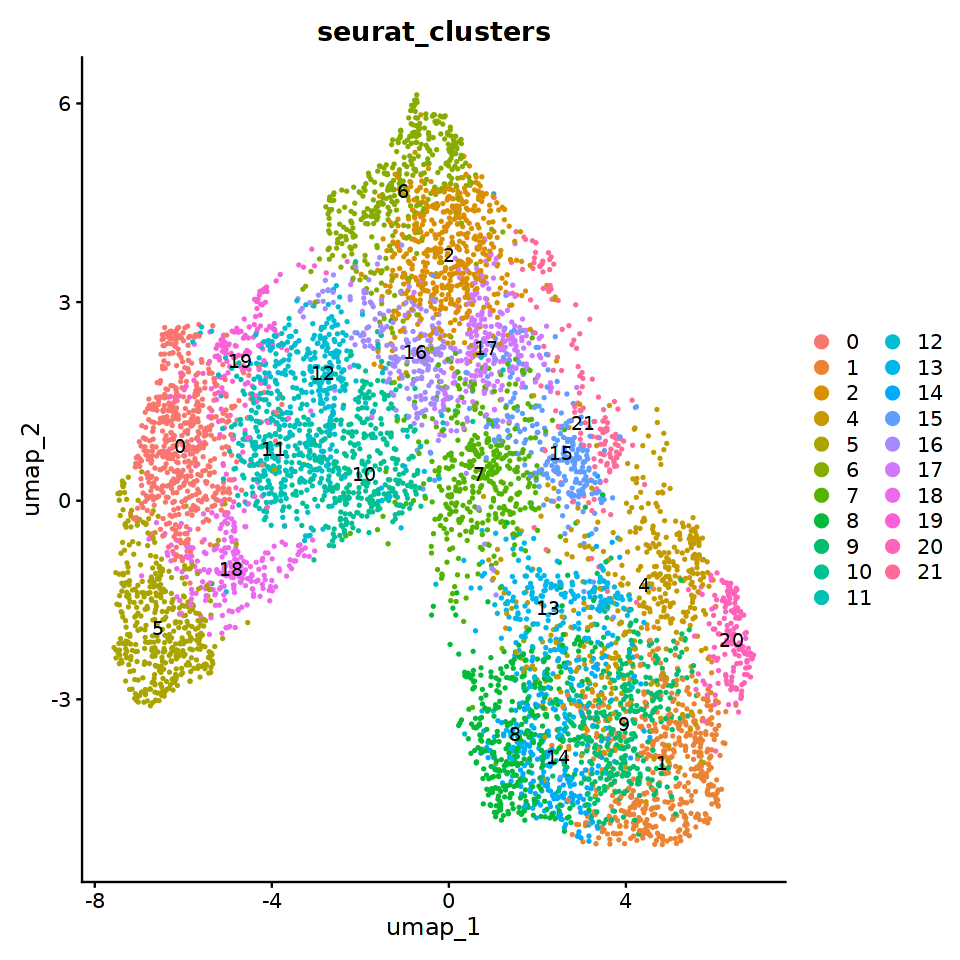

In [23]:
options(repr.plot.width = 8, repr.plot.height = 8)

DimPlot(PP_Exo_EP_Subset_10, reduction = 'umap', group.by = 'protocol', label=T)

DimPlot(PP_Exo_EP_Subset_10, reduction = 'umap', group.by = 'day', label=T) 

DimPlot(PP_Exo_EP_Subset_10, reduction = 'umap', group.by = 'seurat_clusters', label=T)

# ---- Settings ----
genes <- c(
  #'SOX17','CER1', 'CXCR4', 'EOMES', 'GSC', 'MIXL1', 'HHEX', #DE only
  #'GATA6','FOXA2','EPCAM', #DE and GT
  #'GATA4','HNF1B','HNF4A','ONECUT1','KRT8','KRT18', #GT
  'GATA4','GATA6','FOXA2',
  'SOX9','PDX1', #PP
  'CFTR','SPINK1','KRT7','KRT19','PTF1A', #Exo
  'CPA1','CPA2','PRSS1','PRSS2', #Exo
  'PNLIP','SOX9','HNF1B','KRT8','KRT18', 'SLC4A4',
  'NEUROG3','CHGA', #Endo
  'SLC18A1','TPH1',
  'NKX6-1','ERO1B','ISL1',
  'INS','IAPP',
  'HHEX','SST',
  'ARX','GCG',
  'STAT1','STAT4'
    )

out_dir <- "outputs/PP_Exo_EP_Subset_10_DT_Gene_marker_plots"
if (!dir.exists(out_dir)) dir.create(out_dir, recursive = TRUE)

# ---- Check genes present ----
present <- genes[genes %in% rownames(PP_Exo_EP_Subset_10)]
missing <- setdiff(genes, present)
if (length(missing)) {
  message("Missing from object (skipped): ", paste(missing, collapse = ", "))
}

# ---- Plot & save ----
for (g in present) {
  # build a safe filename
  fname <- file.path(out_dir, paste0("FeaturePlot_", g, ".png"))

  # make the plot
  p <- tryCatch({
    FeaturePlot(
      PP_Exo_EP_Subset_10, features = g,
      reduction = "umap",
      order = TRUE,       # draws higher-expressing cells on top
      raster = TRUE,      # faster/lighter for big objs
      pt.size = 2.5
    ) +
      ggtitle(g) +
      theme(
        plot.title = element_text(hjust = 0.5, face = "bold"),
        legend.title = element_blank()
      )
  }, error = function(e) {
    warning(sprintf("Failed to plot %s: %s", g, e$message))
    NULL
  })

  # save
  if (!is.null(p)) {
    ggsave(
      filename = fname, plot = p,
      dpi = 600, width = 4, height = 4, units = "in",
      device = "png"
    )
  }
}


In [24]:
saveRDS(PP_Exo_EP_Subset_10, file = "checkpoints/DT_PP_Exo_EP_broad_Subset.rds")

# PP_Exo_EP_Anotation_Pseudotime_Plots

In [3]:
PP_Exo_EP_Subset_X <- readRDS("checkpoints/DT_PP_Exo_EP_broad_Subset.rds")

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Saved: STAT1

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Saved: ID1

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Saved: ELF1

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Saved: CTCF

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Saved: PROX1

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Saved: SOX9

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Saved: ZEB1

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Saved: EBF1



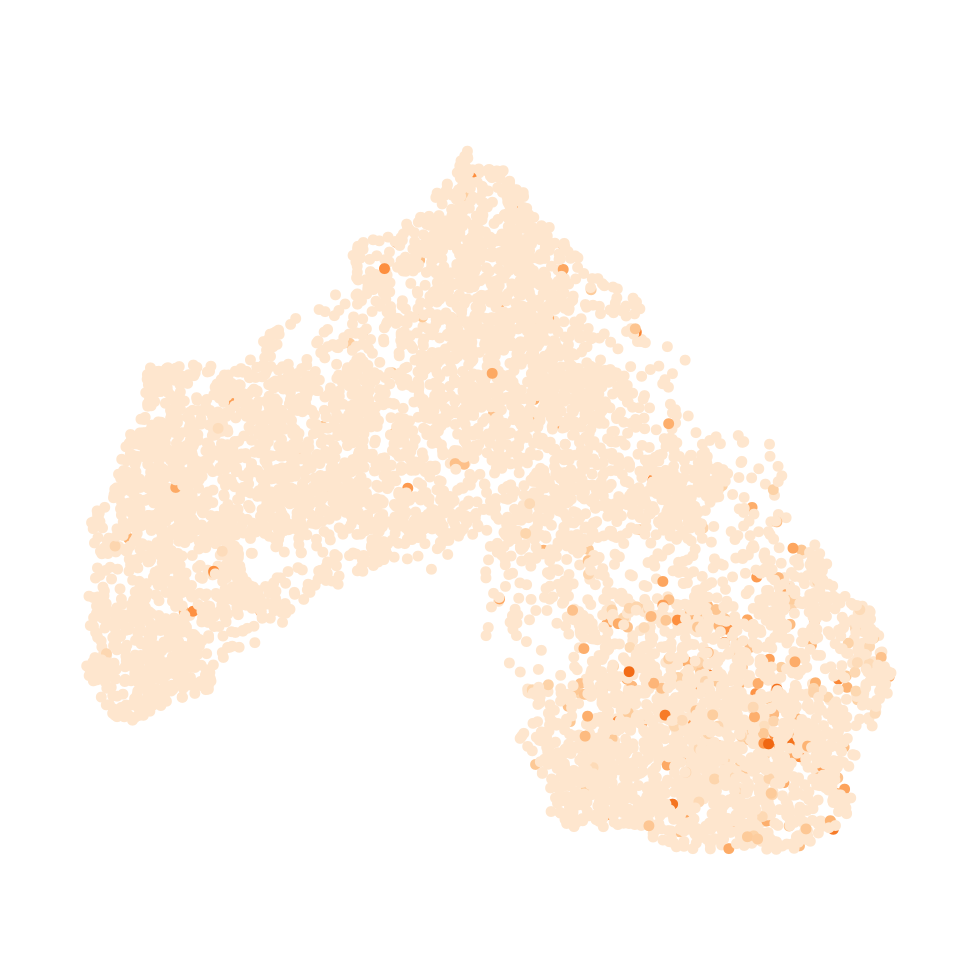

In [14]:
#Save Feature Plots Fig. S19E

purples_pal <- colorRampPalette(brewer.pal(9, "Oranges")[2:9])  # or [4:9] for even darker


# Genes you want to plot
genes_to_plot <- c('STAT1','ID1','ELF1','CTCF','PROX1','SOX9','ZEB1','EBF1'
)

# Output directory
out_dir <- "outputs/celloracle_figures/DT_Subset_PP_Exo_EP"
dir.create(out_dir, recursive = TRUE, showWarnings = FALSE)

for (g in genes_to_plot) {
  p <- FeaturePlot(
    PP_Exo_EP_Subset_X,
    features  = g,
    reduction = "umap",
    pt.size   = 1.8
  ) + scale_color_gradientn(limits  = c(0, 5),  colours = purples_pal(100)) + NoAxes() +ggtitle('') +NoLegend()
  
  ggsave(
    filename = file.path(out_dir, paste0("umap_DT_PP_Exo_EP_", g, "_nolegend_noaxis.png")),
    plot     = p,
    width    = 7, height = 7, units = "in",
    dpi      = 600,
    bg       = "white",
    device   = ragg::agg_png  # crisp text/lines
  )
  
  message("Saved: ", g)
}

# Optionally display the last one
p


Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Saved: CFTR

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Saved: STAT1

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Saved: STAT4

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Saved: GATA4

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Saved: GATA6

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Saved: SOX9

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Saved: SPINK1

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Saved: FOXA1

Scale for colour 

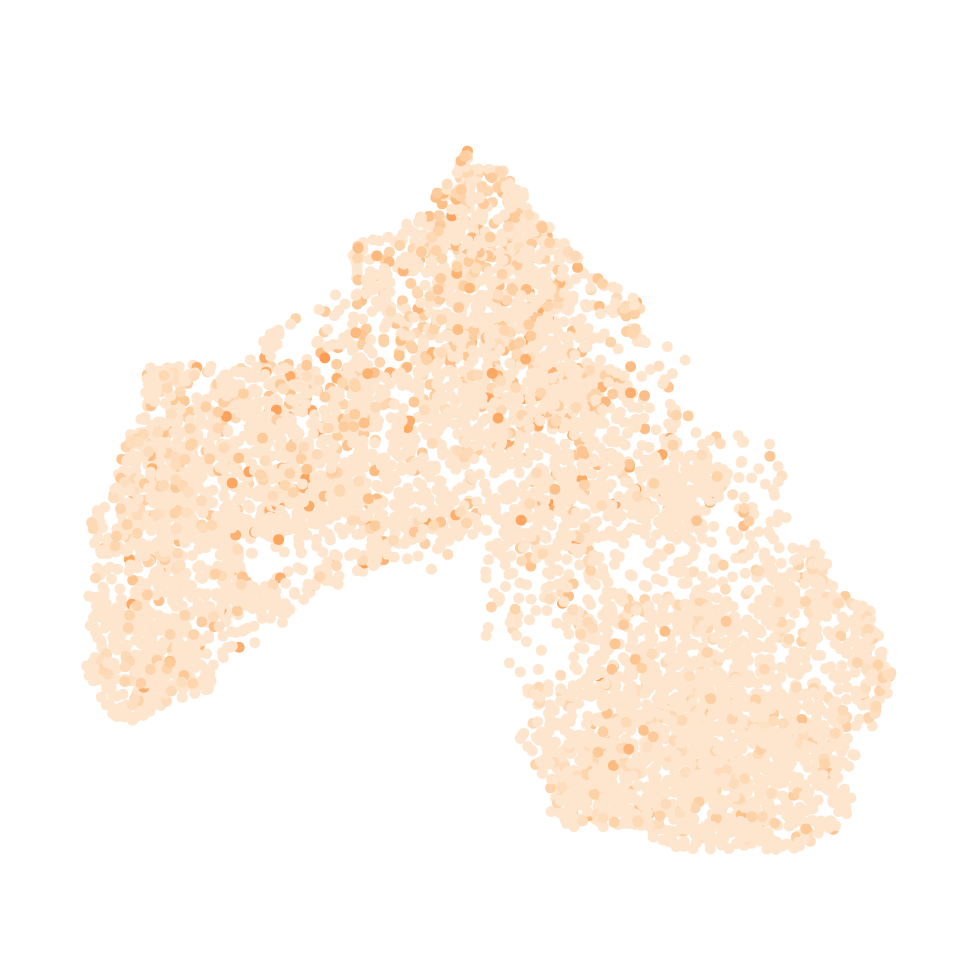

In [15]:
#Save Feature Plots Fig. S19B

purples_pal <- colorRampPalette(brewer.pal(9, "Oranges")[2:9])  # or [4:9] for even darker


# Genes you want to plot
genes_to_plot <- c('CFTR','STAT1','STAT4','GATA4','GATA6','SOX9','SPINK1','FOXA1','FOXA2','ONECUT1','PDX1','HHEX','SPINK1',
                   'NKX6-1','ERO1B','CHGA','NEUROG3','PTF1A','KRT8','KRT18','KRT19','HNF1B'
)

# Output directory
out_dir <- "outputs/celloracle_figures/DT_Subset_PP_Exo_EP"
dir.create(out_dir, recursive = TRUE, showWarnings = FALSE)

for (g in genes_to_plot) {
  p <- FeaturePlot(
    PP_Exo_EP_Subset_X,
    features  = g,
    reduction = "umap",
    pt.size   = 1.8
  ) + scale_color_gradientn(limits  = c(0, 8),  colours = purples_pal(100)) + NoAxes() +ggtitle('') +NoLegend()
  
  ggsave(
    filename = file.path(out_dir, paste0("umap_DT_PP_Exo_EP_", g, "_nolegend_noaxis.png")),
    plot     = p,
    width    = 7, height = 7, units = "in",
    dpi      = 600,
    bg       = "white",
    device   = ragg::agg_png  # crisp text/lines
  )
  
  message("Saved: ", g)
}

# Optionally display the last one
p


In [16]:
table(PP_Exo_EP_Subset_X@meta.data$day)


 Day3  Day4  Day5  Day6  Day7  Day8  Day9 Day10 Day11 Day13 Day14 Day15 Day16 
    0     0     0     0     0     0     0     0   794  2297   888   339     0 
Day17 Day18 Day20 Day21 Day24 Day25 Day26 Day31 Day32 Day33 Day34 Day39 Day41 
 1685   220    17   312   174     0     0     0     0     0     0     0     0 
Day45 Day48 Day66 
    0     0     0 

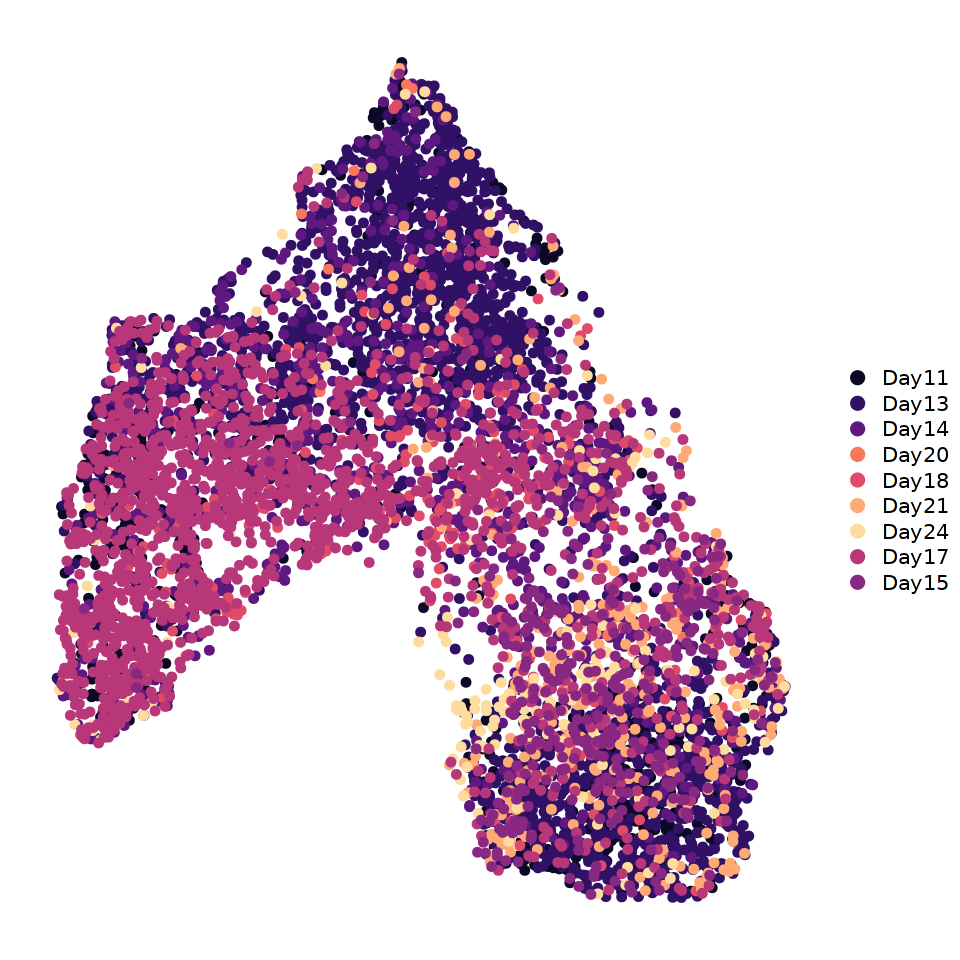

In [17]:
magma_29 <- c(
  '#000004',
  '#040414',
  '#0C0926',
  '#160F3B',
  '#221150',
  '#311165',
  '#400F74',
  '#51127C',
  '#5F187F',
  '#6D1D81',
  '#7B2382',
  '#892881',
  '#982D80',
  '#A6317D',
  '#B73779',
  '#C53C74',
  '#D3436E',
  '#E04C67',
  '#EB5760',
  '#F3655C',
  '#F8765C',
  '#FC8961',
  '#FD9A6A',
  '#FEAA74',
  '#FEBB81',
  '#FECC8F',
  '#FDDC9E',
  '#FCECAE',
  '#FCFDBF'
)


pal_days <- c(
  "Day11" = magma_29[3],
  "Day13" = magma_29[6],
  "Day14" = magma_29[9],
  "Day15" = magma_29[12],
  "Day17" = magma_29[15],
  "Day18" = magma_29[18],
  "Day20" = magma_29[21],
  "Day21" = magma_29[24],
  "Day24" = magma_29[27]
 )


#BuYlRd_Ed <- c('#D53E4F','#F46D43','#FDAE61', '#fcd462', '#f0f0a8','#ABD9E9','#74ADD1','#4575B4','#5e4fa2')

p <- DimPlot(
  PP_Exo_EP_Subset_X,
  reduction = "umap",
  group.by  = "day",
  label     = FALSE,
    pt.size = 1.8 ,   
  order     = c('Day15','Day17','Day24','Day21','Day18','Day20','Day14','Day13','Day11'),
  cols      = pal_days
) +
  #NoLegend() +
  NoAxes() +
  theme(plot.title = element_blank()) +
  labs(x = NULL, y = NULL)

# preview
p #Fig. 4A

# save @ 600 dpi (PNG)
ggsave(
  filename = "outputs/celloracle_figures/DT_Subset_PP_Exo_EP/umap_DT_PP_Exo_EP_day_legend_noaxes.png",
  plot     = p,
  width    = 7, height = 7, units = "in",
  dpi      = 600,
  bg       = "white",
  device   = ragg::agg_png  # crisp text/lines
)


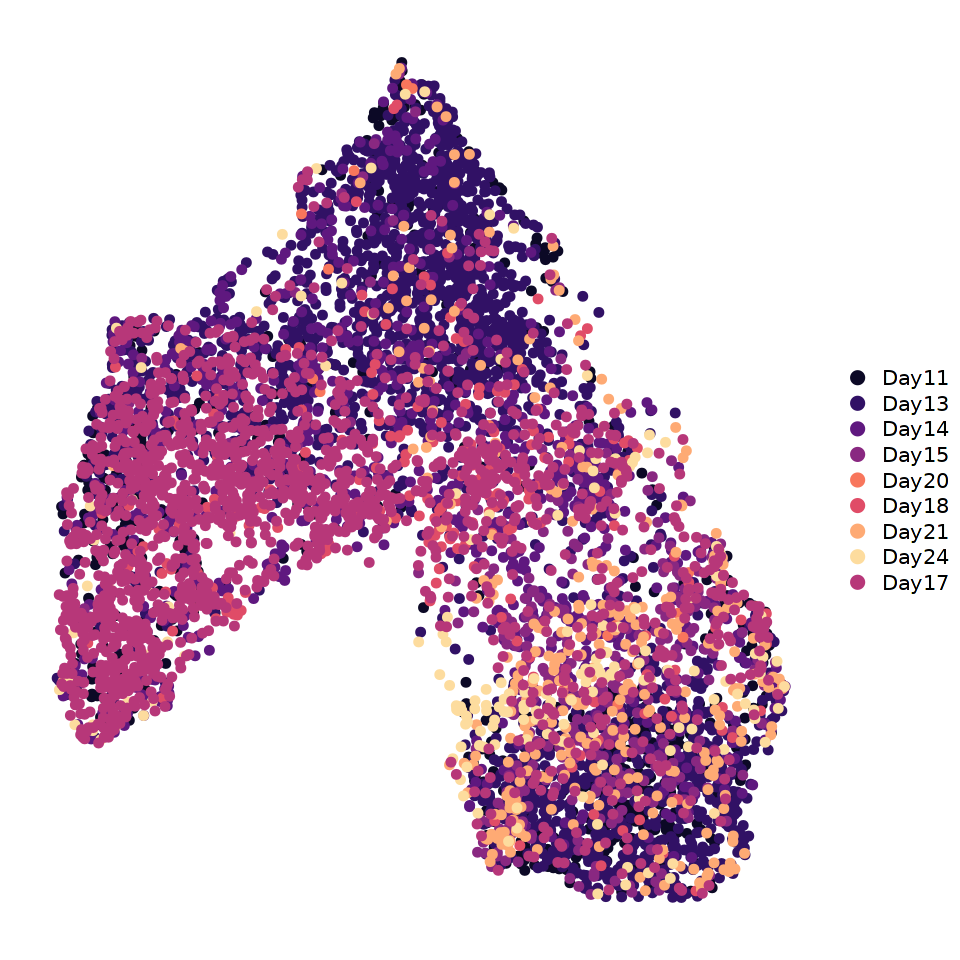

In [18]:
magma_29 <- c(
  '#000004',
  '#040414',
  '#0C0926',
  '#160F3B',
  '#221150',
  '#311165',
  '#400F74',
  '#51127C',
  '#5F187F',
  '#6D1D81',
  '#7B2382',
  '#892881',
  '#982D80',
  '#A6317D',
  '#B73779',
  '#C53C74',
  '#D3436E',
  '#E04C67',
  '#EB5760',
  '#F3655C',
  '#F8765C',
  '#FC8961',
  '#FD9A6A',
  '#FEAA74',
  '#FEBB81',
  '#FECC8F',
  '#FDDC9E',
  '#FCECAE',
  '#FCFDBF'
)


pal_days <- c(
  "Day11" = magma_29[3],
  "Day13" = magma_29[6],
  "Day14" = magma_29[9],
  "Day15" = magma_29[12],
  "Day17" = magma_29[15],
  "Day18" = magma_29[18],
  "Day20" = magma_29[21],
  "Day21" = magma_29[24],
  "Day24" = magma_29[27]
 )


#BuYlRd_Ed <- c('#D53E4F','#F46D43','#FDAE61', '#fcd462', '#f0f0a8','#ABD9E9','#74ADD1','#4575B4','#5e4fa2')

p <- DimPlot(
  PP_Exo_EP_Subset_X,
  reduction = "umap",
  group.by  = "day",
  label     = FALSE,
    pt.size = 1.8 ,   
  order     = c('Day17','Day24','Day21','Day18','Day20','Day15','Day14','Day13','Day11'),
  cols      = pal_days
) +
  #NoLegend() +
  NoAxes() +
  theme(plot.title = element_blank()) +
  labs(x = NULL, y = NULL)

# preview
p #Fig. 4A

# save @ 600 dpi (PNG)
ggsave(
  filename = "outputs/celloracle_figures/DT_Subset_PP_Exo_EP/umap_DT_PP_Exo_EP_day_legend_noaxes.png",
  plot     = p,
  width    = 7, height = 7, units = "in",
  dpi      = 600,
  bg       = "white",
  device   = ragg::agg_png  # crisp text/lines
)


In [21]:
PP_Exo_EP_Subset_X <- FindClusters(
    PP_Exo_EP_Subset_X,
    graph.name   = 'RNA_snn',
    resolution   = 5,
    random.seed  = 777,
    verbose      = FALSE
  )

  PP_Exo_EP_Subset_X

Warning message:
“Adding a command log without an assay associated with it”


An object of class Seurat 
95325 features across 6726 samples within 2 assays 
Active assay: RNA (17015 features, 3000 variable features)
 3 layers present: counts, data, scale.data
 1 other assay present: ATAC
 19 dimensional reductions calculated: RNAHARMONY, RNAINTEGRATED_LSI, RNAMULTIVI, RNAPCA, RNAUMAP, RNAUMAP.HARMONY, RNAUMAP.INTEGRATED.ATAC, RNAUMAP.MERGED.RNA, ATACHARMONY, ATACINTEGRATED_LSI, ATACMULTIVI, ATACPCA, ATACUMAP, ATACUMAP.HARMONY, ATACUMAP.INTEGRATED.ATAC, ATACUMAP.MERGED.RNA, umap.multivi, pca, umap

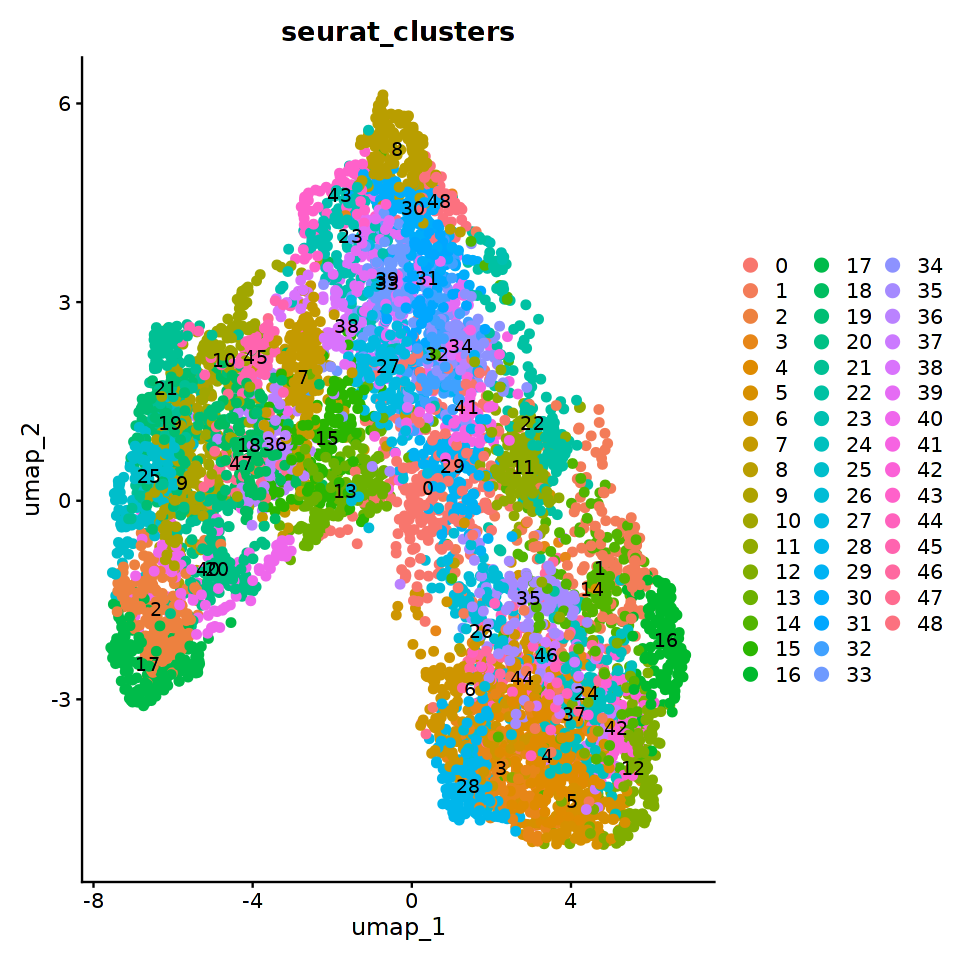

In [ ]:
DimPlot(
  PP_Exo_EP_Subset_X,
  reduction = "umap",
  group.by  = "seurat_clusters",
  label     = TRUE,
    pt.size = 1.8 )

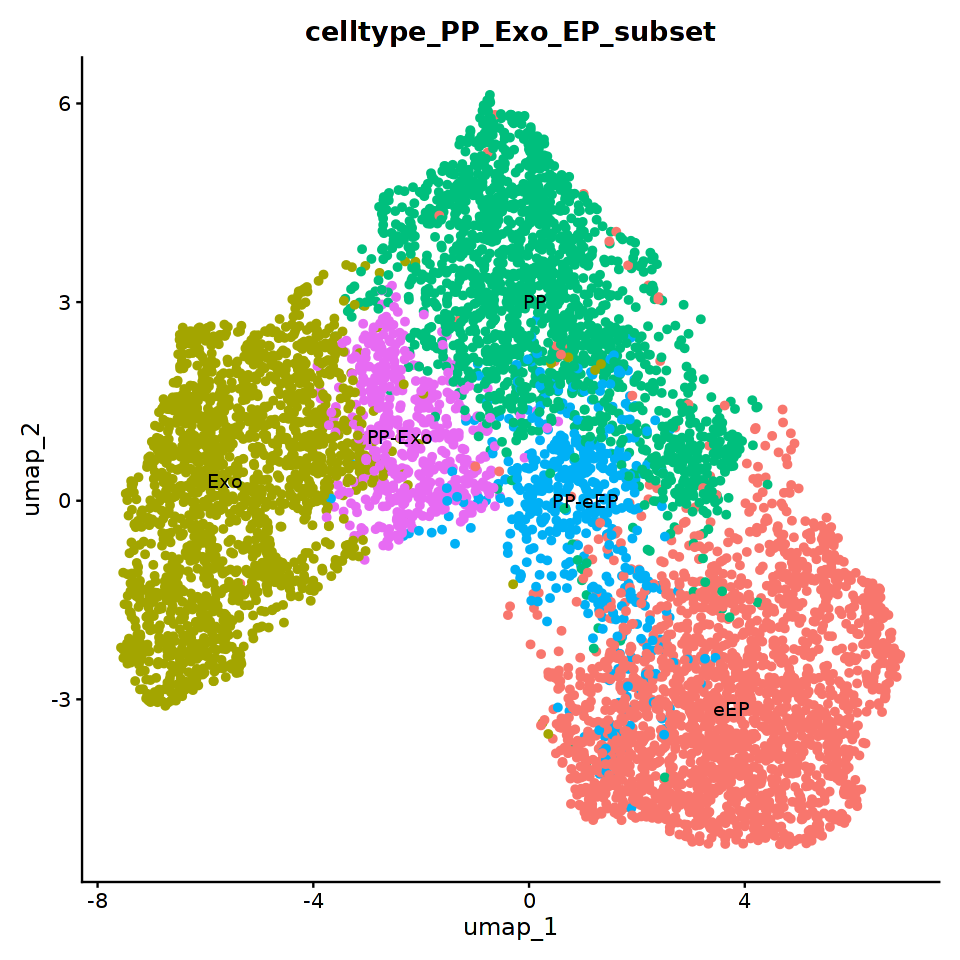

In [23]:
# Asignar los clusters A y B según 'orig.ident'
PP_Exo_EP_Subset_X@meta.data$celltype_PP_Exo_EP_subset <- "Z"
PP_Exo_EP_Subset_X@meta.data$celltype_PP_Exo_EP_subset[PP_Exo_EP_Subset_X@meta.data$seurat_clusters %in% c(11,8,22,23,27,30,31,32,33,34,38,39,41,43,48)] <- 'PP'
PP_Exo_EP_Subset_X@meta.data$celltype_PP_Exo_EP_subset[PP_Exo_EP_Subset_X@meta.data$seurat_clusters %in% c(0,26,29)] <- 'PP-eEP'
PP_Exo_EP_Subset_X@meta.data$celltype_PP_Exo_EP_subset[PP_Exo_EP_Subset_X@meta.data$seurat_clusters %in% c(7,13,15)] <- 'PP-Exo'
PP_Exo_EP_Subset_X@meta.data$celltype_PP_Exo_EP_subset[PP_Exo_EP_Subset_X@meta.data$seurat_clusters %in% c(1,3,4,5,6,12,14,16,24,28,35,37,42,44,46)] <- 'eEP'
PP_Exo_EP_Subset_X@meta.data$celltype_PP_Exo_EP_subset[PP_Exo_EP_Subset_X@meta.data$seurat_clusters %in% c(2,9,10,17,18,19,20,21,25,36,40,45,47)] <- 'Exo'

options(repr.plot.width = 8, repr.plot.height = 8)
DimPlot(PP_Exo_EP_Subset_X, reduction = 'umap', group.by = 'celltype_PP_Exo_EP_subset', pt.size = 1.5,label=T) +NoLegend()

In [24]:
pal <- c(
        "Mesench." = "#ffbd00",  # yellow
        "UE"       = "#EE3377", # magenta / raspberry
        "DE"       = "#a7defa", # light sky blue
        "GT"       = "#DDCC77", # warm sand / golden khaki
        "PP"       = '#402bad', # deep indigo
        'PP-Exo'   = '#07C0F0',
        'PP-eEP'   = '#BD27A3',
        "Exo"      = "#117733", # forest green
        "eEP"      = "#fcb686", # light orange
        "lEP"      = '#cd853f', #Peru color
        "Alpha"    = "#f55e07", # vivid orange
        "Delta"    = "#7d9e31", # olive
        'SIC'      = "#015f94", # royal blue
        "Beta"     = "#ba0c2f" # WashU red
  )

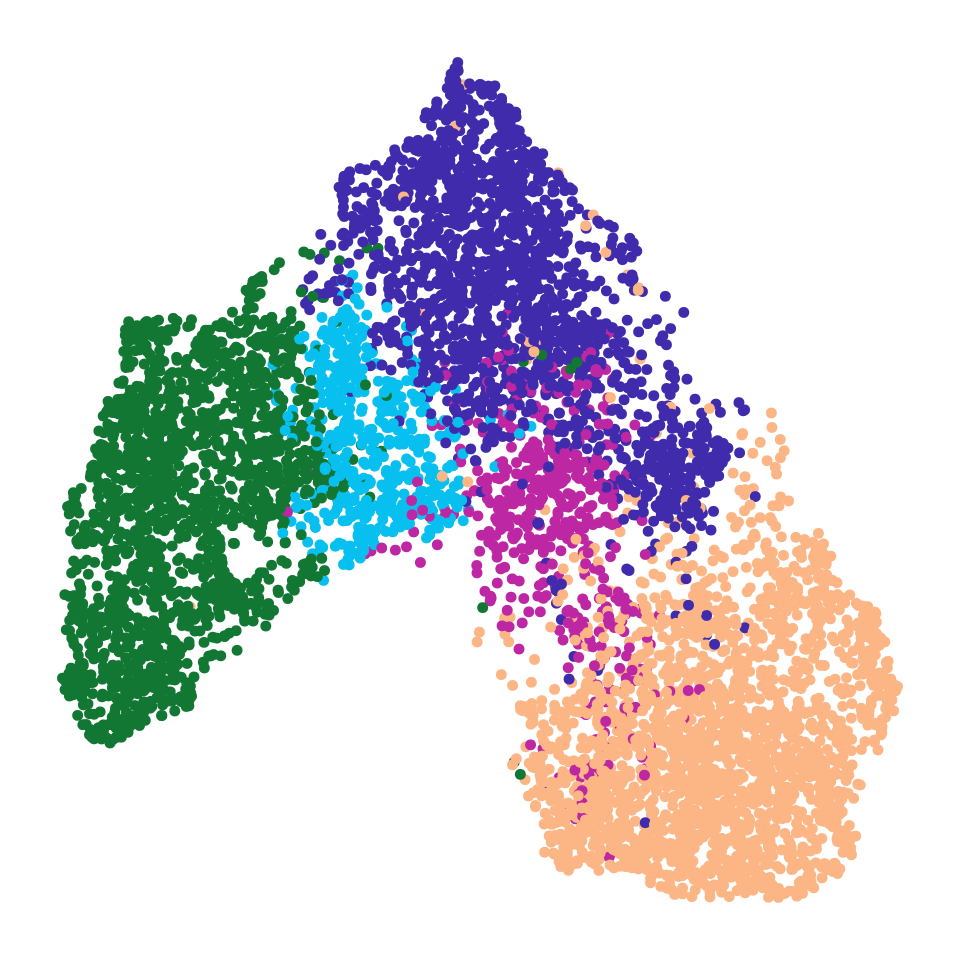

In [26]:
p <- DimPlot(
  PP_Exo_EP_Subset_X,
  reduction = "umap",
  group.by  = "celltype_PP_Exo_EP_subset",
  label     = FALSE,
    pt.size = 1.8 ,
  cols      = pal
) +
  NoLegend() +
  NoAxes() +
  theme(plot.title = element_blank()) +
  labs(x = NULL, y = NULL)

# preview
p #Fig. 4C

# save @ 600 dpi (PNG)
ggsave(
  filename = "outputs/celloracle_figures/DT_Subset_PP_Exo_EP/umap_DT_PP_Exo_EP_nolegend_noaxes.png",
  plot     = p,
  width    = 7, height = 7, units = "in",
  dpi      = 600,
  bg       = "white",
  device   = ragg::agg_png  # crisp text/lines
)


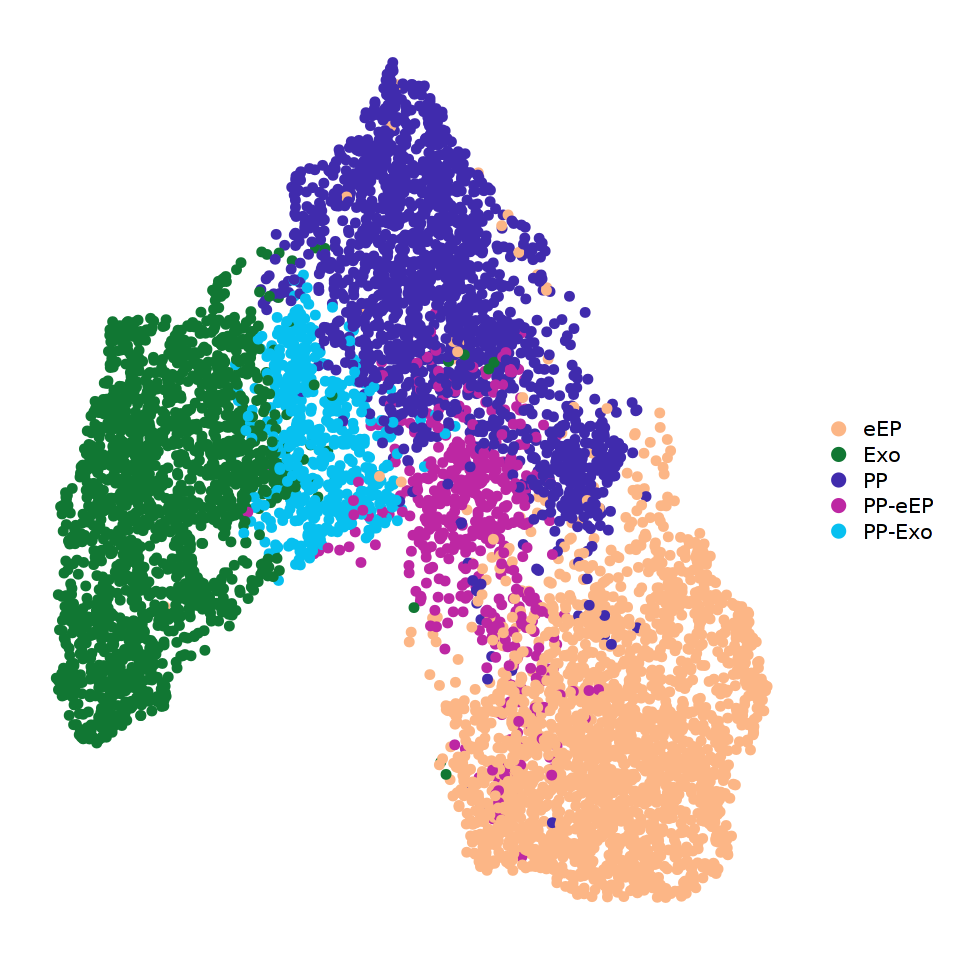

In [27]:
p <- DimPlot(
  PP_Exo_EP_Subset_X,
  reduction = "umap",
  group.by  = "celltype_PP_Exo_EP_subset",
  label     = FALSE,
    pt.size = 1.8 ,
  cols      = pal
) +
  #NoLegend() +
  NoAxes() +
  theme(plot.title = element_blank()) +
  labs(x = NULL, y = NULL)

# preview
p #Fig. 4C

# save @ 600 dpi (PNG)
ggsave(
  filename = "outputs/celloracle_figures/DT_Subset_PP_Exo_EP/umap_DT_PP_Exo_EP_legend_noaxes.png",
  plot     = p,
  width    = 7, height = 7, units = "in",
  dpi      = 600,
  bg       = "white",
  device   = ragg::agg_png  # crisp text/lines
)


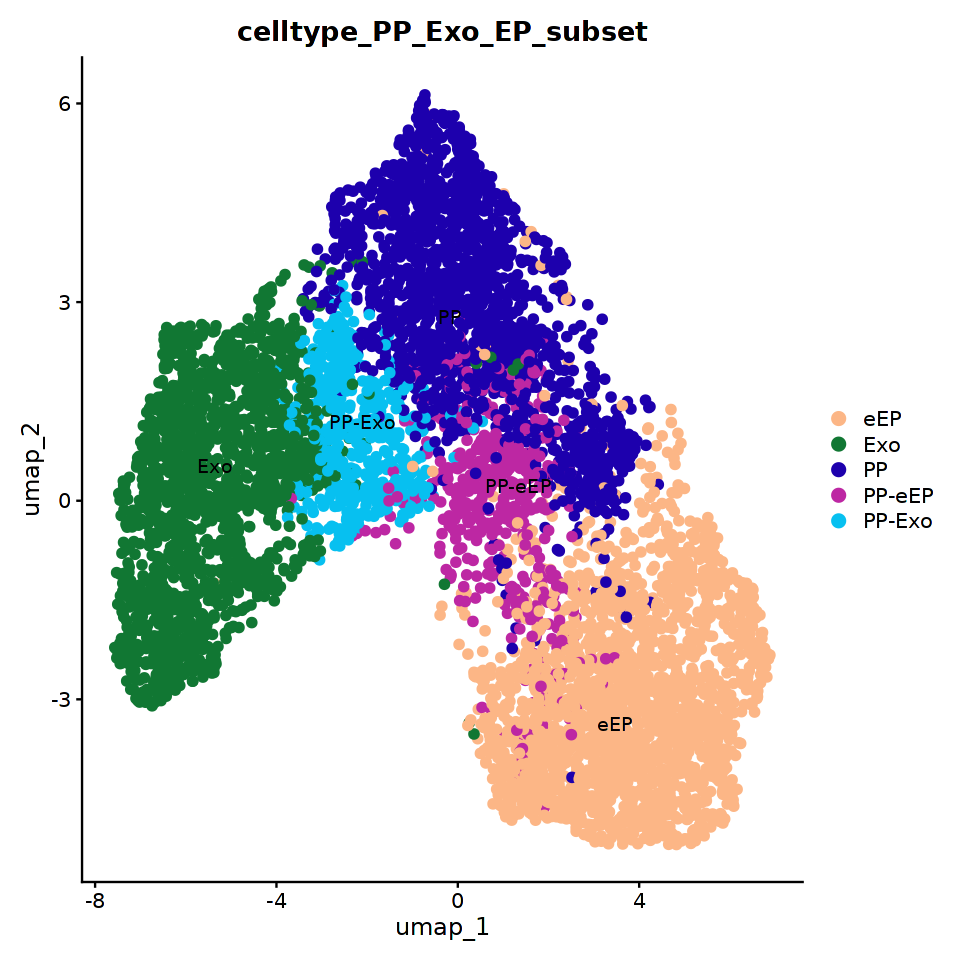

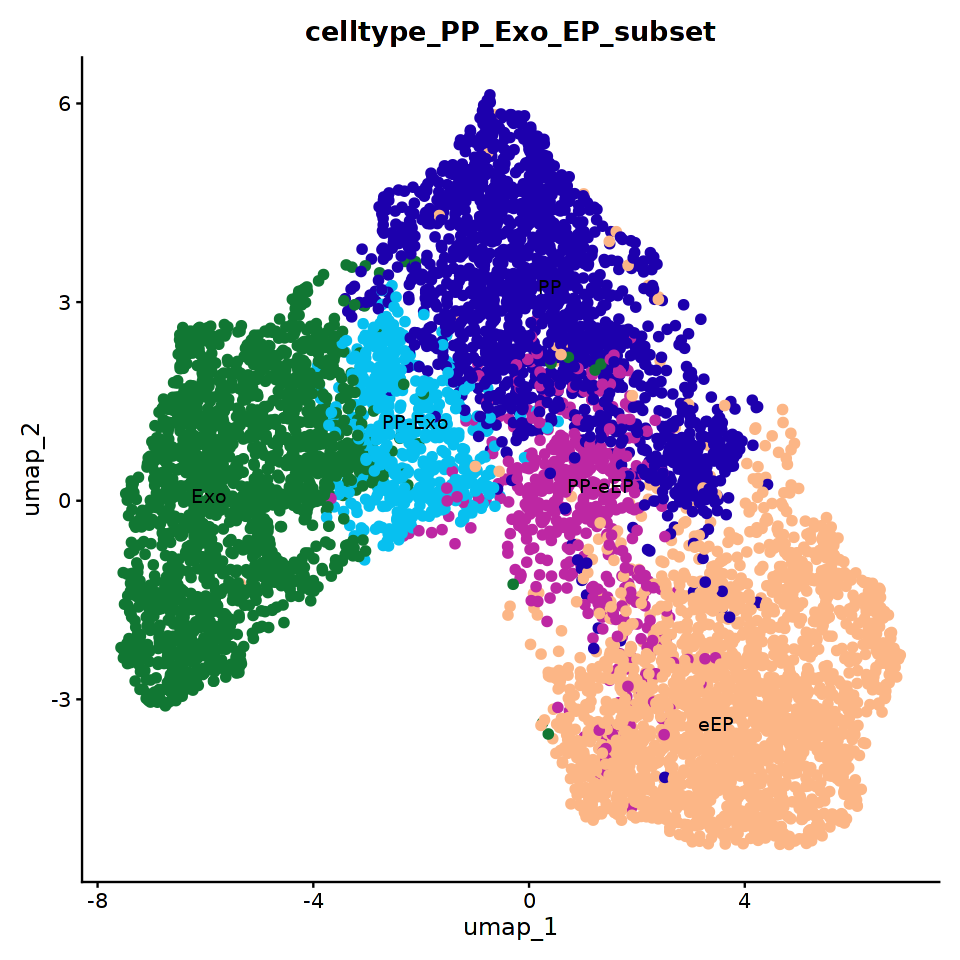

In [19]:
DimPlot(PP_Exo_EP_Subset_X, label = TRUE, repel = TRUE, 
        reduction = "umap",group.by = 'celltype_PP_Exo_EP_subset', cols=pal,pt.size = 2) 

DimPlot(PP_Exo_EP_Subset_X, label = TRUE, repel = TRUE, 
        reduction = "umap",group.by = 'celltype_PP_Exo_EP_subset', cols=pal,pt.size = 2)  + theme(legend.position = "none")


Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Warning message in plot_theme(plot):
“The `panel.margin` theme element is not defined in the element hierarchy.”
Warning message:
“Removed 40 rows containing missing values or values outside the scale range
(`geom_point()`).”
Warning message in plot_theme(plot):
“The `panel.margin` theme element is not defined in the element hierarchy.”
Warning message:
“Removed 40 rows containing missing values or values outside the scale range
(`geom_point()`).”


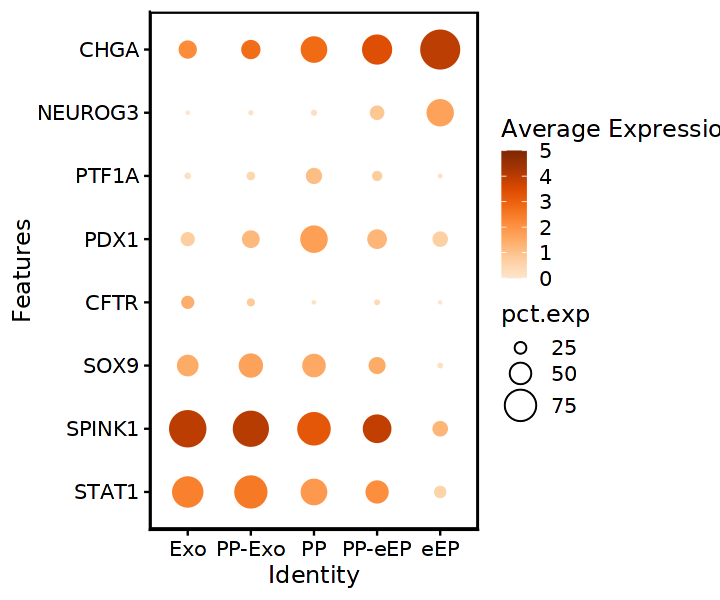

In [20]:
order_ct <- c('Exo', 'PP-Exo', 'PP', 'PP-eEP', 'eEP')

DefaultAssay(PP_Exo_EP_Subset_X) <- "RNA"
Idents(PP_Exo_EP_Subset_X) <- "celltype_PP_Exo_EP_subset"

# Force the order
PP_Exo_EP_Subset_X$celltype_PP_Exo_EP_subset <- factor(
  PP_Exo_EP_Subset_X$celltype_PP_Exo_EP_subset,
  levels = order_ct
)
Idents(PP_Exo_EP_Subset_X) <- "celltype_PP_Exo_EP_subset"

#Ed colors
library(RColorBrewer)

# Palette (same as your FeaturePlots)
purples_pal <- colorRampPalette(brewer.pal(9, "Oranges")[2:9])

# Gene Expression Dotplot
DefaultAssay(PP_Exo_EP_Subset_X) <- "RNA"
Idents(PP_Exo_EP_Subset_X) <- "celltype_PP_Exo_EP_subset"

genes <- c(
    'STAT1','SPINK1','SOX9','CFTR',
    #'GATA4','GATA6',
    'PDX1','PTF1A',
    'NEUROG3','CHGA'
)

options(repr.plot.width = 6, repr.plot.height = 5)

dp_celltype <- DotPlot(
  PP_Exo_EP_Subset_X,
  features  = genes,
  dot.scale = 10,
  scale     = FALSE    # 🔴 keep raw avg.exp, so 0–8 is meaningful
) +
  geom_point(
    aes(size = pct.exp),
    shape  = 21,
    colour = NA,
    stroke = 0.5
  ) +
  coord_flip() +
  # 🔴 same color scale as FeaturePlot: 0–8, Oranges[2:9]
  scale_colour_gradientn(
    limits  = c(0, 5),
    colours = purples_pal(100)
  ) +
  guides(
    size = guide_legend(
      override.aes = list(shape = 21, colour = "black", fill = "white")
    )
  ) +
  theme(
    panel.border     = element_rect(colour = "black", fill = NA, size = 1),
    panel.margin     = unit(0, "cm"),
    panel.background = element_rect(fill = "white")
  )

dp_celltype #Fig. S19B

ggsave(
    filename = file.path('outputs/celloracle_figures/DT_Subset_PP_Exo_EP/RNA_Expression_DotPlot_withscale.png'),
    plot     = dp_celltype,
    width    = 3, height = 3, units = "in",
    dpi      = 600,
    bg       = "white",
    device   = ragg::agg_png  # crisp text/lines
  )

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Warning message in plot_theme(plot):
“The `panel.margin` theme element is not defined in the element hierarchy.”
Warning message:
“Removed 40 rows containing missing values or values outside the scale range
(`geom_point()`).”
Warning message in plot_theme(plot):
“The `panel.margin` theme element is not defined in the element hierarchy.”
Warning message:
“Removed 40 rows containing missing values or values outside the scale range
(`geom_point()`).”


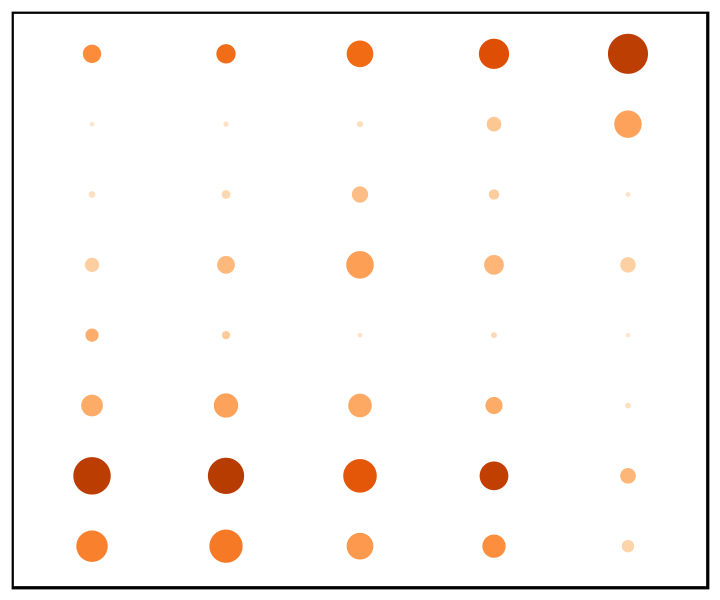

In [22]:
order_ct <- c('Exo', 'PP-Exo', 'PP', 'PP-eEP', 'eEP')

DefaultAssay(PP_Exo_EP_Subset_X) <- "RNA"
Idents(PP_Exo_EP_Subset_X) <- "celltype_PP_Exo_EP_subset"

# Force the order
PP_Exo_EP_Subset_X$celltype_PP_Exo_EP_subset <- factor(
  PP_Exo_EP_Subset_X$celltype_PP_Exo_EP_subset,
  levels = order_ct
)
Idents(PP_Exo_EP_Subset_X) <- "celltype_PP_Exo_EP_subset"

#Ed colors
library(RColorBrewer)

# Palette (same as your FeaturePlots)
purples_pal <- colorRampPalette(brewer.pal(9, "Oranges")[2:9])

# Gene Expression Dotplot
DefaultAssay(PP_Exo_EP_Subset_X) <- "RNA"
Idents(PP_Exo_EP_Subset_X) <- "celltype_PP_Exo_EP_subset"

genes <- c(
    'STAT1','SPINK1','SOX9','CFTR',
    #'GATA4','GATA6',
    'PDX1','PTF1A',
    'NEUROG3','CHGA'
)

options(repr.plot.width = 6, repr.plot.height = 5)

dp_celltype <- DotPlot(
  PP_Exo_EP_Subset_X,
  features  = genes,
  dot.scale = 10,
  scale     = FALSE    # 🔴 keep raw avg.exp, so 0–8 is meaningful
) +
  NoLegend() +
  geom_point(
    aes(size = pct.exp),
    shape  = 21,
    colour = NA,
    stroke = 0.5
  ) +
  coord_flip() +
  # 🔴 same color scale as FeaturePlot: 0–8, Oranges[2:9]
  scale_colour_gradientn(
    limits  = c(0, 5),
    colours = purples_pal(100)
  ) +
  NoAxes() +
  guides(
    size = guide_legend(
      override.aes = list(shape = 21, colour = "black", fill = "white")
    )
  ) +
  theme(
    panel.border     = element_rect(colour = "black", fill = NA, size = 1),
    panel.margin     = unit(0, "cm"),
    panel.background = element_rect(fill = "white")
  )

dp_celltype #Fig. S19B

ggsave(
    filename = file.path('outputs/celloracle_figures/DT_Subset_PP_Exo_EP/RNA_Expression_DotPlot.png'),
    plot     = dp_celltype,
    width    = 2.7, height = 2.7, units = "in",
    dpi      = 600,
    bg       = "white",
    device   = ragg::agg_png  # crisp text/lines
  )

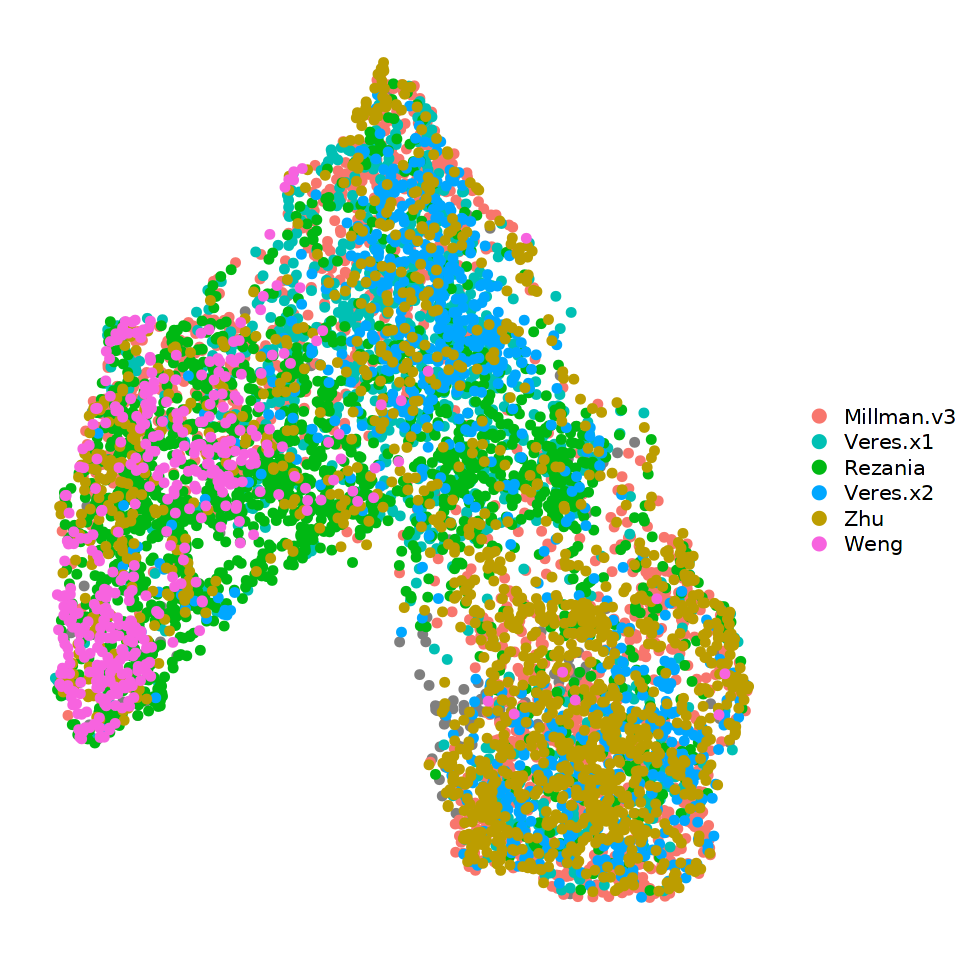

In [16]:
pal_protocol <- c(
        "Weng" = "#F763DF",  # yellow
        "Veres.x2"       = "#00a7ff", # magenta / raspberry
        "Veres.x1"       = "#00C0B4", # light sky blue
        "Rezania"       = "#00B813", # radiactive green
        "Zhu"       = "#bc9d00", # olive green
        "Millman.v3" = "#F8766D" # salmon
        # #E9842C Orange
         )

p <- DimPlot(
  PP_Exo_EP_Subset_X,
  reduction = "umap",
  group.by  = "protocol",
  label     = FALSE,
    pt.size = 1.8,
    cols = pal_protocol,
    order     = c( "Weng","Zhu",'Veres.x2','Rezania','Veres.x1',"Millman.v3")

) +
  NoAxes() +
  theme(plot.title = element_blank()) +
  labs(x = NULL, y = NULL)

# preview
p #Fig. S19A

# save @ 600 dpi (PNG)
ggsave(
  filename = "outputs/celloracle_figures/DT_Subset_PP_Exo_EP/umap_DT_PP_Exo_EP_Subset_protocol_legend_noaxes.png",
  plot     = p,
  width    = 7, height = 7, units = "in",
  dpi      = 600,
  bg       = "white",
  device   = ragg::agg_png  # crisp text/lines
)

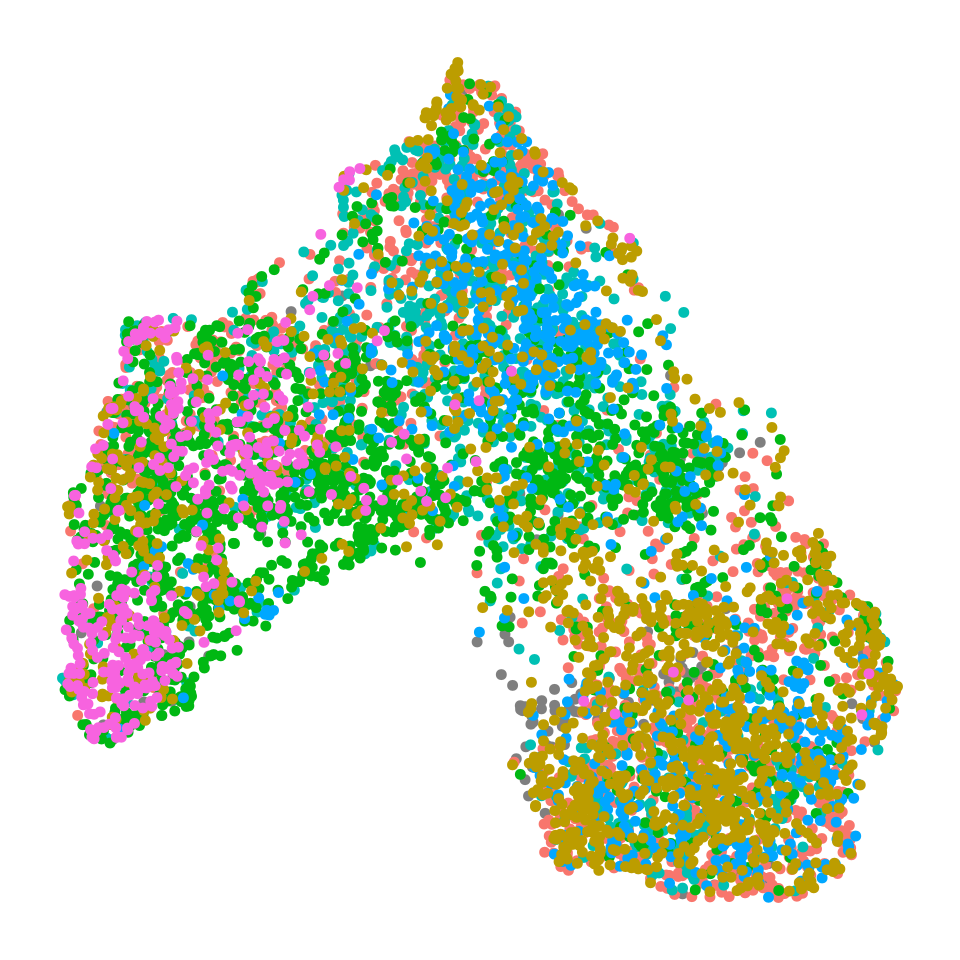

In [17]:
pal_protocol <- c(
        "Weng" = "#F763DF",  # yellow
        "Veres.x2"       = "#00a7ff", # magenta / raspberry
        "Veres.x1"       = "#00C0B4", # light sky blue
        "Rezania"       = "#00B813", # radiactive green
        "Zhu"       = "#bc9d00", # olive green
        "Millman.v3" = "#F8766D" # salmon
        # #E9842C Orange
         )

p <- DimPlot(
  PP_Exo_EP_Subset_X,
  reduction = "umap",
  group.by  = "protocol",
  label     = FALSE,
    pt.size = 1.8,
    cols = pal_protocol,
    order     = c( "Weng","Zhu",'Veres.x2','Rezania','Veres.x1',"Millman.v3")

) +
  NoLegend() +
  NoAxes() +
  theme(plot.title = element_blank()) +
  labs(x = NULL, y = NULL)

# preview
p #Fig. S19A

# save @ 600 dpi (PNG)
ggsave(
  filename = "outputs/celloracle_figures/DT_Subset_PP_Exo_EP/umap_DT_PP_Exo_EP_Subset_protocol_nolegend_noaxes.png",
  plot     = p,
  width    = 7, height = 7, units = "in",
  dpi      = 600,
  bg       = "white",
  device   = ragg::agg_png  # crisp text/lines
)

In [18]:
get_first_cell_by_umap <- function(
  PP_Exo_EP_Subset_X,
  reduction = "umap",
  umap1_low  = -2,   # lower bound (order doesn't matter; will be sorted)
  umap1_high = -0,  # upper bound
  umap2_low  = 5.9,  # lower bound
  umap2_high = 6.1,  # upper bound
  inclusive = FALSE,
  n = 1,            # how many cell names to return (1 = first)
  error_on_empty = TRUE
) {
  emb <- Seurat::Embeddings(PP_Exo_EP_Subset_X, reduction = reduction)

  # Try to detect the two UMAP dims
  col1 <- grep("_1$", colnames(emb), value = TRUE)
  col2 <- grep("_2$", colnames(emb), value = TRUE)
  if (length(col1) != 1 || length(col2) != 1) {
    stop("Could not uniquely identify UMAP_1 and UMAP_2 columns.")
  }

  # Normalize bounds (so low <= high even if user swaps them)
  rng1 <- sort(c(umap1_low, umap1_high))
  rng2 <- sort(c(umap2_low, umap2_high))

  x1 <- emb[, col1]
  x2 <- emb[, col2]

  if (inclusive) {
    hits <- which(x1 >= rng1[1] & x1 <= rng1[2] &
                  x2 >= rng2[1] & x2 <= rng2[2])
  } else {
    hits <- which(x1 >  rng1[1] & x1 <  rng1[2] &
                  x2 >  rng2[1] & x2 <  rng2[2])
  }

  if (length(hits) == 0) {
    if (error_on_empty) stop("No cells found meeting the UMAP criteria.")
    return(NA_character_)
  }

  hits <- hits[seq_len(min(n, length(hits)))]
  rownames(emb)[hits]
}

# Examples:
 get_first_cell_by_umap(PP_Exo_EP_Subset_X, n = 15)                     # first hit (default ranges)
# get_first_cell_by_umap(Beta_EC_subset_11, n = 5)              # first 5 hits
# get_first_cell_by_umap(Beta_EC_subset_11, inclusive = TRUE)
# get_first_cell_by_umap(Beta_EC_subset_11, error_on_empty = FALSE)  # returns NA if none


[1] "s5d3_AAGACAAGTCTCACTG-1_paired"          
[2] "zhu.d11_GATGCTAAGCGTTCAT-1_expression"   
[3] "zhu.d11_GCCCAGATCGGCTGAC-1_expression"   
[4] "zhu.d11_TCCCACATCTTCCCAG-1_expression"   
[5] "zhu.d14_TAATCTCTCCTAGCCT-1_expression"   
[6] "zhu.sn.d21_ATTCGTTCACACGGAA-1_expression"
[7] "zhu.sn.d21_TACATTCCAAGCCTGC-1_expression"

In [19]:
# 1) Convert Seurat -> CDS
seurat_cds <- as.cell_data_set(PP_Exo_EP_Subset_X)

# 2) Grab the UMAP you want from Seurat
umap <- Embeddings(PP_Exo_EP_Subset_X, "umap")  # rows = cells, cols = UMAP1/2

# 3) Make sure cell names match and are in the same order
common <- intersect(rownames(umap), colnames(seurat_cds))
seurat_cds <- seurat_cds[, common]          # subset cds to shared cells (keeps order of 'common')
umap  <- umap[common, , drop = FALSE]

# 4) Set it as the UMAP in the CDS (name must be exactly "UMAP")
reducedDims(seurat_cds)$UMAP <- umap

# (optional) carry over Seurat clusters/metadata
colData(seurat_cds)$seurat_clusters <- Idents(PP_Exo_EP_Subset_X)[common]

# 5) Now cluster in Monocle3 using that UMAP space
seurat_cds <- cluster_cells(seurat_cds, reduction_method = "UMAP")

# If you then want a trajectory:
seurat_cds <- learn_graph(seurat_cds, use_partition=TRUE, learn_graph_control=list(ncenter=1000), verbose=FALSE)   

# i_cds <- order_cells(i_cds, root_cells = <vector_of_root_cell_names>)

seurat_cds <- order_cells(seurat_cds, reduction_method = "UMAP",
                          root_cells = 'zhu.d11_GATGCTAAGCGTTCAT-1_expression') 

PP_Exo_EP_Subset_X <- AddMetaData(
  object = PP_Exo_EP_Subset_X,
  metadata = seurat_cds@principal_graph_aux@listData$UMAP$pseudotime,
  col.name = "pseudotime_PP_Exo_EP_subset") 

Warning message:
“`invoke()` is deprecated as of rlang 0.4.0.
Please use `exec()` or `inject()` instead.
This warning is displayed once every 8 hours.”
Warning message:
“Monocle 3 trajectories require cluster partitions, which Seurat does not calculate. Please run 'cluster_cells' on your cell_data_set object”


  |======================================================================| 100%


Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


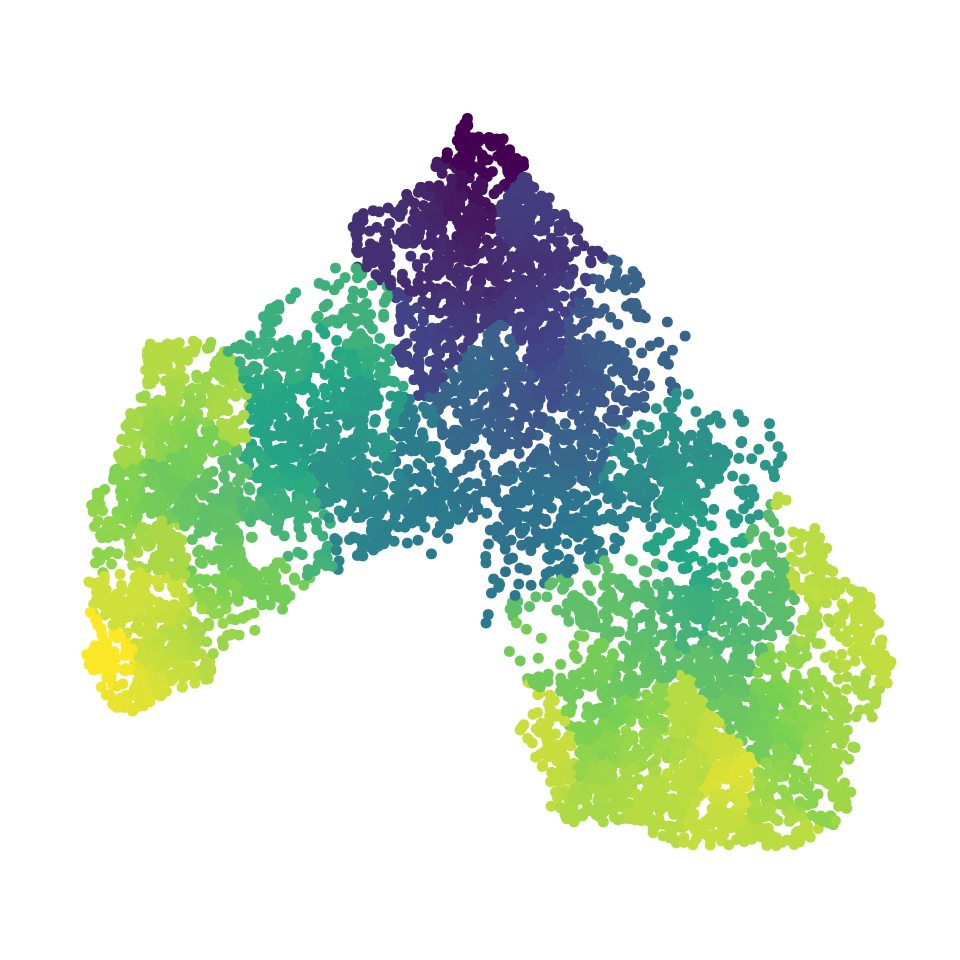

In [20]:
f1 <- FeaturePlot(PP_Exo_EP_Subset_X, c('pseudotime_PP_Exo_EP_subset'), reduction = 'umap', pt.size = 1.8) +
  scale_color_viridis_c()
f1 <- f1 + theme(legend.position = "none") +
      NoAxes() +
      theme(plot.title = element_blank()) +
      labs(x = NULL, y = NULL)

f1

# save @ 600 dpi (PNG)
ggsave(
  filename = "outputs/celloracle_figures/DT_Subset_PP_Exo_EP/umap_DT_PP_Exo_EP_pseudotime_nolegend_noaxis.png",
  plot     = f1,
  width    = 7, height = 7, units = "in",
  dpi      = 600,
  bg       = "white",
  device   = ragg::agg_png  # crisp text/lines
)

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


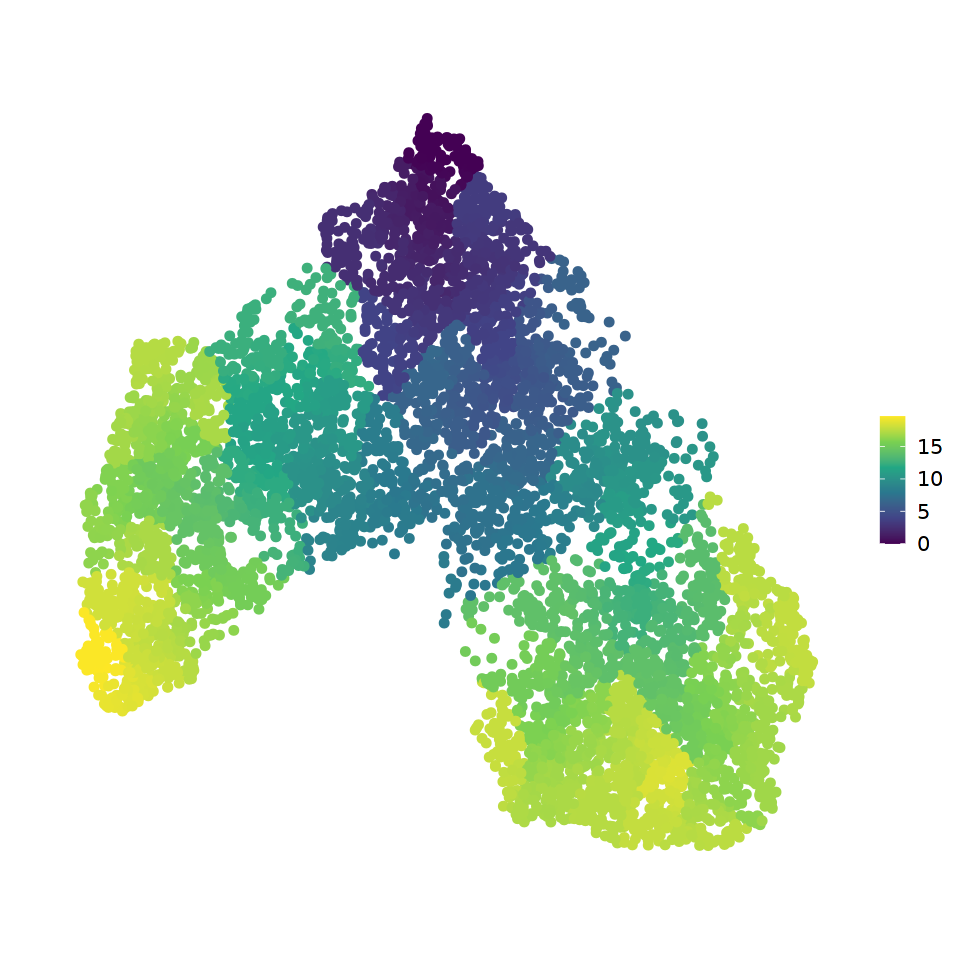

In [21]:
f1 <- FeaturePlot(PP_Exo_EP_Subset_X, c('pseudotime_PP_Exo_EP_subset'), reduction = 'umap', pt.size = 1.8) +
  scale_color_viridis_c()
f1 <- f1 + theme(legend.position = "right") +
      NoAxes() +
      theme(plot.title = element_blank()) +
      labs(x = NULL, y = NULL)

f1 #Fig. 4B

# save @ 600 dpi (PNG)
ggsave(
  filename = "outputs/celloracle_figures/DT_Subset_PP_Exo_EP/umap_DT_PP_Exo_EP_pseudotime_legend_noaxis.png",
  plot     = f1,
  width    = 7, height = 7, units = "in",
  dpi      = 600,
  bg       = "white",
  device   = ragg::agg_png  # crisp text/lines
)

Warning message:
“Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead.
ℹ The deprecated feature was likely used in the monocle3 package.
  Please report the issue to the authors.”
Warning message:
“The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead.
ℹ The deprecated feature was likely used in the monocle3 package.
  Please report the issue to the authors.”


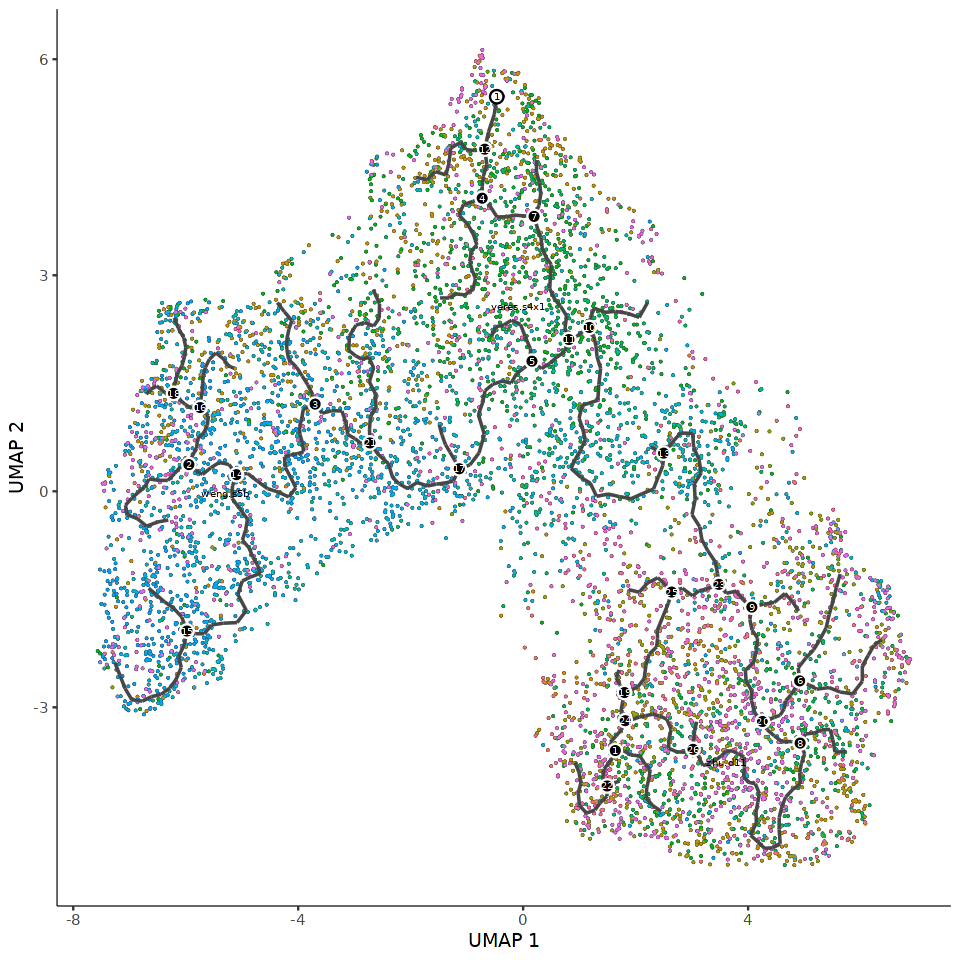

In [22]:
plot_cells(seurat_cds, color_cells_by="orig.ident", label_groups_by_cluster=TRUE, label_leaves=FALSE, label_branch_points=TRUE)

In [23]:
saveRDS(PP_Exo_EP_Subset_X, file = "checkpoints/DT_Subset_PP_Exo_EP.rds")

# Export PP Exo EP

In [54]:
#Export for Python for future analysis

#Set working directory
setwd("/storage1/fs1/jmillman/Active/DigitalTwin")

# write matrix data (gene expression counts) 
counts_matrix <- GetAssayData(PP_Exo_EP_Subset_X, assay='RNA', slot='counts')
writeMM(counts_matrix, file=paste0(file='checkpoints/DT_Subset_PP_Exo_EP_matrix.mtx'))

# write dimensional reduction matrix (PCA)
write.csv (PP_Exo_EP_Subset_X@reductions$pca@cell.embeddings, 
           file='checkpoints/DT_Subset_PP_Exo_EP_pca.csv', quote=F, row.names=F)

# write gene names
write.table(data.frame('gene'=rownames(counts_matrix)),
            file='checkpoints/DT_Subset_PP_Exo_EP_gene_names.csv',
            quote=F,row.names=F,col.names=F)

# save metadata table:
PP_Exo_EP_Subset_X$barcode <- colnames(PP_Exo_EP_Subset_X)
PP_Exo_EP_Subset_X$UMAP_1 <- PP_Exo_EP_Subset_X@reductions$umap@cell.embeddings[,1]
PP_Exo_EP_Subset_X$UMAP_2 <- PP_Exo_EP_Subset_X@reductions$umap@cell.embeddings[,2]
write.csv(PP_Exo_EP_Subset_X@meta.data, file='checkpoints/DT_Subset_PP_Exo_EP_metadata.csv', 
          quote=F, row.names=F)

red <- PP_Exo_EP_Subset_X@reductions
red
for (reduction_name in names(red)){
    write.csv(as.data.frame(red[reduction_name][[1]]@cell.embeddings),
              file = paste0("checkpoints/DT_Subset_PP_Exo_EP_", reduction_name,  ".csv"))
  }


NULL

$RNAHARMONY
A dimensional reduction object with key RNAHARMONY_ 
 Number of dimensions: 50 
 Number of cells: 6726 
 Projected dimensional reduction calculated:  FALSE 
 Jackstraw run: FALSE 
 Computed using assay: RNA 

$RNAINTEGRATED_LSI
A dimensional reduction object with key RNAINTEGRATEDLSI_ 
 Number of dimensions: 30 
 Number of cells: 6726 
 Projected dimensional reduction calculated:  FALSE 
 Jackstraw run: FALSE 
 Computed using assay: RNA 

$RNAMULTIVI
A dimensional reduction object with key RNAMULTIVI_ 
 Number of dimensions: 50 
 Number of cells: 6726 
 Projected dimensional reduction calculated:  FALSE 
 Jackstraw run: FALSE 
 Computed using assay: RNA 

$RNAPCA
A dimensional reduction object with key RNAPCA_ 
 Number of dimensions: 50 
 Number of cells: 6726 
 Projected dimensional reduction calculated:  FALSE 
 Jackstraw run: FALSE 
 Computed using assay: RNA 

$RNAUMAP
A dimensional reduction object with key RNAUMAP_ 
 Number of dimensions: 2 
 Number of cells: 6726 
 P

In [64]:
#Pero hasta un reloj roto, da la hora dos veces al dia. - No tengo hambre, tengo ansiedad by Alan Sutton y las criaturitas